# Summary of the present code

 - Import relevant packages to be used a lot along the code
 - Import data-sets
     -- Descriptions about the type of data and how to access it are included.
 - Calculate side variables
     -- i.e. max temperature per day or accumulated rain in 'n' days 
 - plot datasets to compare temporal and spatial density, evaluate variables available, wierd or missing data, etc.
 - plot combinations of datasets to start getting some patterns/relationships (i.e. cell counts vs dissolved nutrients)

# Import relevant packages

In [1]:
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from scipy import stats

# Import data sets

Water Temperature and Conductivity at Sewells point station (2000 to 2017)

    Data is publicly available at https://tidesandcurrents.noaa.gov/physocean.html?bdate=20190101&edate=20191231&units=metric&timezone=GMT&id=8638610&interval=h&action=data

    Station name: Sewells Point, VA

    Station ID: 8638610

    Data contains hourly measurements of water temperature and conductivity

    The page only allows you to download 365 days of data. Therefore, you have to download manually each year if more than one is require.

In [48]:
infile_data_WatTem_Cond_Sewells='C:/Users/a_mac/Box Sync/current projects/MTM through the year/0_NFK_weather_review/WatTemp_Conduct_Sewellspoint_2000to2017_filled.csv'
data_WatTem_Cond_Sewells=pd.read_csv(infile_data_WatTem_Cond_Sewells)
data_WatTem_Cond_Sewells

,Date,month,day,year,Time_GMT,WatTemp_C,Conduct_mS_cm
0,1/1/2000,1,1,2000,0.000000,6.3,NaN
1,1/1/2000,1,1,2000,0.041667,6.3,NaN
2,1/1/2000,1,1,2000,0.083333,6.3,NaN
3,1/1/2000,1,1,2000,0.125000,6.3,NaN
4,1/1/2000,1,1,2000,0.166667,6.2,NaN
5,1/1/2000,1,1,2000,0.208333,6.2,NaN
6,1/1/2000,1,1,2000,0.250000,6.0,NaN
7,1/1/2000,1,1,2000,0.291667,6.1,NaN
8,1/1/2000,1,1,2000,0.333333,6.1,NaN
9,1/1/2000,1,1,2000,0.375000,6.0,NaN


Summer Sampling Cell counts

    Data compiled and shared by Margaret Mulholland (ODU)
    
    compilation contains cell counts from NYCC and AC stations
    
    Data available from 2012 to 2018
    
    Values correspond to a single day. The time of sampling is not specified, but it is assumed to be around noon.

In [3]:
infile_cellcount_dataflow2='C:/Users/a_mac/Desktop/dataflow_lowCPB/Phyto_data_AC_and_NYCC_compil.csv'
data_cellcount_dataflow2=pd.read_csv(infile_cellcount_dataflow2)
data_cellcount_dataflow2

C:\Users\a_mac\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Total_serial_numb,Year,Month,Day,Week,Season,Analyst,ODUnumb,HRSD_numb,Segment,...,Gymnodinium_instriatum_ml,Gymnodinium_spp_ml,Dinoflagellate_unid_ml,Pseudo_nitzchia_ml,Gyrodinium_spp_ml,A_monilatum_ml,Raphidophytes,Cyanobacteria_bloom,C_poly_ug_L,C_poly_PERCENT_biomass
0,258,2012,2.0,NaN,7.0,NaN,NaN,1.0,689.0,LAF,...,0,110,0,0,0,0.0,0,NaN,0.000000,0.000000
1,258,2012,2.0,NaN,7.0,NaN,NaN,1.0,689.0,LAF,...,0,110,0,0,0,0.0,0,NaN,0.000000,0.000000
2,258,2012,2.0,NaN,7.0,NaN,NaN,1.0,689.0,LAF,...,0,110,0,0,0,0.0,0,NaN,0.000000,0.000000
3,258,2012,2.0,NaN,7.0,NaN,NaN,1.0,689.0,LAF,...,0,110,0,0,0,0.0,0,NaN,0.000000,0.000000
4,258,2012,2.0,NaN,7.0,NaN,NaN,1.0,689.0,LAF,...,0,110,0,0,0,0.0,0,NaN,0.000000,0.000000
5,258,2012,2.0,NaN,7.0,NaN,NaN,1.0,689.0,LAF,...,0,110,0,0,0,0.0,0,NaN,0.000000,0.000000
6,258,2012,2.0,NaN,7.0,NaN,NaN,1.0,689.0,LAF,...,0,110,0,0,0,0.0,0,NaN,0.000000,0.000000
7,258,2012,2.0,NaN,7.0,NaN,NaN,1.0,689.0,LAF,...,0,110,0,0,0,0.0,0,NaN,0.000000,0.000000
8,258,2012,2.0,NaN,7.0,NaN,NaN,1.0,689.0,LAF,...,0,110,0,0,0,0.0,0,NaN,0.000000,0.000000
9,277,2012,2.0,NaN,8.0,NaN,NaN,19.0,740.0,LAF,...,0,200,60,0,0,0.0,0,NaN,0.000000,0.000000


Cell counts from Data-FLOW transects along James and Elizabeth River 

    Data compiled and shared by Margaret Mulholland (ODU)
    
    compilation contains cell counts from transects along the James and Elizabeth River
    
    Data available from 2011 to 2018
    
    Values correspond to a specific temporal and spatial (coordinates) stamp

In [4]:
infile_cellcount_dataflow='C:/Users/a_mac/Desktop/dataflow_lowCPB/ODUHRSD_2011_2018_DATAFLOW.csv'
data_cellcount_dataflow=pd.read_csv(infile_cellcount_dataflow)
data_cellcount_dataflow

,TotalSerial,Year,Season,Month,weeknum,AnnualODUSerial,Segment,HRSD_NUM,Date,Lat,...,Cochlodinium_1000_cells_ml,Cochlodinium_10000_cells_ml,Cochlodinium_50_PERCNT_biomass,Cochlodinium_PERCNT_of_total_biomass,diatoms_and_dinos,HRSD_NUM.1,YSICHLA_RAW_ug_L,CORRECTED_CHLA_ug_L,CP_GT_1000,CHLA_BIN
0,50,2011,Spring,5,19,51.0,NaN,NaN,5/3/2011,36.955100,...,NaN,NaN,NaN,0.000000,100.000000,NaN,NaN,0.500,NaN,0-10
1,2,2011,Spring,3,12,2.0,ELIPH,10.0,3/15/2011,36.922567,...,NaN,NaN,NaN,0.000000,100.000000,10.0,19.9,20.051,NaN,20-30
2,7,2011,Spring,3,13,8.0,ELIPH,34.0,3/21/2011,36.858017,...,NaN,NaN,NaN,0.000000,100.000000,34.0,24.1,25.049,NaN,20-30
3,8,2011,Spring,3,13,7.0,ELIPH,43.0,3/21/2011,36.884117,...,NaN,NaN,NaN,0.000000,99.015549,43.0,17.0,16.600,NaN,20-Oct
4,18,2011,Spring,4,15,18.0,ELIPH,93.0,4/4/2011,36.927533,...,NaN,NaN,NaN,0.000000,99.188445,93.0,15.0,14.220,NaN,20-Oct
5,19,2011,Spring,4,15,19.0,ELIPH,96.0,4/6/2011,36.925700,...,NaN,NaN,NaN,0.000000,100.000000,96.0,25.7,26.953,NaN,20-30
6,26,2011,Spring,4,15,27.0,ELIPH,141.0,4/7/2011,36.884267,...,NaN,NaN,NaN,0.000000,100.000000,141.0,19.1,19.099,NaN,20-Oct
7,46,2011,Spring,4,18,46.0,ELIPH,200.0,4/27/2011,36.890183,...,NaN,NaN,NaN,0.000000,95.168758,200.0,16.0,15.410,NaN,20-Oct
8,52,2011,Spring,5,19,53.0,ELIPH,202.0,5/5/2011,36.904500,...,NaN,NaN,NaN,0.000000,100.000000,202.0,7.7,5.533,NaN,0-10
9,55,2011,Spring,5,20,56.0,ELIPH,206.0,5/10/2011,36.903700,...,NaN,NaN,NaN,0.000000,100.000000,206.0,9.2,7.318,NaN,0-10


Data-FLOW transects through the **Elizabeth river**

    Data from VECOS website, http://vecos.vims.edu/Default.aspx
    
    data contains meassurements dones with a probe (i.e. YSI Chl or Temperature)
    
    Data available from 2008 to 2015
    
    Values correspond to a specific temporal and spatial (coordinates) stamp

In [5]:
infile_dataFLOW_Jam='C:/Users/a_mac/Desktop/dataflow_lowCPB/dataflow_JamesR/Summary_dataFLOW_ELIPH.csv'
data_dataFLOW_Jam=pd.read_csv(infile_dataFLOW_Jam)
data_dataFLOW_Jam

C:\Users\a_mac\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (8,28,33,38,43,48,53,58,68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,idCollectionEvent,PROJECT,SOURCE,SAMPLE_DATETIME,SAMPLE_DATE,SAMPLE_MONTH,SAMPLE_DAY,SAMPLE_YEAR,SAMPLE_TIME,CRUISE_TRACK,...,TCHL_PRE_CAL_UNITS,TCHL_PRE_CAL_A,TCHL_PRE_CAL_QUALIFIER,TCHL_PRE_CAL_METHOD,CHLA,CHLA_UNITS,CHLA_A,CHLA_QUALIFIER,CHLA_METHOD,COMMENTS
0,2013,DFLO,HRSD,4/29/2008 9:03,4/29/2008,4,29,2008,0.377488,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
1,2013,DFLO,HRSD,4/29/2008 9:03,4/29/2008,4,29,2008,0.377535,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
2,2013,DFLO,HRSD,4/29/2008 9:03,4/29/2008,4,29,2008,0.377581,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
3,2013,DFLO,HRSD,4/29/2008 9:03,4/29/2008,4,29,2008,0.377627,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
4,2013,DFLO,HRSD,4/29/2008 9:03,4/29/2008,4,29,2008,0.377674,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
5,2013,DFLO,HRSD,4/29/2008 9:03,4/29/2008,4,29,2008,0.37772,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
6,2013,DFLO,HRSD,4/29/2008 9:03,4/29/2008,4,29,2008,0.377766,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
7,2013,DFLO,HRSD,4/29/2008 9:04,4/29/2008,4,29,2008,0.377812,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
8,2013,DFLO,HRSD,4/29/2008 9:04,4/29/2008,4,29,2008,0.377859,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
9,2013,DFLO,HRSD,4/29/2008 9:04,4/29/2008,4,29,2008,0.377905,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN


Data-FLOW transects through the **Lafayette river**

    Data from VECOS website, http://vecos.vims.edu/Default.aspx
    
    data contains meassurements dones with a probe (i.e. YSI Chl or Temperature)
    
    Data available from 2008 to 2015
    
    Values correspond to a specific temporal and spatial (coordinates) stamp

In [6]:
infile_dataFLOW_laf='C:/Users/a_mac/Desktop/dataflow_lowCPB/dataflow_lowLafayette/Summary_dataFLOW_LAFMH.csv'
data_dataFLOW_laf=pd.read_csv(infile_dataFLOW_laf)
data_dataFLOW_laf

C:\Users\a_mac\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (8,25,28,33,38,43,48,53,58,59,68,69,76) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,idCollectionEvent,PROJECT,SOURCE,SAMPLE_DATETIME,SAMPLE_DATE,SAMPLE_MONTH,SAMPLE_DAY,SAMPLE_YEAR,SAMPLE_TIME,CRUISE_TRACK,...,TCHL_PRE_CAL_UNITS,TCHL_PRE_CAL_A,TCHL_PRE_CAL_QUALIFIER,TCHL_PRE_CAL_METHOD,CHLA,CHLA_UNITS,CHLA_A,CHLA_QUALIFIER,CHLA_METHOD,COMMENTS
0,2014,DFLO,HRSD,4/29/2008 8:32,4/29/2008,4,29,2008,0.355556,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
1,2014,DFLO,HRSD,4/29/2008 8:32,4/29/2008,4,29,2008,0.355556,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
2,2014,DFLO,HRSD,4/29/2008 8:32,4/29/2008,4,29,2008,0.355556,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
3,2014,DFLO,HRSD,4/29/2008 8:32,4/29/2008,4,29,2008,0.355556,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
4,2014,DFLO,HRSD,4/29/2008 8:32,4/29/2008,4,29,2008,0.355556,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
5,2014,DFLO,HRSD,4/29/2008 8:32,4/29/2008,4,29,2008,0.355556,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
6,2014,DFLO,HRSD,4/29/2008 8:32,4/29/2008,4,29,2008,0.355556,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
7,2014,DFLO,HRSD,4/29/2008 8:32,4/29/2008,4,29,2008,0.355556,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
8,2014,DFLO,HRSD,4/29/2008 8:32,4/29/2008,4,29,2008,0.355556,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN
9,2014,DFLO,HRSD,4/29/2008 8:32,4/29/2008,4,29,2008,0.355556,ELI04292008,...,UG/L,NaN,NaN,F01,-1,UG/L,NND,NaN,NND,NaN


Nutrient data from daily sampling campaign 
    
    This data is only a compilation of samples collected at the NYCC station. Data is available for the 'AC' station, but a compilation will have to be done
    
    Data available from 2012 to 2019 summer sampling campigns
    
    Data is available in the 'HRSD_Layafette River' folder in the ODU-BOX
        HRSD_Lafayette River > Compiled-All Years > 2012_2015_Nuts master.xlsx
    
    For the remaining years, data has to be extracted from individual files within the ODU-BOX
        HRSD_Lafayette River > Sampling 2016 > Nutrient, Chlorophyll & MS Data > NYCC_2016_nutrients.xlsx
        HRSD_Lafayette River > Sampling 2017 > Nutrient, Chlorophyll, & MS Data > NYCC2017_Nutrients Summary.xlsx
        HRSD_Lafayette River > Sampling 2018 > Nutrients AC_NYCC 2018 > NYCC_AC_2018_nutrients.xlsx
        
    For 2019, you have to combine separete files for results comming from the AutoAnalizer and those for ammonium
        HRSD_Lafayette River > Sampling 2019 > Nutrients NYCC_AC 2019 > NYCC2019 NUTRIENT MASTER.xlsx
        HRSD_Lafayette River > Sampling 2019 > Nutrients NYCC_AC 2019 > Summary_NH4_2019_summer_sampling.xlsx

In [55]:
infile_NYCC_NUTS='C:/Users/a_mac/Box Sync/current projects/MTM through the year/0_NFK_weather_review/NYCC_dailysampling_nutrients_2012to2015.csv'
data_NYCC_NUTS=pd.read_csv(infile_NYCC_NUTS)
data_NYCC_NUTS

,Date,Month,Day,Year,Depth,NH4_uM,NH4_std,NH4_surf_bottom_ratio,NO2_uM,NO2_std,...,NO3_std,NO3_surf_bottom_ratio,DIN_uM,NID_std,PO4_uM,PO4_std,PO4_surf_bottom_ratio,DIN_PO4_ratio,TDN_uM,TDN_uM.1
0,6/3/2013,6,3,2013,NaN,2.779000,0.015,NaN,0.201075,0.033383,...,0.166025,NaN,4.631,0.163342,0.3095,0.014849,NaN,14.961304,21.2520,0.149907
1,6/4/2013,6,4,2013,NaN,4.116000,0.016,NaN,0.370880,0.017918,...,0.317996,NaN,7.387,0.317901,0.2615,0.014849,NaN,28.247065,20.0835,3.335423
2,6/5/2013,6,5,2013,NaN,1.269000,0.031,NaN,0.263360,0.008570,...,0.225023,NaN,2.808,0.227031,0.1960,0.001414,NaN,14.327181,25.0220,1.643316
3,6/6/2013,6,6,2013,NaN,0.742000,0.011,NaN,0.103335,0.013923,...,0.052099,NaN,1.412,0.051480,0.0450,0.000000,NaN,31.372931,11.5840,0.384666
4,6/7/2013,6,7,2013,NaN,2.347000,0.020,NaN,0.281850,0.034776,...,0.088441,NaN,3.114,0.083724,0.0690,0.005657,NaN,45.137389,12.1805,0.125158
5,6/8/2013,6,8,2013,NaN,3.378000,0.007,NaN,0.570280,0.049964,...,0.562253,NaN,6.265,0.560068,0.2290,0.072125,NaN,27.357434,15.5170,0.132936
6,6/9/2013,6,9,2013,NaN,0.818000,0.022,NaN,0.432815,0.035391,...,0.143040,NaN,3.029,0.140302,0.0125,0.000707,NaN,242.329664,17.0035,1.324411
7,6/10/2013,6,10,2013,NaN,1.984000,0.030,NaN,0.172365,0.002383,...,0.182449,NaN,3.274,0.184945,0.0940,0.022627,NaN,34.828645,13.3810,0.465276
8,6/11/2013,6,11,2013,NaN,3.762000,0.015,NaN,0.270070,0.020421,...,0.032635,NaN,5.709,0.029642,0.1960,0.015556,NaN,29.129674,17.3535,0.587606
9,6/12/2013,6,12,2013,NaN,2.223000,0.034,NaN,0.402770,0.019460,...,0.720098,NaN,4.850,0.720645,0.0540,0.009899,NaN,89.811459,15.4840,1.828578


Waste Water data

    You have to request by email this data. They ask you specific questions about what variables do you want and for which period of time.
    
    In this case they send me monthly averages of TN and TP (both in mg/L) from 2012 to 2020.
    
    From the raw data, I calculated TN and TP in mmol/L and the TN:TP molar ratio.

In [110]:
infile_NFK_wastewater='C:/Users/a_mac/Box Sync/current projects/MTM through the year/0_NFK_weather_review/Waste_water_NFK_VIP_TN_TP_FOIA.csv'
data_NFK_wastewater=pd.read_csv(infile_NFK_wastewater)
data_NFK_wastewater

,month,year,TN_Monthly_Average_mgL,TP_Monthly_Average_mgL,N_mmol_L,P_mmol_L,TNTP_molar_ratio
0,1.0,2012.0,10.0,0.34,0.74000,0.0110,67.405294
1,2.0,2012.0,9.0,0.70,0.64286,0.0226,28.441837
2,3.0,2012.0,9.1,0.49,0.64714,0.0158,40.902070
3,4.0,2012.0,9.1,0.53,0.65286,0.0171,38.149030
4,5.0,2012.0,9.1,0.51,0.64929,0.0165,39.428193
5,6.0,2012.0,8.0,0.45,0.57357,0.0145,39.474460
6,7.0,2012.0,7.1,0.46,0.50714,0.0149,34.143944
7,8.0,2012.0,8.0,0.27,0.57000,0.0087,65.381111
8,9.0,2012.0,7.9,0.32,0.56071,0.0103,54.266629
9,10.0,2012.0,8.8,0.53,0.62857,0.0171,36.729919


NFK international airport data (wind/precipitation)

    Data is publicly available at https://www.ncdc.noaa.gov/cdo-web/cart

    Station name: NORFOLK INTERNATIONAL AIRPORT, VA US

    Station ID: GHCND:USW00013737

    Data contains daily average of wind speed and wind direction, and daily values of accumulated precipitation.
    
    This dataset contains values from 2012 to 2020. However, data is available for longer/older periods of time

In [8]:
infile_NFK_airport='C:/Users/a_mac/Box Sync/current projects/MTM through the year/0_NFK_weather_review/NCDC_NOAA_precipitation_wind_2012_2020_NFK_IntAirport.csv'
data_NFK_airport=pd.read_csv(infile_NFK_airport)
data_NFK_airport.head()
data_NFK_airport

,STATION,NAME,LATITUDE,LONGITUDE,ELEVATION,DATE,month,day,year,AWND,...,TMIN,TMIN_ATTRIBUTES,WDF2,WDF2_ATTRIBUTES,WDF5,WDF5_ATTRIBUTES,WSF2,WSF2_ATTRIBUTES,WSF5,WSF5_ATTRIBUTES
0,USW00013737,"NORFOLK INTERNATIONAL AIRPORT, VA US",36.9033,-76.1922,9.1,1/1/2012,1,1,2012,4.5,...,3.3,",,X",200,",,X",200.0,",,X",11.2,",,X",14.3,",,X"
1,USW00013737,"NORFOLK INTERNATIONAL AIRPORT, VA US",36.9033,-76.1922,9.1,1/2/2012,1,2,2012,3.5,...,2.8,",,X",290,",,X",280.0,",,X",6.7,",,X",11.2,",,X"
2,USW00013737,"NORFOLK INTERNATIONAL AIRPORT, VA US",36.9033,-76.1922,9.1,1/3/2012,1,3,2012,5.5,...,-2.8,",,X",350,",,X",330.0,",,X",10.3,",,X",16.5,",,X"
3,USW00013737,"NORFOLK INTERNATIONAL AIRPORT, VA US",36.9033,-76.1922,9.1,1/4/2012,1,4,2012,3.9,...,-4.4,",,X",220,",,X",210.0,",,X",7.2,",,X",15.6,",,X"
4,USW00013737,"NORFOLK INTERNATIONAL AIRPORT, VA US",36.9033,-76.1922,9.1,1/5/2012,1,5,2012,2.1,...,0.6,",,X",230,",,X",240.0,",,X",7.2,",,X",9.4,",,X"
5,USW00013737,"NORFOLK INTERNATIONAL AIRPORT, VA US",36.9033,-76.1922,9.1,1/6/2012,1,6,2012,5.1,...,0.6,",,X",220,",,X",230.0,",,X",9.4,",,X",11.2,",,X"
6,USW00013737,"NORFOLK INTERNATIONAL AIRPORT, VA US",36.9033,-76.1922,9.1,1/7/2012,1,7,2012,4.3,...,4.4,",,X",240,",,X",240.0,",,X",7.6,",,X",10.7,",,X"
7,USW00013737,"NORFOLK INTERNATIONAL AIRPORT, VA US",36.9033,-76.1922,9.1,1/8/2012,1,8,2012,3.1,...,5.0,",,X",30,",,X",40.0,",,X",7.2,",,X",8.9,",,X"
8,USW00013737,"NORFOLK INTERNATIONAL AIRPORT, VA US",36.9033,-76.1922,9.1,1/9/2012,1,9,2012,2.5,...,6.7,",,X",30,",,X",30.0,",,X",5.8,",,X",6.7,",,X"
9,USW00013737,"NORFOLK INTERNATIONAL AIRPORT, VA US",36.9033,-76.1922,9.1,1/10/2012,1,10,2012,1.7,...,5.0,",,X",220,",,X",NaN,NaN,4.5,",,X",NaN,NaN


Water level data from the NOAA station at Sewell's Point

    Data is publicly available at https://tidesandcurrents.noaa.gov/physocean.html?bdate=20190101&edate=20191231&units=metric&timezone=GMT&id=8638610&interval=h&action=data

    Station name: Sewells Point, VA

    Station ID: 8638610

    Data contains hourly measurements of water level. You have to specify the units (i.e. meters) and the point of reference (i.e. mean lower low water - MLLW)

    The page only allows you to download 365 days of data. Therefore, you have to download manually each year if more than one is require

In [54]:
infile_MLLW_Sewells='C:/Users/a_mac/Box Sync/current projects/MTM through the year/0_NFK_weather_review/MLLW_sewellspoint_2012plus1_20019.csv'
data_MLLW_Sewells=pd.read_csv(infile_MLLW_Sewells)
data_MLLW_Sewells.head()
# MLLW_Sewells

,Date,month,day,year,Time_GMT,Predicted_ft,preliminary_ft,Verified_ft
0,1/1/2012,1,1,2012,0.000000,0.039,-,0.106
1,1/1/2012,1,1,2012,0.041667,-0.005,-,0.054
2,1/1/2012,1,1,2012,0.083333,0.019,-,0.086
3,1/1/2012,1,1,2012,0.125000,0.110,-,0.204
4,1/1/2012,1,1,2012,0.166667,0.246,-,0.331


Summer Sampling YSI data at LAF001 station

    Data is available in the ODU Box. However, a compilation has to be done 
    
    Data is in different folders and, therefore, in separate spreadsheets by year (in SIX month invervals)
    
    Compilation goes from 2012 to 2019
    
    Values correspond to programmed meassurements done every few seconds at the surface of LAF001 station day and night. Values are available in the ODU-BOX for the bottom mooring and for the other summer sampling station.
    
    Data includes values normally meassured by a probe (i.e. YSI Chl or Temperature)

In [188]:
infile_jan_jun_2012='C:/Users/a_mac/Desktop/Lafayette_mooring/LAF001.63_6302012_Jan_Jun_2012.csv'
data_jan_jun_2012=pd.read_csv(infile_jan_jun_2012)
# data_jan_jun_2012

infile_jul_dec_2012='C:/Users/a_mac/Desktop/Lafayette_mooring/LAF001.63_12312012_Jul_Dec_2012.csv'
data_jul_dec_2012=pd.read_csv(infile_jul_dec_2012)
# data_jul_dec_2012

infile_jan_jun_2013='C:/Users/a_mac/Desktop/Lafayette_mooring/LAF001.63_6302012_Jan_Jun_2013.csv'
data_jan_jun_2013=pd.read_csv(infile_jan_jun_2013)
# data_jan_jun_2013

infile_jul_dec_2013='C:/Users/a_mac/Desktop/Lafayette_mooring/LAF001.63_12312012_Jul_Dec_2013.csv'
data_jul_dec_2013=pd.read_csv(infile_jul_dec_2013)
# data_jul_dec_2013

infile_jan_jun_2014='C:/Users/a_mac/Desktop/Lafayette_mooring/LAF001.63_6302012_Jan_Jun_2014.csv'
data_jan_jun_2014=pd.read_csv(infile_jan_jun_2014)
# data_jan_jun_2014

infile_jul_dec_2014='C:/Users/a_mac/Desktop/Lafayette_mooring/LAF001.63_12312012_Jul_Dec_2014.csv'
data_jul_dec_2014=pd.read_csv(infile_jul_dec_2014)
# data_jul_dec_2014

infile_jan_jun_2015='C:/Users/a_mac/Desktop/Lafayette_mooring/LAF001.63_6302012_Jan_Jun_2015.csv'
data_jan_jun_2015=pd.read_csv(infile_jan_jun_2015)
# data_jan_jun_2015

infile_jul_dec_2015='C:/Users/a_mac/Desktop/Lafayette_mooring/LAF001.63_12312012_Jul_Dec_2015.csv'
data_jul_dec_2015=pd.read_csv(infile_jul_dec_2015)
# data_jul_dec_2015

infile_jul_dec_2016='C:/Users/a_mac/Desktop/Lafayette_mooring/LAF001.63_12312012_Jul_Dec_2016.csv'
data_jul_dec_2016=pd.read_csv(infile_jul_dec_2016)
# data_jul_dec_2016

infile_jan_jun_2017='C:/Users/a_mac/Desktop/Lafayette_mooring/LAF001.63_6302012_Jan_Jun_2017.csv'
data_jan_jun_2017=pd.read_csv(infile_jan_jun_2017)
# data_jan_jun_2017

infile_jul_dec_2017='C:/Users/a_mac/Desktop/Lafayette_mooring/LAF001.63_12312012_Jul_Dec_2017.csv'
data_jul_dec_2017=pd.read_csv(infile_jul_dec_2017)
# data_jul_dec_2017

infile_jan_dec_2018='C:/Users/a_mac/Desktop/Lafayette_mooring/CONMON_VECOS_NYCC_SURFACE_jan_dec_2018.csv'
data_jan_dec_2018=pd.read_csv(infile_jan_dec_2018)
# data_jan_dec_2018

infile_jan_dec_2019='C:/Users/a_mac/Desktop/Lafayette_mooring/CONMON_VECOS_NYCC_SURFACE_jan_dec_2019.csv'
data_jan_dec_2019=pd.read_csv(infile_jan_dec_2019)
# data_jan_dec_2019

C:\Users\a_mac\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (81) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\a_mac\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (18,20,23,28,33,38,43,48,53,63,64,81) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\a_mac\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (18,20,23,28,33,38,43,48,53,54,63,64,81) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\a_mac\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (18,23,28,33,38,43,48,53,54,63) have mixed types. Specify dtype option on import or

Long-term data at NYCC and AC stations     Summer Sampling YSI data at LAF001 station

    Data from Chesapeake Bay program
    
    Data is available in the VECOS webpage, http://vecos.vims.edu/Default.aspx
    
    Compilation goes from 1998 to 2018 with varying sampling density (i.e. none to more than two sample collection per month in a given year)
    
    Data includes measurements done by a probe (i.e. YSI Chl or Temperature) but also laboratory meassurements (i.e. several forms of dissolved nutrients)

In [111]:
infile_1998_2018_NYCC='C:/Users/a_mac/Desktop/Lafayette_mooring/CBay_Program_Longterm_Monitoring_NYCC_1998_2018.csv'
data_1998_2018_NYCC=pd.read_csv(infile_1998_2018_NYCC)
# data_1998_2018_NYCC

infile_1998_2018_laf01='C:/Users/a_mac/Desktop/Lafayette_mooring/CBay_Program_Longterm_Monitoring_Laf01_1998_2018.csv'
data_1998_2018_laf01=pd.read_csv(infile_1998_2018_laf01)
data_1998_2018_laf01

,MonitoringStation,EventId,Cruise,Program,Project,Agency,Source,Station,SampleDate,SampleMonth,...,Unit,Method,Lab,Problem,PrecisionPC,BiasPC,Details,Latitude,Longitude,TierLevel
0,LFA01,122200.0,BAY272,TWQM,TRIB,VADEQ,VADEQ/TRO,LFA01,1/22/1998,1.0,...,MG/L,D01,VADCLS,NaN,NaN,NaN,NaN,36.9082,-76.3146,T3
1,LFA01,122200.0,BAY272,TWQM,TRIB,VADEQ,VADEQ/TRO,LFA01,1/22/1998,1.0,...,MG/L,D01,VADCLS,NaN,NaN,NaN,NaN,36.9082,-76.3146,T3
2,LFA01,122200.0,BAY272,TWQM,TRIB,VADEQ,VADEQ/TRO,LFA01,1/22/1998,1.0,...,MG/L,F01,NaN,NaN,NaN,NaN,STORET DATA CONVERSION,36.9082,-76.3146,T3
3,LFA01,122200.0,BAY272,TWQM,TRIB,VADEQ,VADEQ/TRO,LFA01,1/22/1998,1.0,...,MG/L,F01,NaN,NaN,NaN,NaN,STORET DATA CONVERSION. DEPTH DESCRIPTION CHAN...,36.9082,-76.3146,T3
4,LFA01,122200.0,BAY272,TWQM,TRIB,VADEQ,VADEQ/TRO,LFA01,1/22/1998,1.0,...,MG/L,D02,VADCLS,NaN,NaN,NaN,NaN,36.9082,-76.3146,T3
5,LFA01,122200.0,BAY272,TWQM,TRIB,VADEQ,VADEQ/TRO,LFA01,1/22/1998,1.0,...,MG/L,D02,VADCLS,NaN,NaN,NaN,NaN,36.9082,-76.3146,T3
6,LFA01,122200.0,BAY272,TWQM,TRIB,VADEQ,VADEQ/TRO,LFA01,1/22/1998,1.0,...,MG/L,D01,VADCLS,NaN,NaN,NaN,NaN,36.9082,-76.3146,T3
7,LFA01,122200.0,BAY272,TWQM,TRIB,VADEQ,VADEQ/TRO,LFA01,1/22/1998,1.0,...,MG/L,D01,VADCLS,NaN,NaN,NaN,NaN,36.9082,-76.3146,T3
8,LFA01,122200.0,BAY272,TWQM,TRIB,VADEQ,VADEQ/TRO,LFA01,1/22/1998,1.0,...,MPN/100 ML,L01,VADCLS,NaN,NaN,NaN,NaN,36.9082,-76.3146,T3
9,LFA01,122200.0,BAY272,TWQM,TRIB,VADEQ,VADEQ/TRO,LFA01,1/22/1998,1.0,...,MG/L,L01,VADCLS,QQ,NaN,NaN,NaN,36.9082,-76.3146,T3


# Calculate maximum-daily values

Calculate the max **water temperature** per day at the Sewell's point station

    This dataset contains hourly data for any given day. However, most of the datasets (i.e. cellcounts) only have one value per day.
    
    For the data analysis in this notebook, I calculated the maximum value per day to be used in comparison with other datasets  (i.e. cellcounts vs temperature correlation analysis). 
    
    This is just an idea in how to process the data. However, other approaches can be used. For instance, you can extract the temperature around noon (when most of the other data was collected).

In [43]:
OutputFileName_maxTempConductperday="maxTempConductperday.csv"
OutputFile_maxTempConductperday=open(OutputFileName_maxTempConductperday,"w")
OutputFile_maxTempConductperday.write("date,month,day,year,maxWTemp,maxConduct\n")
# OutputFile_maxTempConductperday.write("month\n")

for i in data_WatTem_Cond_Sewells.Date.unique():
    Date=i
    month=np.mean(data_WatTem_Cond_Sewells.month[data_WatTem_Cond_Sewells.Date==i])
    day=np.mean(data_WatTem_Cond_Sewells.day[data_WatTem_Cond_Sewells.Date==i])
    year=np.mean(data_WatTem_Cond_Sewells.year[data_WatTem_Cond_Sewells.Date==i])
    maxWTemp=np.mean(data_WatTem_Cond_Sewells.WatTemp_C[data_WatTem_Cond_Sewells.Date==i])
    maxConduct=np.mean(data_WatTem_Cond_Sewells.Conduct_mS_cm[data_WatTem_Cond_Sewells.Date==i])
    
    
    Ouputstring_maxTempConductperday="%s,%i,%i,%i,%f,%f" % (Date,month,day,year,maxWTemp,maxConduct)
#     Ouputstring_maxTempConductperday="%i" % (month)
    OutputFile_maxTempConductperday.write(Ouputstring_maxTempConductperday + "\n")

In [44]:
maxTempConductperday=pd.read_csv(OutputFileName_maxTempConductperday)
maxTempConductperday

,date,month,day,year,maxWTemp,maxConduct
0,1/1/2000,1,1,2000,6.400000,NaN
1,1/2/2000,1,2,2000,6.870833,NaN
2,1/3/2000,1,3,2000,7.491667,NaN
3,1/4/2000,1,4,2000,8.201042,NaN
4,1/5/2000,1,5,2000,8.741667,NaN
5,1/6/2000,1,6,2000,8.441667,NaN
6,1/7/2000,1,7,2000,8.491667,NaN
7,1/8/2000,1,8,2000,8.412500,NaN
8,1/9/2000,1,9,2000,8.412500,NaN
9,1/10/2000,1,10,2000,8.562500,NaN


Calculate the max **water level (MLLW)** per day at the Sewell's point station

    This dataset contains hourly data for any given day. However, most of the datasets (i.e. cellcounts) only have one value per day.
    
    For the data analysis in this notebook, I calculated the maximum value per day to be used in comparison with other datasets  (i.e. cellcounts vs temperature correlation analysis). 
    
    This is just an idea in how to process the data. However, other approaches can be used. For instance, you can extract the value measured around noon (when most of the other data was collected).

In [58]:
OutputFileName_MLLWmax="max20122020MLLWperday.csv"
OutputFile_MLLWmax=open(OutputFileName_MLLWmax,"w")
# OutputFile_MLLWmax.write("date,month,day,year,mean_ft,max_ft\n")
OutputFile_MLLWmax.write("Date,month,day,year,maxMLLW\n")

for i in data_MLLW_Sewells.Date.unique():
    Date=i
    month=np.mean(data_MLLW_Sewells.month[data_MLLW_Sewells.Date==i])
    day=np.mean(data_MLLW_Sewells.day[data_MLLW_Sewells.Date==i])
    year=np.mean(data_MLLW_Sewells.year[data_MLLW_Sewells.Date==i])
    maxMLLW=np.max(data_MLLW_Sewells.Verified_ft[data_MLLW_Sewells.Date==i])
    
    Ouputstring_MLLWmax= "%s,%i,%i,%i,%f" % (Date,month,day,year,maxMLLW)
    OutputFile_MLLWmax.write(Ouputstring_MLLWmax + "\n")    

In [59]:
data_max_MLLW_Sewells = pd.read_csv(OutputFileName_MLLWmax)
data_max_MLLW_Sewells

,Date,month,day,year,maxMLLW
0,1/1/2012,1,1,2012,0.709
1,1/2/2012,1,2,2012,0.776
2,1/3/2012,1,3,2012,0.691
3,1/4/2012,1,4,2012,0.615
4,1/5/2012,1,5,2012,0.687
5,1/6/2012,1,6,2012,0.689
6,1/7/2012,1,7,2012,0.652
7,1/8/2012,1,8,2012,0.842
8,1/9/2012,1,9,2012,0.940
9,1/10/2012,1,10,2012,0.890


Extract/calcuate the highest **mooring-YSI** values per day

    This dataset contains data every few seconds for any given days. However, most of the datasets (i.e. cellcounts) only have one value per day.
    
    For the data analysis in this notebook, I calculated the maximum value per day to be used in comparison with other datasets  (i.e. cellcounts vs temperature correlation analysis). 
    
    This is just an idea in how to process the data. However, other approaches can be used. For instance, you can extract the value measured around noon (when most of the other data was collected).

In [61]:
OutputFileName_MLLWmax="max2012YSIperday.csv"
OutputFile_MLLWmax=open(OutputFileName_MLLWmax,"w")
# OutputFile_MLLWmax.write("Date,month,day,year,maxMLLW\n")
OutputFile_MLLWmax.write("Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB\n")

for i in data_jul_dec_2012.SAMPLE_DATETIME.unique():
    Date=i
    month=np.mean(data_jul_dec_2012.SAMPLE_MONTH[data_jul_dec_2012.SAMPLE_DATETIME==i])
    day=np.mean(data_jul_dec_2012.SAMPLE_DAY[data_jul_dec_2012.SAMPLE_DATETIME==i])
    year=np.mean(data_jul_dec_2012.SAMPLE_YEAR[data_jul_dec_2012.SAMPLE_DATETIME==i])
    maxWTEMP=np.max(data_jul_dec_2012.WTEMP[data_jul_dec_2012.SAMPLE_DATETIME==i])
    maxTCHL=np.max(data_jul_dec_2012.TCHL_PRE_CAL[data_jul_dec_2012.SAMPLE_DATETIME==i])
    maxSAL=np.max(data_jul_dec_2012.SALINITY[data_jul_dec_2012.SAMPLE_DATETIME==i])
    maxDO=np.max(data_jul_dec_2012.DO[data_jul_dec_2012.SAMPLE_DATETIME==i])
    maxPH=np.max(data_jul_dec_2012.PH[data_jul_dec_2012.SAMPLE_DATETIME==i])
    maxTURB=np.max(data_jul_dec_2012.TURB_NTU[data_jul_dec_2012.SAMPLE_DATETIME==i])
    
    Ouputstring_MLLWmax= "%s,%i,%i,%i,%f,%f,%f,%f,%f,%f" % (Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB)
    OutputFile_MLLWmax.write(Ouputstring_MLLWmax + "\n")

In [62]:
data_max_jul_dec_2012=pd.read_csv(OutputFileName_MLLWmax)
data_max_jul_dec_2012

,Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB
0,7/1/2012,7,1,2012,29.77,189.5,20.1600,13.76,8.53,29.9
1,7/2/2012,7,2,2012,29.50,134.3,20.3200,10.41,8.30,336.7
2,7/3/2012,7,3,2012,30.63,161.8,20.2500,13.09,8.43,28.5
3,7/4/2012,7,4,2012,31.02,110.7,20.2500,13.36,8.44,22.5
4,7/5/2012,7,5,2012,31.68,367.5,20.4500,13.76,8.48,39.9
5,7/6/2012,7,6,2012,31.50,334.2,20.6900,12.56,8.39,14.8
6,7/7/2012,7,7,2012,31.55,441.0,20.6700,12.86,8.41,295.8
7,7/8/2012,7,8,2012,32.41,500.0,20.6600,16.26,8.58,20.0
8,7/9/2012,7,9,2012,31.04,500.0,21.0100,13.17,8.46,39.6
9,7/10/2012,7,10,2012,30.24,500.0,20.8100,9.57,8.22,18.4


In [63]:
OutputFileName_MLLWmax="max2013YSIperday.csv"
OutputFile_MLLWmax=open(OutputFileName_MLLWmax,"w")
# OutputFile_MLLWmax.write("Date,month,day,year,maxMLLW\n")
OutputFile_MLLWmax.write("Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB\n")

for i in data_jul_dec_2013.SAMPLE_DATETIME.unique():
    Date=i
    month=np.mean(data_jul_dec_2013.SAMPLE_MONTH[data_jul_dec_2013.SAMPLE_DATETIME==i])
    day=np.mean(data_jul_dec_2013.SAMPLE_DAY[data_jul_dec_2013.SAMPLE_DATETIME==i])
    year=np.mean(data_jul_dec_2013.SAMPLE_YEAR[data_jul_dec_2013.SAMPLE_DATETIME==i])
    maxWTEMP=np.max(data_jul_dec_2013.WTEMP[data_jul_dec_2013.SAMPLE_DATETIME==i])
    maxTCHL=np.max(data_jul_dec_2013.TCHL_PRE_CAL[data_jul_dec_2013.SAMPLE_DATETIME==i])
    maxSAL=np.max(data_jul_dec_2013.SALINITY[data_jul_dec_2013.SAMPLE_DATETIME==i])
    maxDO=np.max(data_jul_dec_2013.DO[data_jul_dec_2013.SAMPLE_DATETIME==i])
    maxPH=np.max(data_jul_dec_2013.PH[data_jul_dec_2013.SAMPLE_DATETIME==i])
    maxTURB=np.max(data_jul_dec_2013.TURB_NTU[data_jul_dec_2013.SAMPLE_DATETIME==i])
    
    Ouputstring_MLLWmax= "%s,%i,%i,%i,%f,%f,%f,%f,%f,%f" % (Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB)
    OutputFile_MLLWmax.write(Ouputstring_MLLWmax + "\n")

In [64]:
data_max_jul_dec_2013=pd.read_csv(OutputFileName_MLLWmax)
data_max_jul_dec_2013

,Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB
0,7/1/2013,7,1,2013,26.99,18.3,19.81,7.47,7.84,18.7
1,7/2/2013,7,2,2013,26.80,21.4,20.53,7.92,7.87,20.1
2,7/3/2013,7,3,2013,27.22,29.7,21.14,9.94,8.01,23.9
3,7/4/2013,7,4,2013,28.65,35.0,20.39,12.20,8.22,26.4
4,7/5/2013,7,5,2013,29.70,31.5,20.36,13.45,8.31,82.8
5,7/6/2013,7,6,2013,29.99,28.2,19.88,10.94,8.21,25.6
6,7/7/2013,7,7,2013,29.96,20.9,19.65,9.40,8.14,38.9
7,7/8/2013,7,8,2013,29.30,56.3,19.39,8.69,8.08,486.8
8,7/9/2013,7,9,2013,29.34,20.0,19.78,8.76,8.02,1210.6
9,7/10/2013,7,10,2013,29.23,20.3,20.69,8.35,7.93,32.3


In [67]:
OutputFileName_MLLWmax="max2014YSIperday.csv"
OutputFile_MLLWmax=open(OutputFileName_MLLWmax,"w")
# OutputFile_MLLWmax.write("Date,month,day,year,maxMLLW\n")
OutputFile_MLLWmax.write("Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB\n")

for i in data_jul_dec_2014.SAMPLE_DATETIME.unique():
    Date=i
    month=np.mean(data_jul_dec_2014.SAMPLE_MONTH[data_jul_dec_2014.SAMPLE_DATETIME==i])
    day=np.mean(data_jul_dec_2014.SAMPLE_DAY[data_jul_dec_2014.SAMPLE_DATETIME==i])
    year=np.mean(data_jul_dec_2014.SAMPLE_YEAR[data_jul_dec_2014.SAMPLE_DATETIME==i])
    maxWTEMP=np.max(data_jul_dec_2014.WTEMP[data_jul_dec_2014.SAMPLE_DATETIME==i])
    maxTCHL=np.max(data_jul_dec_2014.TCHL_PRE_CAL[data_jul_dec_2014.SAMPLE_DATETIME==i])
    maxSAL=np.max(data_jul_dec_2014.SALINITY[data_jul_dec_2014.SAMPLE_DATETIME==i])
    maxDO=np.max(data_jul_dec_2014.DO[data_jul_dec_2014.SAMPLE_DATETIME==i])
    maxPH=np.max(data_jul_dec_2014.PH[data_jul_dec_2014.SAMPLE_DATETIME==i])
    maxTURB=np.max(data_jul_dec_2014.TURB_NTU[data_jul_dec_2014.SAMPLE_DATETIME==i])
    
    Ouputstring_MLLWmax= "%s,%i,%i,%i,%f,%f,%f,%f,%f,%f" % (Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB)
    OutputFile_MLLWmax.write(Ouputstring_MLLWmax + "\n")

In [68]:
data_max_jul_dec_2014=pd.read_csv(OutputFileName_MLLWmax)
data_max_jul_dec_2014

,Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB
0,7/1/2014,7,1,2014,29.21,27.6,18.74,8.96,8.20,20.6
1,7/2/2014,7,2,2014,29.81,34.9,18.61,9.63,8.17,21.6
2,7/3/2014,7,3,2014,29.79,27.7,18.91,9.10,8.14,25.6
3,7/4/2014,7,4,2014,29.01,19.5,19.51,7.45,7.96,20.2
4,7/5/2014,7,5,2014,28.07,20.4,19.26,10.12,8.20,14.4
5,7/6/2014,7,6,2014,27.88,19.3,19.06,9.03,8.12,19.1
6,7/7/2014,7,7,2014,27.95,21.0,18.99,8.60,8.09,19.5
7,7/8/2014,7,8,2014,28.52,34.3,19.36,8.40,8.02,63.6
8,7/9/2014,7,9,2014,28.49,148.5,20.38,8.38,7.85,475.7
9,7/10/2014,7,10,2014,27.69,41.9,19.54,7.27,7.93,56.8


In [71]:
OutputFileName_MLLWmax="max2015YSIperday.csv"
OutputFile_MLLWmax=open(OutputFileName_MLLWmax,"w")
# OutputFile_MLLWmax.write("Date,month,day,year,maxMLLW\n")
OutputFile_MLLWmax.write("Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB\n")

for i in data_jul_dec_2015.SAMPLE_DATETIME.unique():
    Date=i
    month=np.mean(data_jul_dec_2015.SAMPLE_MONTH[data_jul_dec_2015.SAMPLE_DATETIME==i])
    day=np.mean(data_jul_dec_2015.SAMPLE_DAY[data_jul_dec_2015.SAMPLE_DATETIME==i])
    year=np.mean(data_jul_dec_2015.SAMPLE_YEAR[data_jul_dec_2015.SAMPLE_DATETIME==i])
    maxWTEMP=np.max(data_jul_dec_2015.WTEMP[data_jul_dec_2015.SAMPLE_DATETIME==i])
    maxTCHL=np.max(data_jul_dec_2015.TCHL_PRE_CAL[data_jul_dec_2015.SAMPLE_DATETIME==i])
    maxSAL=np.max(data_jul_dec_2015.SALINITY[data_jul_dec_2015.SAMPLE_DATETIME==i])
    maxDO=np.max(data_jul_dec_2015.DO[data_jul_dec_2015.SAMPLE_DATETIME==i])
    maxPH=np.max(data_jul_dec_2015.PH[data_jul_dec_2015.SAMPLE_DATETIME==i])
    maxTURB=np.max(data_jul_dec_2015.TURB_NTU[data_jul_dec_2015.SAMPLE_DATETIME==i])
    
    Ouputstring_MLLWmax= "%s,%i,%i,%i,%f,%f,%f,%f,%f,%f" % (Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB)
    OutputFile_MLLWmax.write(Ouputstring_MLLWmax + "\n")

In [72]:
data_max_jul_dec_2015=pd.read_csv(OutputFileName_MLLWmax)
data_max_jul_dec_2015

,Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB
0,7/1/2015,7,1,2015,28.72,489.7,21.00,13.05,8.42,24.6
1,7/2/2015,7,2,2015,28.20,500.0,21.32,11.67,8.36,25.3
2,7/3/2015,7,3,2015,28.59,120.7,21.77,13.34,8.44,22.1
3,7/4/2015,7,4,2015,28.12,180.9,21.37,10.94,8.29,18.0
4,7/5/2015,7,5,2015,28.89,181.9,21.17,13.65,8.42,19.8
5,7/6/2015,7,6,2015,28.90,151.3,21.06,13.81,8.44,20.6
6,7/7/2015,7,7,2015,29.45,150.4,20.69,15.83,8.54,18.8
7,7/8/2015,7,8,2015,28.97,275.9,20.63,13.25,8.44,21.5
8,7/9/2015,7,9,2015,29.63,500.0,20.59,15.84,8.58,24.2
9,7/10/2015,7,10,2015,30.32,500.0,20.48,14.92,8.68,21.6


In [75]:
OutputFileName_MLLWmax="max2016YSIperday.csv"
OutputFile_MLLWmax=open(OutputFileName_MLLWmax,"w")
# OutputFile_MLLWmax.write("Date,month,day,year,maxMLLW\n")
OutputFile_MLLWmax.write("Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB\n")

for i in data_jul_dec_2016.SAMPLE_DATETIME.unique():
    Date=i
    month=np.mean(data_jul_dec_2016.SAMPLE_MONTH[data_jul_dec_2016.SAMPLE_DATETIME==i])
    day=np.mean(data_jul_dec_2016.SAMPLE_DAY[data_jul_dec_2016.SAMPLE_DATETIME==i])
    year=np.mean(data_jul_dec_2016.SAMPLE_YEAR[data_jul_dec_2016.SAMPLE_DATETIME==i])
    maxWTEMP=np.max(data_jul_dec_2016.WTEMP[data_jul_dec_2016.SAMPLE_DATETIME==i])
    maxTCHL=np.max(data_jul_dec_2016.TCHL_PRE_CAL[data_jul_dec_2016.SAMPLE_DATETIME==i])
    maxSAL=np.max(data_jul_dec_2016.SALINITY[data_jul_dec_2016.SAMPLE_DATETIME==i])
    maxDO=np.max(data_jul_dec_2016.DO[data_jul_dec_2016.SAMPLE_DATETIME==i])
    maxPH=np.max(data_jul_dec_2016.PH[data_jul_dec_2016.SAMPLE_DATETIME==i])
    maxTURB=np.max(data_jul_dec_2016.TURB_NTU[data_jul_dec_2016.SAMPLE_DATETIME==i])
    
    Ouputstring_MLLWmax= "%s,%i,%i,%i,%f,%f,%f,%f,%f,%f" % (Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB)
    OutputFile_MLLWmax.write(Ouputstring_MLLWmax + "\n")

In [76]:
data_max_jul_dec_2016=pd.read_csv(OutputFileName_MLLWmax)
data_max_jul_dec_2016

,Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB
0,7/2/2016,7,2,2016,27.54,13.6,19.59,8.49,7.89,20.1
1,7/3/2016,7,3,2016,27.58,17.3,19.67,7.10,7.74,24.1
2,7/4/2016,7,4,2016,25.99,14.0,19.37,6.58,7.67,21.4
3,7/5/2016,7,5,2016,27.85,12.4,19.19,8.53,7.86,24.4
4,7/6/2016,7,6,2016,27.30,9.0,18.82,6.93,7.72,18.8
5,7/7/2016,7,7,2016,NaN,NaN,NaN,NaN,NaN,NaN
6,7/8/2016,7,8,2016,NaN,NaN,NaN,NaN,NaN,NaN
7,7/9/2016,7,9,2016,29.72,19.7,18.47,8.10,7.98,22.8
8,7/10/2016,7,10,2016,29.54,19.3,19.11,8.92,8.01,27.2
9,7/11/2016,7,11,2016,29.10,24.1,19.27,9.65,8.08,27.9


In [79]:
OutputFileName_MLLWmax="max2017YSIperday.csv"
OutputFile_MLLWmax=open(OutputFileName_MLLWmax,"w")
# OutputFile_MLLWmax.write("Date,month,day,year,maxMLLW\n")
OutputFile_MLLWmax.write("Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB\n")

for i in data_jul_dec_2017.SAMPLE_DATETIME.unique():
    Date=i
    month=np.mean(data_jul_dec_2017.SAMPLE_MONTH[data_jul_dec_2017.SAMPLE_DATETIME==i])
    day=np.mean(data_jul_dec_2017.SAMPLE_DAY[data_jul_dec_2017.SAMPLE_DATETIME==i])
    year=np.mean(data_jul_dec_2017.SAMPLE_YEAR[data_jul_dec_2017.SAMPLE_DATETIME==i])
    maxWTEMP=np.max(data_jul_dec_2017.WTEMP[data_jul_dec_2017.SAMPLE_DATETIME==i])
    maxTCHL=np.max(data_jul_dec_2017.TCHL_PRE_CAL[data_jul_dec_2017.SAMPLE_DATETIME==i])
    maxSAL=np.max(data_jul_dec_2017.SALINITY[data_jul_dec_2017.SAMPLE_DATETIME==i])
    maxDO=np.max(data_jul_dec_2017.DO[data_jul_dec_2017.SAMPLE_DATETIME==i])
    maxPH=np.max(data_jul_dec_2017.PH[data_jul_dec_2017.SAMPLE_DATETIME==i])
    maxTURB=np.max(data_jul_dec_2017.TURB_NTU[data_jul_dec_2017.SAMPLE_DATETIME==i])
    
    Ouputstring_MLLWmax= "%s,%i,%i,%i,%f,%f,%f,%f,%f,%f" % (Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB)
    OutputFile_MLLWmax.write(Ouputstring_MLLWmax + "\n")

In [80]:
data_max_jul_dec_2017=pd.read_csv(OutputFileName_MLLWmax)
data_max_jul_dec_2017

,Date,month,day,year,maxWTEMP,maxTCHL,maxSAL,maxDO,maxPH,maxTURB
0,7/1/2017,7,1,2017,28.14,58.9230,22.24,8.41,7.90,39.3
1,7/2/2017,7,2,2017,28.25,48.4577,22.78,7.34,7.80,36.3
2,7/3/2017,7,3,2017,27.99,42.0435,23.07,7.32,7.74,49.1
3,7/4/2017,7,4,2017,28.10,41.0307,22.92,8.10,7.83,45.3
4,7/5/2017,7,5,2017,28.34,40.5806,23.29,7.66,7.79,57.8
5,7/6/2017,7,6,2017,28.55,36.9796,23.39,8.80,7.90,85.0
6,7/7/2017,7,7,2017,29.23,30.0027,22.62,8.80,7.71,81.4
7,7/8/2017,7,8,2017,29.04,29.4401,21.67,8.40,7.70,56.4
8,7/9/2017,7,9,2017,29.28,17.3994,22.14,7.61,7.65,54.5
9,7/10/2017,7,10,2017,28.67,21.0004,22.08,7.35,7.63,96.3


# Combine the datasets (nutrients, wind/precipitation, and water level) for matching dates

Using 'Date' as a matching factor, combine raw datasets and calculated maximum values to perform further analysis (i.e. correlation between variables)

    1) Nutrients from summer sampling and 2) weather variables (i.e. precipitation)

In [84]:
OutputFileName = "matchdays_NYCC_NUTS.csv"
OutputFile = open(OutputFileName,"w")
OutputFile.write("Date,Year,PRCP,AWND,NH4_surf_bottom_ratio,Urea_surf_bottom_ratio,NO32_surf_bottom_ratio,PO4_surf_bottom_ratio\n")

for i in data_NYCC_NUTS.Date.unique():
    Date=i
    Year=np.max(data_NYCC_NUTS.Year[data_NYCC_NUTS.Date==i])
#     NH4_sed_dif=np.mean((data_NYCC_NUTS.NH4_uM[(data_NYCC_NUTS.Date==i)&(data_NYCC_NUTS.Depth<2.5)])-(data_NYCC_NUTS.NH4_uM[(data_NYCC_NUTS.Date==i)&(data_NYCC_NUTS.Depth>3.5)]))

    PRCP=np.mean(data_NFK_airport.PRCP[data_NFK_airport.DATE==i])
    AWND=np.mean(data_NFK_airport.AWND[data_NFK_airport.DATE==i])
    NH4_surf_bottom_ratio=np.max(data_NYCC_NUTS.NH4_surf_bottom_ratio[data_NYCC_NUTS.Date==i])
    Urea_surf_bottom_ratio=np.max(data_NYCC_NUTS.Urea_surf_bottom_ratio[data_NYCC_NUTS.Date==i])
    NO32_surf_bottom_ratio=np.max(data_NYCC_NUTS.NO32_surf_bottom_ratio[data_NYCC_NUTS.Date==i])
    PO4_surf_bottom_ratio=np.max(data_NYCC_NUTS.PO4_surf_bottom_ratio[data_NYCC_NUTS.Date==i])
   
    Outputstring = "%s,%i,%f,%f,%f,%f,%f,%f" % (Date,Year,PRCP,AWND,NH4_surf_bottom_ratio,Urea_surf_bottom_ratio,NO32_surf_bottom_ratio,PO4_surf_bottom_ratio)
    OutputFile.write(Outputstring + "\n")

In [85]:
matchdays_NYCC_NUTS=pd.read_csv(OutputFileName)
matchdays_NYCC_NUTS

,Date,Year,PRCP,AWND,NH4_surf_bottom_ratio,Urea_surf_bottom_ratio,NO32_surf_bottom_ratio,PO4_surf_bottom_ratio
0,6/3/2013,2013,2.0,5.8,NaN,NaN,NaN,NaN
1,6/4/2013,2013,0.0,3.3,NaN,NaN,NaN,NaN
2,6/5/2013,2013,0.0,2.4,NaN,NaN,NaN,NaN
3,6/6/2013,2013,0.0,4.0,NaN,NaN,NaN,NaN
4,6/7/2013,2013,18.8,5.4,NaN,NaN,NaN,NaN
5,6/8/2013,2013,0.0,3.2,NaN,NaN,NaN,NaN
6,6/9/2013,2013,0.0,2.8,NaN,NaN,NaN,NaN
7,6/10/2013,2013,27.2,5.4,NaN,NaN,NaN,NaN
8,6/11/2013,2013,0.0,4.6,NaN,NaN,NaN,NaN
9,6/12/2013,2013,0.0,2.8,NaN,NaN,NaN,NaN


    1) cell counts from summer sampling, 2) Nutrients from summer sampling and 3) weather variables (i.e. precipitation)

In [72]:
OutputFileName = "SumSampCellCountsmatchdays.csv"
OutputFile = open(OutputFileName,"w")
OutputFile.write("Date,Year,PERCNT_Chlorophytes_biomass,PERCNT_Cryptomonads_biomass,PERCNT_Cyanobacteria_biomass,PERCNT_Diatoms_biomass,PERCNT_Dinoflagellates_biomass,C_poly_PERCENT_biomass,Dino_unid_ml,NO2_uM,Urea_uM,NO3_uM,PO4_uM,NH4_uM,NH4_sed_dif,PRCP,AWND,NH4_surf_bottom_ratio\n")
# OutputFile.write("Date,Year,PERCNT_Chlorophytes_biomass,PERCNT_Cryptomonads_biomass,PERCNT_Cyanobacteria_biomass,PERCNT_Diatoms_biomass,PERCNT_Dinoflagellates_biomass,C_poly_PERCENT_biomass,Dino_unid_ml,NO2_uM,Urea_uM,NO3_uM,PO4_uM,NH4_uM,PRCP,AWND\n")

for i in data_cellcount_dataflow2.Date.unique():
    Date=i
    Year=np.max(data_cellcount_dataflow2.Year[data_cellcount_dataflow2.Date==i])
    PERCNT_Chlorophytes_biomass=np.mean(data_cellcount_dataflow2.PERCNT_Chlorophytes_biomass[data_cellcount_dataflow2.Date==i])
    PERCNT_Cryptomonads_biomass=np.mean(data_cellcount_dataflow2.PERCNT_Cryptomonads_biomass[data_cellcount_dataflow2.Date==i])
    PERCNT_Cyanobacteria_biomass=np.mean(data_cellcount_dataflow2.PERCNT_Cyanobacteria_biomass[data_cellcount_dataflow2.Date==i])
    PERCNT_Diatoms_biomass=np.mean(data_cellcount_dataflow2.PERCNT_Diatoms_biomass[data_cellcount_dataflow2.Date==i])
    PERCNT_Dinoflagellates_biomass=np.mean(data_cellcount_dataflow2.PERCNT_Dinoflagellates_biomass[data_cellcount_dataflow2.Date==i])
#     PERCNT_Eugelenoids_biomass
#     PERCNT_Prasinophytes_biomass
#     PERCNT_Raphidophytes_biomass
#     PERCNT_Silicoflagellates_biomass
    
    C_poly_PERCENT_biomass=np.mean(data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Date==i])
    Dino_unid_ml=np.mean(data_cellcount_dataflow2.Dinoflagellate_unid_ml[data_cellcount_dataflow2.Date==i])
    NO2_uM=np.mean(data_NYCC_NUTS.NO2_uM[data_NYCC_NUTS.Date==i])
    Urea_uM=np.mean(data_NYCC_NUTS.Urea_uM[data_NYCC_NUTS.Date==i])
    NO3_uM=np.mean(data_NYCC_NUTS.NO3_uM[data_NYCC_NUTS.Date==i])
    PO4_uM=np.mean(data_NYCC_NUTS.PO4_uM[data_NYCC_NUTS.Date==i])
    NH4_uM=np.mean(data_NYCC_NUTS.NH4_uM[data_NYCC_NUTS.Date==i])
    NH4_sed_dif=np.mean((data_NYCC_NUTS.NH4_uM[(data_NYCC_NUTS.Date==i)&(data_NYCC_NUTS.Depth<2)])-(data_NYCC_NUTS.NH4_uM[(data_NYCC_NUTS.Date==i)&(data_NYCC_NUTS.Depth>4)]))
    PRCP=np.mean(data_NFK_airport.PRCP[data_NFK_airport.DATE==i])
    AWND=np.mean(data_NFK_airport.AWND[data_NFK_airport.DATE==i])
    NH4_surf_bottom_ratio=np.max(data_NYCC_NUTS.NH4_surf_bottom_ratio[data_NYCC_NUTS.Date==i])
    
#     Outputstring = "%s,%i,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f" % (Date,Year,PERCNT_Chlorophytes_biomass,PERCNT_Cryptomonads_biomass,PERCNT_Cyanobacteria_biomass,PERCNT_Diatoms_biomass,PERCNT_Dinoflagellates_biomass,C_poly_PERCENT_biomass,Dino_unid_ml,NO2_uM,Urea_uM,NO3_uM,PO4_uM,NH4_uM,PRCP,AWND)
    Outputstring = "%s,%i,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f" % (Date,Year,PERCNT_Chlorophytes_biomass,PERCNT_Cryptomonads_biomass,PERCNT_Cyanobacteria_biomass,PERCNT_Diatoms_biomass,PERCNT_Dinoflagellates_biomass,C_poly_PERCENT_biomass,Dino_unid_ml,NO2_uM,Urea_uM,NO3_uM,PO4_uM,NH4_uM,NH4_sed_dif,PRCP,AWND,NH4_surf_bottom_ratio)
    
    OutputFile.write(Outputstring + "\n")

In [73]:
matchdays_SumSampCellCounts=pd.read_csv(OutputFileName)
matchdays_SumSampCellCounts

,Date,Year,PERCNT_Chlorophytes_biomass,PERCNT_Cryptomonads_biomass,PERCNT_Cyanobacteria_biomass,PERCNT_Diatoms_biomass,PERCNT_Dinoflagellates_biomass,C_poly_PERCENT_biomass,Dino_unid_ml,NO2_uM,Urea_uM,NO3_uM,PO4_uM,NH4_uM,NH4_sed_dif,PRCP,AWND,NH4_surf_bottom_ratio
0,2/15/2012,2012,0.000000,0.341333,0.000000,3.744189,95.915186,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.0,2.6,NaN
1,2/23/2012,2012,0.000000,0.152019,0.000000,4.311442,95.536317,0.000000,60.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.3,3.7,NaN
2,2/28/2012,2012,0.000000,0.501628,0.000000,2.269781,97.228597,0.000000,70.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.0,3.5,NaN
3,3/6/2012,2012,0.000000,0.000000,0.000000,41.269038,58.730314,0.000000,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.0,4.3,NaN
4,3/12/2012,2012,0.000000,1.290120,0.000000,29.299956,69.408961,0.000000,20.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.0,5.1,NaN
5,3/20/2012,2012,0.378665,2.619100,0.000000,26.112107,70.905021,0.000000,20.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.8,1.8,NaN
6,3/26/2012,2012,0.000000,2.910594,0.000000,23.363413,73.735036,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.0,7.2,NaN
7,4/2/2012,2012,0.000000,31.976884,0.000000,6.485272,61.513765,0.000000,20.000000,NaN,NaN,NaN,NaN,NaN,NaN,2.0,6.0,NaN
8,4/23/2012,2012,0.000000,1.006237,0.000000,3.896880,95.080215,0.000000,40.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.5,3.9,NaN
9,5/1/2012,2012,0.000000,0.000000,0.000000,32.870265,67.144080,0.000000,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.0,5.4,NaN


    1) Chesapeake Bay Program's long term data

In [115]:
OutputFileName = "LafMooringmatchingdays19992019.csv"
OutputFile = open(OutputFileName,"w")
# OutputFile.write("month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp\n")
OutputFile.write("VECOS_CHL,VECOS_WTEMP,VECOS_DIN,VECOS_DON,VECOS_DOP,VECOS_NH4,VECOS_NO23F,VECOS_NO2F,VECOS_NO3F,VECOS_PO4F,VECOS_SAL,VECOS_SECCHI,VECOS_SIGT,VECOS_TDN,VECOS_TSS\n")

for i in data_1998_2018_laf01.SampleDate[data_1998_2018_laf01.Parameter=='CHLA'].unique():
    VECOS_CHL=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='CHLA')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_WTEMP=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='WTEMP')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_DIN=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='DIN')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_DON=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='DON')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_DOP=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='DOP')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_NH4F=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='NH4F')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_NO23F=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='NO23F')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_NO2F=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='NO2F')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_NO3F=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='NO3F')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_PO4F=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='PO4F')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_SAL=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='SALINITY')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_SECCHI=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='SECCHI')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_SIGT=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='SIGMA_T')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_TDN=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='TDN')&(data_1998_2018_laf01.SampleDate==i)])
    VECOS_TSS=np.max(data_1998_2018_laf01.MeasureValue[(data_1998_2018_laf01.Parameter=='TSS')&(data_1998_2018_laf01.SampleDate==i)])

    Outputstring = "%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f" % (VECOS_CHL,VECOS_WTEMP,VECOS_DIN,VECOS_DON,VECOS_DOP,VECOS_NH4F,VECOS_NO23F,VECOS_NO2F,VECOS_NO3F,VECOS_PO4F,VECOS_SAL,VECOS_SECCHI,VECOS_SIGT,VECOS_TDN,VECOS_TSS)
    OutputFile.write(Outputstring + "\n")

In [116]:
data_Laf_longterm_matchdays=pd.read_csv(OutputFileName)
data_Laf_longterm_matchdays

,VECOS_CHL,VECOS_WTEMP,VECOS_DIN,VECOS_DON,VECOS_DOP,VECOS_NH4,VECOS_NO23F,VECOS_NO2F,VECOS_NO3F,VECOS_PO4F,VECOS_SAL,VECOS_SECCHI,VECOS_SIGT,VECOS_TDN,VECOS_TSS
0,25.72,22.07,NaN,NaN,0.0090,NaN,0.004,0.002,0.003,0.005,20.70,0.6,13.53793,0.269,14.0
1,6.96,24.17,0.244,0.2060,0.0040,0.199,0.045,0.007,0.038,0.041,22.20,0.6,14.06801,0.443,20.0
2,17.66,26.83,0.177,0.3280,0.0030,0.060,0.118,0.064,0.055,0.048,23.80,1.0,14.49067,0.505,30.0
3,9.33,19.92,0.432,0.4230,0.0090,0.278,0.185,0.043,0.142,0.040,14.30,0.6,9.18129,0.842,19.0
4,3.03,17.92,0.412,0.4520,0.0130,0.202,0.210,0.012,0.198,0.060,12.60,0.9,8.37379,0.864,8.0
5,7.85,13.26,0.206,0.2760,0.0080,0.069,0.147,0.007,0.140,0.025,22.20,1.0,16.62254,0.482,17.0
6,10.68,8.34,0.186,0.2760,0.0080,0.032,0.154,0.005,0.149,0.053,20.70,1.0,16.16133,0.449,15.0
7,14.20,2.20,0.200,0.3100,0.0180,0.092,0.108,0.005,0.103,0.004,18.70,0.8,15.05936,0.500,10.0
8,6.76,7.84,0.012,0.2150,-0.0005,0.004,0.008,0.002,0.007,0.002,19.90,0.8,15.58985,0.224,34.0
9,9.58,9.90,0.059,0.2630,0.0090,0.028,0.031,0.003,0.028,0.009,20.80,0.7,16.23243,0.322,28.0


In [146]:
data_max_jul_dec_2012.columns
# data_NFK_airport.columns

Index(['Date', 'month', 'day', 'year', 'maxWTEMP', 'maxTCHL', 'maxSAL',
       'maxDO', 'maxPH', 'maxTURB'],
      dtype='object')

In [45]:
maxTempConductperday.columns

Index(['date', 'month', 'day', 'year', 'maxWTemp', 'maxConduct'], dtype='object')

    1) Mullholand's lab mooring YSI data and 2) weather data from nearby stations by separate years from 2012 to 2017

In [81]:
OutputFileName = "LafMooringmatchingdays2012.csv"
OutputFile = open(OutputFileName,"w")
OutputFile.write("month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells\n")

for i in data_max_jul_dec_2012.Date.unique():
    Date=data_max_MLLW_Sewells.Date[data_max_MLLW_Sewells.Date==i]
    month=data_max_MLLW_Sewells.month[data_max_MLLW_Sewells.Date==i]
    day=data_max_MLLW_Sewells.day[data_max_MLLW_Sewells.Date==i]
    year=data_max_MLLW_Sewells.year[data_max_MLLW_Sewells.Date==i]
    maxTCHL=data_max_jul_dec_2012.maxTCHL[data_max_jul_dec_2012.Date==i]
    maxWTEMP=data_max_jul_dec_2012.maxWTEMP[data_max_jul_dec_2012.Date==i]
    maxSAL=data_max_jul_dec_2012.maxSAL[data_max_jul_dec_2012.Date==i]
    maxDO=data_max_jul_dec_2012.maxDO[data_max_jul_dec_2012.Date==i]
    maxPH=data_max_jul_dec_2012.maxPH[data_max_jul_dec_2012.Date==i]
    maxTURB=data_max_jul_dec_2012.maxTURB[data_max_jul_dec_2012.Date==i]
    maxMLLW=data_max_MLLW_Sewells.maxMLLW[data_max_MLLW_Sewells.Date==i]
    maxPRCP=data_NFK_airport.PRCP[data_NFK_airport.DATE==i]
    maxAWND=data_NFK_airport.AWND[data_NFK_airport.DATE==i]
    maxAirTemp=data_NFK_airport.TMAX[data_NFK_airport.DATE==i]
    maxWTempSewells=maxTempConductperday.maxWTemp[maxTempConductperday.date==i]
    
    
    Outputstring = "%i,%i,%i,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f" % (month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells)
    OutputFile.write(Outputstring + "\n")
    


In [82]:
data_Laf_moor_matchdays_12=pd.read_csv(OutputFileName)
data_Laf_moor_matchdays_12

,month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells
0,7,1,2012,189.5,29.77,20.16,13.76,8.53,29.9,1.046,0.0,3.7,35.6,26.745833
1,7,2,2012,134.3,29.50,20.32,10.41,8.30,336.7,1.086,0.0,2.2,30.6,26.850000
2,7,3,2012,161.8,30.63,20.25,13.09,8.43,28.5,1.098,0.0,3.1,33.3,27.100000
3,7,4,2012,110.7,31.02,20.25,13.36,8.44,22.5,1.089,0.0,3.1,35.0,27.883333
4,7,5,2012,367.5,31.68,20.45,13.76,8.48,39.9,1.066,0.0,2.7,36.7,28.212500
5,7,6,2012,334.2,31.50,20.69,12.56,8.39,14.8,1.075,0.0,2.4,32.2,28.495833
6,7,7,2012,441.0,31.55,20.67,12.86,8.41,295.8,1.065,0.0,3.7,37.2,28.662500
7,7,8,2012,500.0,32.41,20.66,16.26,8.58,20.0,0.978,0.0,3.1,38.9,29.270833
8,7,9,2012,500.0,31.04,21.01,13.17,8.46,39.6,1.038,19.8,2.6,31.1,29.337500
9,7,10,2012,500.0,30.24,20.81,9.57,8.22,18.4,1.051,5.3,3.3,27.8,28.766667


In [83]:
OutputFileName = "LafMooringmatchingdays2013.csv"
OutputFile = open(OutputFileName,"w")
OutputFile.write("month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells\n")

for i in data_max_jul_dec_2013.Date.unique():
    Date=data_max_MLLW_Sewells.Date[data_max_MLLW_Sewells.Date==i]
    month=data_max_MLLW_Sewells.month[data_max_MLLW_Sewells.Date==i]
    day=data_max_MLLW_Sewells.day[data_max_MLLW_Sewells.Date==i]
    year=data_max_MLLW_Sewells.year[data_max_MLLW_Sewells.Date==i]
    maxTCHL=data_max_jul_dec_2013.maxTCHL[data_max_jul_dec_2013.Date==i]
    maxWTEMP=data_max_jul_dec_2013.maxWTEMP[data_max_jul_dec_2013.Date==i]
    maxSAL=data_max_jul_dec_2013.maxSAL[data_max_jul_dec_2013.Date==i]
    maxDO=data_max_jul_dec_2013.maxDO[data_max_jul_dec_2013.Date==i]
    maxPH=data_max_jul_dec_2013.maxPH[data_max_jul_dec_2013.Date==i]
    maxTURB=data_max_jul_dec_2013.maxTURB[data_max_jul_dec_2013.Date==i]
    maxMLLW=data_max_MLLW_Sewells.maxMLLW[data_max_MLLW_Sewells.Date==i]
    maxPRCP=data_NFK_airport.PRCP[data_NFK_airport.DATE==i]
    maxAWND=data_NFK_airport.AWND[data_NFK_airport.DATE==i]
    maxAirTemp=data_NFK_airport.TMAX[data_NFK_airport.DATE==i]
    maxWTempSewells=maxTempConductperday.maxWTemp[maxTempConductperday.date==i]
    
    Outputstring = "%i,%i,%i,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f" % (month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells)
    OutputFile.write(Outputstring + "\n")

In [84]:
data_Laf_moor_matchdays_13=pd.read_csv(OutputFileName)
data_Laf_moor_matchdays_13

,month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells
0,7,1,2013,18.3,26.99,19.81,7.47,7.84,18.7,0.835,9.9,5.1,28.9,25.104167
1,7,2,2013,21.4,26.80,20.53,7.92,7.87,20.1,0.769,35.3,3.5,31.1,24.870833
2,7,3,2013,29.7,27.22,21.14,9.94,8.01,23.9,0.776,4.6,3.5,30.6,24.912500
3,7,4,2013,35.0,28.65,20.39,12.20,8.22,26.4,0.765,0.0,3.7,32.2,25.379167
4,7,5,2013,31.5,29.70,20.36,13.45,8.31,82.8,0.751,0.0,4.0,32.8,25.808333
5,7,6,2013,28.2,29.99,19.88,10.94,8.21,25.6,0.791,0.0,4.6,33.3,26.462500
6,7,7,2013,20.9,29.96,19.65,9.40,8.14,38.9,0.782,0.0,4.8,33.3,26.916667
7,7,8,2013,56.3,29.30,19.39,8.69,8.08,486.8,0.814,0.0,4.6,30.6,26.741667
8,7,9,2013,20.0,29.34,19.78,8.76,8.02,1210.6,0.869,0.0,5.1,32.2,26.145833
9,7,10,2013,20.3,29.23,20.69,8.35,7.93,32.3,0.835,0.0,6.0,33.3,26.208333


In [85]:
OutputFileName = "LafMooringmatchingdays2014.csv"
OutputFile = open(OutputFileName,"w")
OutputFile.write("month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells\n")

for i in data_max_jul_dec_2014.Date.unique():
    Date=data_max_MLLW_Sewells.Date[data_max_MLLW_Sewells.Date==i]
    month=data_max_MLLW_Sewells.month[data_max_MLLW_Sewells.Date==i]
    day=data_max_MLLW_Sewells.day[data_max_MLLW_Sewells.Date==i]
    year=data_max_MLLW_Sewells.year[data_max_MLLW_Sewells.Date==i]
    maxTCHL=data_max_jul_dec_2014.maxTCHL[data_max_jul_dec_2014.Date==i]
    maxWTEMP=data_max_jul_dec_2014.maxWTEMP[data_max_jul_dec_2014.Date==i]
    maxSAL=data_max_jul_dec_2014.maxSAL[data_max_jul_dec_2014.Date==i]
    maxDO=data_max_jul_dec_2014.maxDO[data_max_jul_dec_2014.Date==i]
    maxPH=data_max_jul_dec_2014.maxPH[data_max_jul_dec_2014.Date==i]
    maxTURB=data_max_jul_dec_2014.maxTURB[data_max_jul_dec_2014.Date==i]
    maxMLLW=data_max_MLLW_Sewells.maxMLLW[data_max_MLLW_Sewells.Date==i]
    maxPRCP=data_NFK_airport.PRCP[data_NFK_airport.DATE==i]
    maxAWND=data_NFK_airport.AWND[data_NFK_airport.DATE==i]
    maxAirTemp=data_NFK_airport.TMAX[data_NFK_airport.DATE==i]
    maxWTempSewells=maxTempConductperday.maxWTemp[maxTempConductperday.date==i]
    
    Outputstring = "%i,%i,%i,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f" % (month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells)
    OutputFile.write(Outputstring + "\n")

In [86]:
data_Laf_moor_matchdays_14=pd.read_csv(OutputFileName)
data_Laf_moor_matchdays_14

,month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells
0,7,1,2014,27.6,29.21,18.74,8.96,8.20,20.6,0.871,0.0,4.6,35.0,26.563542
1,7,2,2014,34.9,29.81,18.61,9.63,8.17,21.6,0.818,0.0,6.5,36.1,27.000000
2,7,3,2014,27.7,29.79,18.91,9.10,8.14,25.6,0.816,0.0,6.2,35.6,27.170833
3,7,4,2014,19.5,29.01,19.51,7.45,7.96,20.2,1.043,37.1,5.9,28.9,26.629167
4,7,5,2014,20.4,28.07,19.26,10.12,8.20,14.4,0.936,0.0,3.7,26.7,26.200000
5,7,6,2014,19.3,27.88,19.06,9.03,8.12,19.1,0.733,0.0,4.3,30.0,25.900000
6,7,7,2014,21.0,27.95,18.99,8.60,8.09,19.5,0.692,0.0,6.3,33.3,25.895833
7,7,8,2014,34.3,28.52,19.36,8.40,8.02,63.6,0.724,0.0,7.7,35.0,26.145833
8,7,9,2014,148.5,28.49,20.38,8.38,7.85,475.7,0.816,34.3,5.7,34.4,26.304167
9,7,10,2014,41.9,27.69,19.54,7.27,7.93,56.8,0.866,61.0,2.7,28.3,26.175000


In [87]:
OutputFileName = "LafMooringmatchingdays2015.csv"
OutputFile = open(OutputFileName,"w")
OutputFile.write("month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells\n")

for i in data_max_jul_dec_2015.Date.unique():
    Date=data_max_MLLW_Sewells.Date[data_max_MLLW_Sewells.Date==i]
    month=data_max_MLLW_Sewells.month[data_max_MLLW_Sewells.Date==i]
    day=data_max_MLLW_Sewells.day[data_max_MLLW_Sewells.Date==i]
    year=data_max_MLLW_Sewells.year[data_max_MLLW_Sewells.Date==i]
    maxTCHL=data_max_jul_dec_2015.maxTCHL[data_max_jul_dec_2015.Date==i]
    maxWTEMP=data_max_jul_dec_2015.maxWTEMP[data_max_jul_dec_2015.Date==i]
    maxSAL=data_max_jul_dec_2015.maxSAL[data_max_jul_dec_2015.Date==i]
    maxDO=data_max_jul_dec_2015.maxDO[data_max_jul_dec_2015.Date==i]
    maxPH=data_max_jul_dec_2015.maxPH[data_max_jul_dec_2015.Date==i]
    maxTURB=data_max_jul_dec_2015.maxTURB[data_max_jul_dec_2015.Date==i]
    maxMLLW=data_max_MLLW_Sewells.maxMLLW[data_max_MLLW_Sewells.Date==i]
    maxPRCP=data_NFK_airport.PRCP[data_NFK_airport.DATE==i]
    maxAWND=data_NFK_airport.AWND[data_NFK_airport.DATE==i]
    maxAirTemp=data_NFK_airport.TMAX[data_NFK_airport.DATE==i]
    maxWTempSewells=maxTempConductperday.maxWTemp[maxTempConductperday.date==i]
    
    Outputstring = "%i,%i,%i,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f" % (month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells)
    OutputFile.write(Outputstring + "\n")

In [88]:
data_Laf_moor_matchdays_15=pd.read_csv(OutputFileName)
data_Laf_moor_matchdays_15

,month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells
0,7,1,2015,489.7,28.72,21.00,13.05,8.42,24.6,0.932,0.0,4.4,30.6,26.298958
1,7,2,2015,500.0,28.20,21.32,11.67,8.36,25.3,0.985,3.6,3.7,31.1,26.108333
2,7,3,2015,120.7,28.59,21.77,13.34,8.44,22.1,1.059,3.6,3.5,27.2,25.825000
3,7,4,2015,180.9,28.12,21.37,10.94,8.29,18.0,1.134,4.3,3.9,31.1,26.028125
4,7,5,2015,181.9,28.89,21.17,13.65,8.42,19.8,1.121,9.7,2.3,28.3,26.223958
5,7,6,2015,151.3,28.90,21.06,13.81,8.44,20.6,1.019,5.8,3.0,31.7,26.350000
6,7,7,2015,150.4,29.45,20.69,15.83,8.54,18.8,0.965,0.0,4.8,32.8,26.543750
7,7,8,2015,275.9,28.97,20.63,13.25,8.44,21.5,0.917,0.0,5.5,32.8,27.100000
8,7,9,2015,500.0,29.63,20.59,15.84,8.58,24.2,0.959,0.0,4.5,34.4,27.066667
9,7,10,2015,500.0,30.32,20.48,14.92,8.68,21.6,1.050,0.3,3.2,30.6,27.354167


In [89]:
OutputFileName = "LafMooringmatchingdays2016.csv"
OutputFile = open(OutputFileName,"w")
OutputFile.write("month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells\n")

for i in data_max_jul_dec_2016.Date.unique():
    Date=data_max_MLLW_Sewells.Date[data_max_MLLW_Sewells.Date==i]
    month=data_max_MLLW_Sewells.month[data_max_MLLW_Sewells.Date==i]
    day=data_max_MLLW_Sewells.day[data_max_MLLW_Sewells.Date==i]
    year=data_max_MLLW_Sewells.year[data_max_MLLW_Sewells.Date==i]
    maxTCHL=data_max_jul_dec_2016.maxTCHL[data_max_jul_dec_2016.Date==i]
    maxWTEMP=data_max_jul_dec_2016.maxWTEMP[data_max_jul_dec_2016.Date==i]
    maxSAL=data_max_jul_dec_2016.maxSAL[data_max_jul_dec_2016.Date==i]
    maxDO=data_max_jul_dec_2016.maxDO[data_max_jul_dec_2016.Date==i]
    maxPH=data_max_jul_dec_2016.maxPH[data_max_jul_dec_2016.Date==i]
    maxTURB=data_max_jul_dec_2016.maxTURB[data_max_jul_dec_2016.Date==i]
    maxMLLW=data_max_MLLW_Sewells.maxMLLW[data_max_MLLW_Sewells.Date==i]
    maxPRCP=data_NFK_airport.PRCP[data_NFK_airport.DATE==i]
    maxAWND=data_NFK_airport.AWND[data_NFK_airport.DATE==i]
    maxAirTemp=data_NFK_airport.TMAX[data_NFK_airport.DATE==i]
    maxWTempSewells=maxTempConductperday.maxWTemp[maxTempConductperday.date==i]
    
    Outputstring = "%i,%i,%i,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f" % (month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells)
    OutputFile.write(Outputstring + "\n")

In [90]:
data_Laf_moor_matchdays_16=pd.read_csv(OutputFileName)
data_Laf_moor_matchdays_16

,month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells
0,7,2,2016,13.6,27.54,19.59,8.49,7.89,20.1,0.960,6.1,3.4,27.8,26.037500
1,7,3,2016,17.3,27.58,19.67,7.10,7.74,24.1,1.052,23.6,3.6,24.4,25.837500
2,7,4,2016,14.0,25.99,19.37,6.58,7.67,21.4,1.073,2.0,2.6,26.1,25.487500
3,7,5,2016,12.4,27.85,19.19,8.53,7.86,24.4,0.963,0.0,4.8,33.3,25.595833
4,7,6,2016,9.0,27.30,18.82,6.93,7.72,18.8,0.997,0.0,2.6,34.4,26.287500
5,7,7,2016,NaN,NaN,NaN,NaN,NaN,NaN,0.993,13.7,3.8,34.4,26.875000
6,7,8,2016,NaN,NaN,NaN,NaN,NaN,NaN,1.014,13.7,3.1,33.3,27.337500
7,7,9,2016,19.7,29.72,18.47,8.10,7.98,22.8,1.046,0.0,3.4,32.2,27.708333
8,7,10,2016,19.3,29.54,19.11,8.92,8.01,27.2,1.031,0.0,2.5,30.0,27.583333
9,7,11,2016,24.1,29.10,19.27,9.65,8.08,27.9,0.961,0.0,2.5,29.4,28.118750


In [91]:
OutputFileName = "LafMooringmatchingdays2017.csv"
OutputFile = open(OutputFileName,"w")
OutputFile.write("month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells\n")

for i in data_max_jul_dec_2017.Date.unique():
    Date=data_max_MLLW_Sewells.Date[data_max_MLLW_Sewells.Date==i]
    month=data_max_MLLW_Sewells.month[data_max_MLLW_Sewells.Date==i]
    day=data_max_MLLW_Sewells.day[data_max_MLLW_Sewells.Date==i]
    year=data_max_MLLW_Sewells.year[data_max_MLLW_Sewells.Date==i]
    maxTCHL=data_max_jul_dec_2017.maxTCHL[data_max_jul_dec_2017.Date==i]
    maxWTEMP=data_max_jul_dec_2017.maxWTEMP[data_max_jul_dec_2017.Date==i]
    maxSAL=data_max_jul_dec_2017.maxSAL[data_max_jul_dec_2017.Date==i]
    maxDO=data_max_jul_dec_2017.maxDO[data_max_jul_dec_2017.Date==i]
    maxPH=data_max_jul_dec_2017.maxPH[data_max_jul_dec_2017.Date==i]
    maxTURB=data_max_jul_dec_2017.maxTURB[data_max_jul_dec_2017.Date==i]
    maxMLLW=data_max_MLLW_Sewells.maxMLLW[data_max_MLLW_Sewells.Date==i]
    maxPRCP=data_NFK_airport.PRCP[data_NFK_airport.DATE==i]
    maxAWND=data_NFK_airport.AWND[data_NFK_airport.DATE==i]
    maxAirTemp=data_NFK_airport.TMAX[data_NFK_airport.DATE==i]
    maxWTempSewells=maxTempConductperday.maxWTemp[maxTempConductperday.date==i]
    
    Outputstring = "%i,%i,%i,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f,%f" % (month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells)
    OutputFile.write(Outputstring + "\n")

In [92]:
data_Laf_moor_matchdays_17=pd.read_csv(OutputFileName)
data_Laf_moor_matchdays_17

,month,day,year,maxTCHL,maxWTEMP,maxSAL,maxDO,maxPH,maxTURB,maxMLLW,maxPRCP,maxAWND,maxAirTemp,maxWTempSewells
0,7,1,2017,58.9230,28.14,22.24,8.41,7.90,39.3,0.789,0.0,5.5,33.3,26.000000
1,7,2,2017,48.4577,28.25,22.78,7.34,7.80,36.3,0.892,0.0,3.7,32.8,26.220833
2,7,3,2017,42.0435,27.99,23.07,7.32,7.74,49.1,0.906,0.0,3.2,32.8,26.333333
3,7,4,2017,41.0307,28.10,22.92,8.10,7.83,45.3,0.902,0.3,2.6,32.8,26.475000
4,7,5,2017,40.5806,28.34,23.29,7.66,7.79,57.8,0.981,1.5,3.0,32.2,26.162500
5,7,6,2017,36.9796,28.55,23.39,8.80,7.90,85.0,0.989,15.0,3.6,32.8,26.562500
6,7,7,2017,30.0027,29.23,22.62,8.80,7.71,81.4,0.999,0.0,4.3,33.3,27.166667
7,7,8,2017,29.4401,29.04,21.67,8.40,7.70,56.4,0.971,10.7,4.2,35.0,27.179167
8,7,9,2017,17.3994,29.28,22.14,7.61,7.65,54.5,0.994,0.0,2.9,29.4,27.195833
9,7,10,2017,21.0004,28.67,22.08,7.35,7.63,96.3,0.955,0.0,3.4,33.3,26.870833


# Day since

In [18]:
dayssince_jan_jun_2012 = ((data_jan_jun_2012.SAMPLE_YEAR - 1900)*364.75) + (data_jan_jun_2012.SAMPLE_MONTH*(364.75/12)) + data_jan_jun_2012.SAMPLE_DAY + data_jan_jun_2012.SAMPLE_TIME
# dayssince_jan_jun_2012

In [19]:
dayssince_jul_dec_2012 = ((data_jul_dec_2012.SAMPLE_YEAR - 1900)*364.75) + (data_jul_dec_2012.SAMPLE_MONTH*(364.75/12)) + data_jul_dec_2012.SAMPLE_DAY + data_jul_dec_2012.SAMPLE_TIME
# dayssince_jul_dec_2012

In [20]:
data_jan_jun_2014.SAMPLE_YEAR.unique()
# data_jan_jun_2014.SAMPLE_YEAR

array([2014], dtype=int64)

In [21]:
dayssince_jan_jun_2013 = ((data_jan_jun_2013.SAMPLE_YEAR - 1900)*364.75) + (data_jan_jun_2013.SAMPLE_MONTH*(364.75/12)) + data_jan_jun_2013.SAMPLE_DAY + data_jan_jun_2013.SAMPLE_TIME
# dayssince_jan_jun_2013

In [22]:
dayssince_jul_dec_2013 = ((data_jul_dec_2013.SAMPLE_YEAR - 1900)*364.75) + (data_jul_dec_2013.SAMPLE_MONTH*(364.75/12)) + data_jul_dec_2013.SAMPLE_DAY + data_jul_dec_2013.SAMPLE_TIME
# dayssince_jul_dec_2013

In [23]:
dayssince_jan_jun_2014 = ((data_jan_jun_2014.SAMPLE_YEAR - 1900)*364.75) + (data_jan_jun_2014.SAMPLE_MONTH*(364.75/12)) + data_jan_jun_2014.SAMPLE_DAY + data_jan_jun_2014.SAMPLE_TIME
# dayssince_jan_jun_2014

dayssince_jul_dec_2014 = ((data_jul_dec_2014.SAMPLE_YEAR - 1900)*364.75) + (data_jul_dec_2014.SAMPLE_MONTH*(364.75/12)) + data_jul_dec_2014.SAMPLE_DAY + data_jul_dec_2014.SAMPLE_TIME
# dayssince_jul_dec_2014

In [24]:
dayssince_jan_jun_2015 = ((data_jan_jun_2015.SAMPLE_YEAR - 1900)*364.75) + (data_jan_jun_2015.SAMPLE_MONTH*(364.75/12)) + data_jan_jun_2015.SAMPLE_DAY + data_jan_jun_2015.SAMPLE_TIME
# dayssince_jan_jun_2015
dayssince_jul_dec_2015 = ((data_jul_dec_2015.SAMPLE_YEAR - 1900)*364.75) + (data_jul_dec_2015.SAMPLE_MONTH*(364.75/12)) + data_jul_dec_2015.SAMPLE_DAY + data_jul_dec_2015.SAMPLE_TIME
# dayssince_jul_dec_2015

In [25]:
dayssince_jul_dec_2016 = ((data_jul_dec_2016.SAMPLE_YEAR - 1900)*364.75) + (data_jul_dec_2016.SAMPLE_MONTH*(364.75/12)) + data_jul_dec_2016.SAMPLE_DAY + data_jul_dec_2016.SAMPLE_TIME
# dayssince_jul_dec_2016

In [26]:
dayssince_jan_jun_2017 = ((data_jan_jun_2017.SAMPLE_YEAR - 1900)*364.75) + (data_jan_jun_2017.SAMPLE_MONTH*(364.75/12)) + data_jan_jun_2017.SAMPLE_DAY + data_jan_jun_2017.SAMPLE_TIME
# dayssince_jan_jun_2017

dayssince_jul_dec_2017 = ((data_jul_dec_2017.SAMPLE_YEAR - 1900)*364.75) + (data_jul_dec_2017.SAMPLE_MONTH*(364.75/12)) + data_jul_dec_2017.SAMPLE_DAY + data_jul_dec_2017.SAMPLE_TIME
# dayssince_jul_dec_2017

In [27]:
dayssince_jan_dec_2018 = ((data_jan_dec_2018.SAMPLE_YEAR - 1900)*364.75) + (data_jan_dec_2018.SAMPLE_MONTH*(364.75/12)) + data_jan_dec_2018.SAMPLE_DAY + data_jan_dec_2018.SAMPLE_TIME
# dayssince_jan_dec_2018

In [28]:
dayssince_jan_dec_2019 = ((data_jan_dec_2019.SAMPLE_YEAR - 1900)*364.75) + (data_jan_dec_2019.SAMPLE_MONTH*(364.75/12)) + data_jan_dec_2019.SAMPLE_DAY + data_jan_dec_2019.SAMPLE_TIME
# dayssince_jan_dec_2019

In [31]:
dayssince_1998_2018_NYCC_CHLA = ((data_1998_2018_NYCC.SampleYear[data_1998_2018_NYCC.Parameter=='CHLA'] - 1900)*364.75) + (data_1998_2018_NYCC.SampleMonth[data_1998_2018_NYCC.Parameter=='CHLA']*(364.75/12)) + data_1998_2018_NYCC.SampleDay[data_1998_2018_NYCC.Parameter=='CHLA'] + data_1998_2018_NYCC.SampleTime[data_1998_2018_NYCC.Parameter=='CHLA']
# dayssince_1998_2018_NYCC_CHLA

In [32]:
dayssince_1998_2018_laf01_CHLA = ((data_1998_2018_laf01.SampleYear[data_1998_2018_laf01.Parameter=='CHLA'] - 1900)*364.75) + (data_1998_2018_laf01.SampleMonth[data_1998_2018_laf01.Parameter=='CHLA']*(364.75/12)) + data_1998_2018_laf01.SampleDay[data_1998_2018_laf01.Parameter=='CHLA'] + data_1998_2018_laf01.SampleTime[data_1998_2018_laf01.Parameter=='CHLA']
# dayssince_1998_2018_laf01_CHLA

In [33]:
dayssince_1998_2018_laf01_DO = ((data_1998_2018_laf01.SampleYear[data_1998_2018_laf01.Parameter=='DO'] - 1900)*364.75) + (data_1998_2018_laf01.SampleMonth[data_1998_2018_laf01.Parameter=='DO']*(364.75/12)) + data_1998_2018_laf01.SampleDay[data_1998_2018_laf01.Parameter=='DO'] + data_1998_2018_laf01.SampleTime[data_1998_2018_laf01.Parameter=='DO']
# dayssince_1998_2018_laf01_DO

In [34]:
dayssince_1998_2018_laf01_Wtemp = ((data_1998_2018_laf01.SampleYear[data_1998_2018_laf01.Parameter=='WTEMP'] - 1900)*364.75) + (data_1998_2018_laf01.SampleMonth[data_1998_2018_laf01.Parameter=='WTEMP']*(364.75/12)) + data_1998_2018_laf01.SampleDay[data_1998_2018_laf01.Parameter=='WTEMP'] + data_1998_2018_laf01.SampleTime[data_1998_2018_laf01.Parameter=='WTEMP']

In [35]:
dayssince_1998_2018_laf01_Sal = ((data_1998_2018_laf01.SampleYear[data_1998_2018_laf01.Parameter=='SALINITY'] - 1900)*364.75) + (data_1998_2018_laf01.SampleMonth[data_1998_2018_laf01.Parameter=='SALINITY']*(364.75/12)) + data_1998_2018_laf01.SampleDay[data_1998_2018_laf01.Parameter=='SALINITY'] + data_1998_2018_laf01.SampleTime[data_1998_2018_laf01.Parameter=='SALINITY']

In [36]:
dayssince_1998_2018_laf01_pH = ((data_1998_2018_laf01.SampleYear[data_1998_2018_laf01.Parameter=='PH'] - 1900)*364.75) + (data_1998_2018_laf01.SampleMonth[data_1998_2018_laf01.Parameter=='PH']*(364.75/12)) + data_1998_2018_laf01.SampleDay[data_1998_2018_laf01.Parameter=='PH'] + data_1998_2018_laf01.SampleTime[data_1998_2018_laf01.Parameter=='PH']

In [37]:
dayssince_1998_2018_laf01 = ((data_1998_2018_laf01.SampleYear - 1900)*364.75) + (data_1998_2018_laf01.SampleMonth*(364.75/12)) + data_1998_2018_laf01.SampleDay + data_1998_2018_laf01.SampleTime


In [38]:
dayssince_1998_2018_laf01_DON = ((data_1998_2018_laf01.SampleYear[data_1998_2018_laf01.Parameter=='DON'] - 1900)*364.75) + (data_1998_2018_laf01.SampleMonth[data_1998_2018_laf01.Parameter=='DON']*(364.75/12)) + data_1998_2018_laf01.SampleDay[data_1998_2018_laf01.Parameter=='DON'] + data_1998_2018_laf01.SampleTime[data_1998_2018_laf01.Parameter=='DON']


In [39]:
dayssince_1998_2018_laf01_DIN = ((data_1998_2018_laf01.SampleYear[data_1998_2018_laf01.Parameter=='DIN'] - 1900)*364.75) + (data_1998_2018_laf01.SampleMonth[data_1998_2018_laf01.Parameter=='DIN']*(364.75/12)) + data_1998_2018_laf01.SampleDay[data_1998_2018_laf01.Parameter=='DIN'] + data_1998_2018_laf01.SampleTime[data_1998_2018_laf01.Parameter=='DIN']


In [40]:
dayssince_1998_2018_laf01_DOP = ((data_1998_2018_laf01.SampleYear[data_1998_2018_laf01.Parameter=='DOP'] - 1900)*364.75) + (data_1998_2018_laf01.SampleMonth[data_1998_2018_laf01.Parameter=='DOP']*(364.75/12)) + data_1998_2018_laf01.SampleDay[data_1998_2018_laf01.Parameter=='DOP'] + data_1998_2018_laf01.SampleTime[data_1998_2018_laf01.Parameter=='DOP']


In [41]:
dayssince_1998_2018_laf01_PO4 = ((data_1998_2018_laf01.SampleYear[data_1998_2018_laf01.Parameter=='PO4F'] - 1900)*364.75) + (data_1998_2018_laf01.SampleMonth[data_1998_2018_laf01.Parameter=='PO4F']*(364.75/12)) + data_1998_2018_laf01.SampleDay[data_1998_2018_laf01.Parameter=='PO4F'] + data_1998_2018_laf01.SampleTime[data_1998_2018_laf01.Parameter=='PO4F']


# Time-series

Plots to see time lenght and sampling density for different datasets

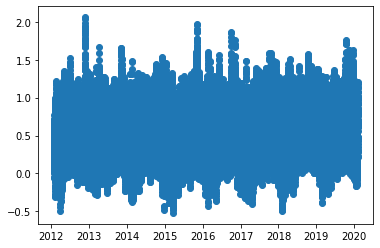

In [42]:
# plt.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.SALINITY)
# plt.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.SALINITY)
# plt.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.SALINITY)
# plt.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.SALINITY)
# plt.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.SALINITY)
# plt.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.SALINITY)
# plt.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.SALINITY)
# plt.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.SALINITY)
# plt.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.SALINITY)
# plt.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.SALINITY)
# plt.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.SALINITY)
# plt.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.SALINITY)
# plt.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.SALINITY)
# plt.scatter(1900+dayssince_1998_2018_NYCC_CHLA,data_1998_2018_NYCC.MeasureValue[data_1998_2018_NYCC.Parameter=='CHLA'])
# plt.scatter(1900+dayssince_1998_2018_laf01_CHLA,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='CHLA'])
# plt.scatter(1900+dayssince_1998_2018_laf01_DO/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='DO'])
# plt.scatter(1900+dayssince_1998_2018_laf01_Wtemp/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='WTEMP'])
# plt.scatter(1900+dayssince_1998_2018_laf01_Sal/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='SALINITY'])
# plt.scatter(1900+dayssince_1998_2018_laf01_pH/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='PH'])
# plt.scatter(1900+dayssince_1998_2018_laf01/364.75,data_1998_2018_laf01.Depth)
# plt.scatter(1900+dayssince_1998_2018_laf01_DON/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='DON'])
# plt.scatter(1900+dayssince_1998_2018_laf01_DIN/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='DIN'])
# plt.scatter(1900+dayssince_1998_2018_laf01_DOP/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='DOP'])
# plt.scatter(1900+dayssince_1998_2018_laf01_PO4/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='PO4F'])

plt.scatter(1900+(((data_MLLW_Sewells.year-1900)*364.75)+(data_MLLW_Sewells.month*(364.75/12))+ data_MLLW_Sewells.day + data_MLLW_Sewells.Time_GMT)/364.75, data_MLLW_Sewells.Verified_ft)

# plt.scatter(1900+(((data_NFK_airport.year-1900)*364.75)+(data_NFK_airport.month*(364.75/12))+ data_NFK_airport.day)/364.75, data_NFK_airport.PRCP)


(2012, 2020)

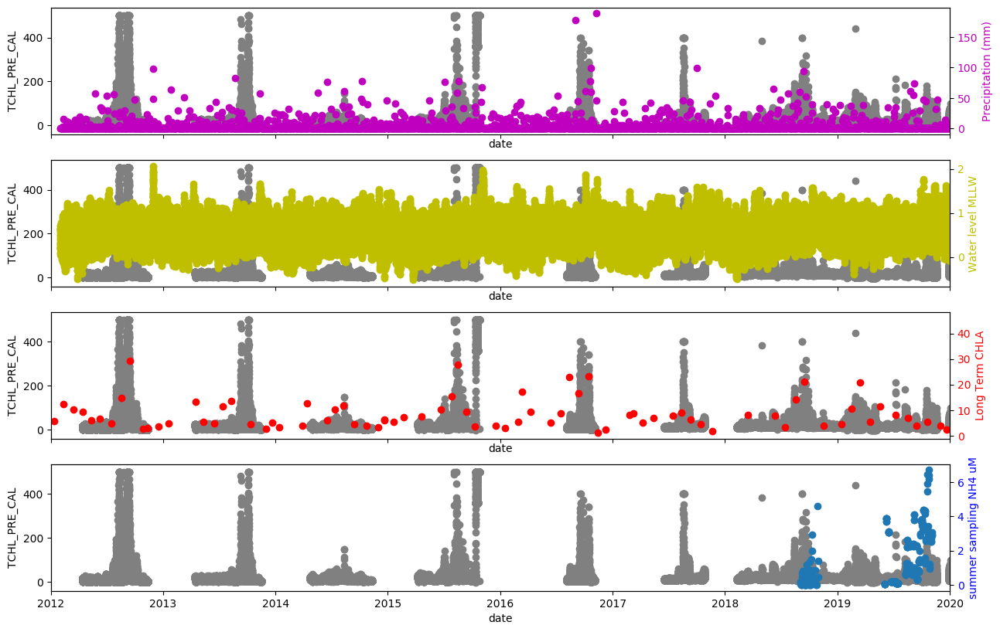

In [47]:
fig, (ax2, ax3, ax7, ax8)=plt.subplots(4,1,figsize=(15,10),dpi=100,sharex='all')
ax20=ax2.twinx()
ax30=ax3.twinx()
ax70=ax7.twinx()
ax80=ax8.twinx()

pint='0.5'

ax2.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.TCHL_PRE_CAL,color=pint)
ax2.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.TCHL_PRE_CAL,color=pint)
ax2.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.TCHL_PRE_CAL,color=pint)
ax2.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.TCHL_PRE_CAL,color=pint)
ax2.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.TCHL_PRE_CAL,color=pint)
ax2.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.TCHL_PRE_CAL,color=pint)
ax2.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.TCHL_PRE_CAL,color=pint)
ax2.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.TCHL_PRE_CAL,color=pint)
ax2.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.TCHL_PRE_CAL,color=pint)
ax2.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.TCHL_PRE_CAL,color=pint)
ax2.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.TCHL_PRE_CAL,color=pint)
ax2.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.TCHL_PRE_CAL,color=pint)
ax2.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.TCHL_PRE_CAL,color=pint)
ax2.set_xlabel('date')
ax2.set_ylabel('TCHL_PRE_CAL')

ax20.scatter(1900+(((data_NFK_airport.year-1900)*364.75)+(data_NFK_airport.month*(364.75/12))+ data_NFK_airport.day)/364.75, data_NFK_airport.PRCP,color='m')
ax20.set_ylabel(r'Precipitation (mm)',color='m')
ax20.tick_params(axis='y',labelcolor='m')

ax3.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.TCHL_PRE_CAL,color=pint)
ax3.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.TCHL_PRE_CAL,color=pint)
ax3.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.TCHL_PRE_CAL,color=pint)
ax3.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.TCHL_PRE_CAL,color=pint)
ax3.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.TCHL_PRE_CAL,color=pint)
ax3.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.TCHL_PRE_CAL,color=pint)
ax3.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.TCHL_PRE_CAL,color=pint)
ax3.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.TCHL_PRE_CAL,color=pint)
ax3.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.TCHL_PRE_CAL,color=pint)
ax3.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.TCHL_PRE_CAL,color=pint)
ax3.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.TCHL_PRE_CAL,color=pint)
ax3.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.TCHL_PRE_CAL,color=pint)
ax3.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.TCHL_PRE_CAL,color=pint)
ax3.set_xlabel('date')
ax3.set_ylabel('TCHL_PRE_CAL')

ax30.scatter(1900+(((data_MLLW_Sewells.year-1900)*364.75)+(data_MLLW_Sewells.month*(364.75/12))+ data_MLLW_Sewells.day + data_MLLW_Sewells.Time_GMT)/364.75, data_MLLW_Sewells.Verified_ft,color='y')
ax30.set_ylabel(r'Water level MLLW',color='y')
ax30.tick_params(axis='y',labelcolor='y')

#set variable 1
ax7.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.TCHL_PRE_CAL,color=pint)
ax7.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.TCHL_PRE_CAL,color=pint)
ax7.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.TCHL_PRE_CAL,color=pint)
ax7.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.TCHL_PRE_CAL,color=pint)
ax7.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.TCHL_PRE_CAL,color=pint)
ax7.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.TCHL_PRE_CAL,color=pint)
ax7.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.TCHL_PRE_CAL,color=pint)
ax7.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.TCHL_PRE_CAL,color=pint)
ax7.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.TCHL_PRE_CAL,color=pint)
ax7.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.TCHL_PRE_CAL,color=pint)
ax7.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.TCHL_PRE_CAL,color=pint)
ax7.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.TCHL_PRE_CAL,color=pint)
ax7.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.TCHL_PRE_CAL,color=pint)
ax7.set_xlabel('date')
ax7.set_ylabel('TCHL_PRE_CAL')
# ax7.set_xlim(2012,2020)
# # ax7.set_xticks(np.arange(1999,2018,1))

ax70.scatter(1900+dayssince_1998_2018_laf01_CHLA/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='CHLA'],color='r')
ax70.set_ylabel(r'Long Term CHLA',color='r')
ax70.tick_params(axis='y',labelcolor='r')
# ax7.set_xticks(np.arange(2009,2019,1))
ax7.set_xlim(2012,2020)


ax8.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.TCHL_PRE_CAL,color=pint)
ax8.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.TCHL_PRE_CAL,color=pint)
ax8.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.TCHL_PRE_CAL,color=pint)
ax8.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.TCHL_PRE_CAL,color=pint)
ax8.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.TCHL_PRE_CAL,color=pint)
ax8.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.TCHL_PRE_CAL,color=pint)
ax8.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.TCHL_PRE_CAL,color=pint)
ax8.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.TCHL_PRE_CAL,color=pint)
ax8.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.TCHL_PRE_CAL,color=pint)
ax8.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.TCHL_PRE_CAL,color=pint)
ax8.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.TCHL_PRE_CAL,color=pint)
ax8.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.TCHL_PRE_CAL,color=pint)
ax8.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.TCHL_PRE_CAL,color=pint)
ax8.set_xlabel('date')
ax8.set_ylabel('TCHL_PRE_CAL')
# ax7.set_xlim(2012,2020)
# # ax7.set_xticks(np.arange(1999,2018,1))

ax80.scatter(1900+(((data_NYCC_NH4.year - 1900)*364.75) + (data_NYCC_NH4.month*(364.75/12))+data_NYCC_NH4.day)/364.75,data_NYCC_NH4.NH4_uM)
ax80.set_ylabel(r'summer sampling NH4 uM',color='b')
ax80.tick_params(axis='y',labelcolor='b')
# ax7.set_xticks(np.arange(2009,2019,1))
ax80.set_xlim(2012,2020)

Text(0.5, 0, 'date')

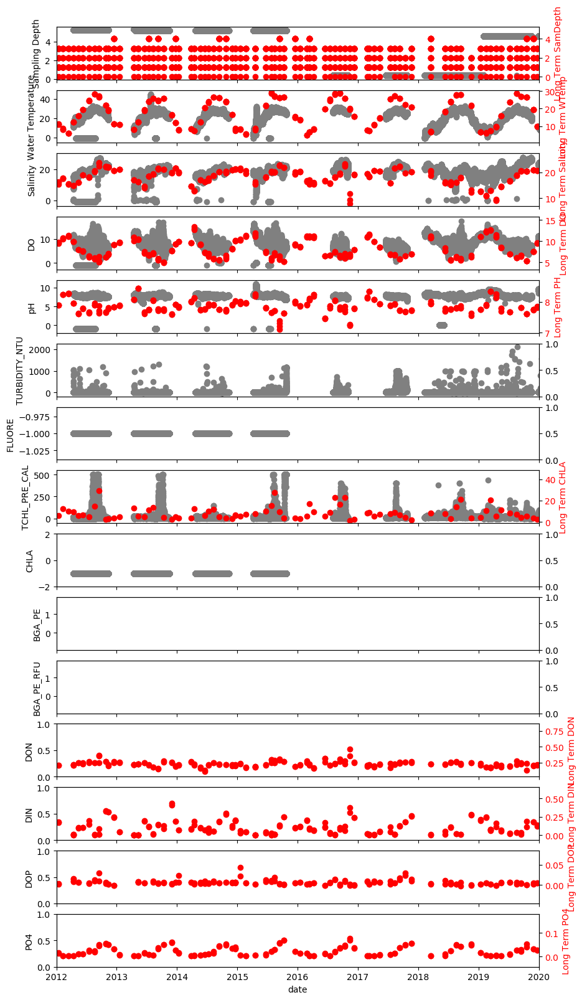

In [198]:
fig, (ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15, ax16) =  plt.subplots(15, 1,figsize = (10, 20), dpi = 100,sharex='all')
# ax1.scatter(match_data.MLLW,match_data.nitra,color='k')

ax20=ax2.twinx()
ax30=ax3.twinx()
ax40=ax4.twinx()
ax50=ax5.twinx()
ax60=ax6.twinx()
ax70=ax7.twinx()
ax80=ax8.twinx()
ax90=ax9.twinx()
ax100=ax10.twinx()
ax110=ax11.twinx()
ax120=ax12.twinx()
ax130=ax13.twinx()
ax140=ax14.twinx()
ax150=ax15.twinx()
ax160=ax16.twinx()

pint='0.5'

ax2.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.DEPTH,color=pint)
ax2.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.DEPTH,color=pint)
ax2.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.DEPTH,color=pint)
ax2.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.DEPTH,color=pint)
ax2.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.DEPTH,color=pint)
ax2.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.DEPTH,color=pint)
ax2.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.DEPTH,color=pint)
ax2.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.DEPTH,color=pint)
ax2.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.DEPTH,color=pint)
ax2.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.DEPTH,color=pint)
ax2.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.DEPTH,color=pint)
ax2.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.DEPTH,color=pint)
ax2.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.DEPTH,color=pint)
# ax1.set_xlabel('date')
ax2.set_ylabel('Sampling Depth')
ax2.set_xlim(2012,2020)
# ax2.set_ylim(4,8)
ax20.scatter(1900+dayssince_1998_2018_laf01/364.75,data_1998_2018_laf01.Depth,color='r')
ax20.set_ylabel(r'Long Term SamDepth',color='r')
ax20.tick_params(axis='y',labelcolor='r')

ax3.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.WTEMP,color=pint)
ax3.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.WTEMP,color=pint)
ax3.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.WTEMP,color=pint)
ax3.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.WTEMP,color=pint)
ax3.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.WTEMP,color=pint)
ax3.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.WTEMP,color=pint)
ax3.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.WTEMP,color=pint)
ax3.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.WTEMP,color=pint)
ax3.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.WTEMP,color=pint)
ax3.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.WTEMP,color=pint)
ax3.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.WTEMP,color=pint)
ax3.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.WTEMP,color=pint)
ax3.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.WTEMP,color=pint)
# ax1.set_xlabel('date')
ax3.set_ylabel('Water Temperature')
# ax1.set_xlim(2012,2020)
ax30.scatter(1900+dayssince_1998_2018_laf01_Wtemp/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='WTEMP'],color='r')
ax30.set_ylabel(r'Long Term WTemp',color='r')
ax30.tick_params(axis='y',labelcolor='r')

ax4.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.SALINITY,color=pint)
ax4.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.SALINITY,color=pint)
ax4.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.SALINITY,color=pint)
ax4.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.SALINITY,color=pint)
ax4.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.SALINITY,color=pint)
ax4.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.SALINITY,color=pint)
ax4.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.SALINITY,color=pint)
ax4.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.SALINITY,color=pint)
ax4.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.SALINITY,color=pint)
ax4.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.SALINITY,color=pint)
ax4.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.SALINITY,color=pint)
ax4.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.SALINITY,color=pint)
ax4.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.SALINITY,color=pint)
# ax2.set_xlabel('date')
ax4.set_ylabel('Salinity')
ax4.set_xlim(2012,2020)
ax40.scatter(1900+dayssince_1998_2018_laf01_Sal/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='SALINITY'],color='r')
ax40.set_ylabel(r'Long Term Salinity',color='r')
ax40.tick_params(axis='y',labelcolor='r')

ax5.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.DO,color=pint)
ax5.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.DO,color=pint)
ax5.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.DO,color=pint)
ax5.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.DO,color=pint)
ax5.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.DO,color=pint)
ax5.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.DO,color=pint)
ax5.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.DO,color=pint)
ax5.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.DO,color=pint)
ax5.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.DO,color=pint)
ax5.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.DO,color=pint)
ax5.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.DO,color=pint)
ax5.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.DO,color=pint)
ax5.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.DO,color=pint)
# ax1.set_xlabel('date')
ax5.set_ylabel('DO')
# ax3.set_xlim(2012,2020)
ax50.scatter(1900+dayssince_1998_2018_laf01_DO/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='DO'],color='r')
ax50.set_ylabel(r'Long Term DO',color='r')
ax50.tick_params(axis='y',labelcolor='r')

ax6.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.PH,color=pint)
ax6.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.PH,color=pint)
ax6.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.PH,color=pint)
ax6.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.PH,color=pint)
ax6.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.PH,color=pint)
ax6.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.PH,color=pint)
ax6.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.PH,color=pint)
ax6.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.PH,color=pint)
ax6.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.PH,color=pint)
ax6.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.PH,color=pint)
ax6.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.PH,color=pint)
ax6.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.PH,color=pint)
ax6.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.PH,color=pint)
# ax1.set_xlabel('date')
ax6.set_ylabel('pH')
ax6.set_xlim(2012,2020)
ax60.scatter(1900+dayssince_1998_2018_laf01_pH/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='PH'],color='r')
ax60.set_ylabel(r'Long Term PH',color='r')
ax60.tick_params(axis='y',labelcolor='r')

ax7.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.TURB_NTU,color=pint)
ax7.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.TURB_NTU,color=pint)
ax7.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.TURB_NTU,color=pint)
ax7.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.TURB_NTU,color=pint)
ax7.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.TURB_NTU,color=pint)
ax7.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.TURB_NTU,color=pint)
ax7.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.TURB_NTU,color=pint)
ax7.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.TURB_NTU,color=pint)
ax7.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.TURB_NTU,color=pint)
ax7.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.TURB_NTU,color=pint)
ax7.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.TURB_NTU,color=pint)
ax7.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.TURB_NTU,color=pint)
ax7.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.TURB_NTU,color=pint)
# ax1.set_xlabel('date')
ax7.set_ylabel('TURBIDITY_NTU')
ax7.set_xlim(2012,2020)

ax8.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.FLUOR,color=pint)
ax8.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.FLUOR,color=pint)
ax8.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.FLUOR,color=pint)
ax8.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.FLUOR,color=pint)
ax8.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.FLUOR,color=pint)
ax8.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.FLUOR,color=pint)
ax8.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.FLUOR,color=pint)
ax8.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.FLUOR,color=pint)
ax8.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.FLUOR,color=pint)
ax8.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.FLUOR,color=pint)
ax8.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.FLUOR,color=pint)
ax8.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.FLUOR,color=pint)
ax8.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.FLUOR,color=pint)
# ax1.set_xlabel('date')
ax8.set_ylabel('FLUORE')
ax8.set_xlim(2012,2020)

#set variable 1
ax9.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.TCHL_PRE_CAL,color=pint)
ax9.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.TCHL_PRE_CAL,color=pint)
ax9.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.TCHL_PRE_CAL,color=pint)
ax9.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.TCHL_PRE_CAL,color=pint)
ax9.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.TCHL_PRE_CAL,color=pint)
ax9.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.TCHL_PRE_CAL,color=pint)
ax9.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.TCHL_PRE_CAL,color=pint)
ax9.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.TCHL_PRE_CAL,color=pint)
ax9.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.TCHL_PRE_CAL,color=pint)
ax9.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.TCHL_PRE_CAL,color=pint)
ax9.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.TCHL_PRE_CAL,color=pint)
ax9.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.TCHL_PRE_CAL,color=pint)
ax9.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.TCHL_PRE_CAL,color=pint)
# ax7.set_xlabel('date')
ax9.set_ylabel('TCHL_PRE_CAL')
# ax7.set_xlim(2012,2020)
# # ax7.set_xticks(np.arange(1999,2018,1))
ax90.scatter(1900+dayssince_1998_2018_laf01_CHLA/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='CHLA'],color='r')
ax90.set_ylabel(r'Long Term CHLA',color='r')
ax90.tick_params(axis='y',labelcolor='r')
# ax7.set_xticks(np.arange(2009,2019,1))
# ax7.set_xlim(2009,2019)

ax10.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.CHLA,color=pint)
ax10.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.CHLA,color=pint)
ax10.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.CHLA,color=pint)
ax10.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.CHLA,color=pint)
ax10.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.CHLA,color=pint)
ax10.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.CHLA,color=pint)
ax10.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.CHLA,color=pint)
ax10.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.CHLA,color=pint)
ax10.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.CHLA,color=pint)
ax10.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.CHLA,color=pint)
ax10.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.CHLA,color=pint)
ax10.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.CHLA,color=pint)
ax10.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.CHLA,color=pint)
# ax1.set_xlabel('date')
ax10.set_ylabel('CHLA')
ax10.set_xlim(2012,2020)
ax10.set_ylim(-2,2)

ax11.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.BGA_PE,color=pint)
ax11.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.BGA_PE,color=pint)
ax11.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.BGA_PE,color=pint)
ax11.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.BGA_PE,color=pint)
ax11.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.BGA_PE,color=pint)
ax11.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.BGA_PE,color=pint)
ax11.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.BGA_PE,color=pint)
ax11.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.BGA_PE,color=pint)
ax11.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.BGA_PE,color=pint)
ax11.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.BGA_PE,color=pint)
ax11.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.BGA_PE,color=pint)
# ax9.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.BGA_PE,color=pint)
# ax9.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.BGA_PE,color=pint)
# ax1.set_xlabel('date')
ax11.set_ylabel('BGA_PE')
ax11.set_xlim(2012,2020)

ax12.scatter(1900+dayssince_jan_jun_2012/364.75,data_jan_jun_2012.BGA_PE_RFU,color='0.5')
ax12.scatter(1900+dayssince_jul_dec_2012/364.75,data_jul_dec_2012.BGA_PE_RFU,color='0.1')
ax12.scatter(1900+dayssince_jan_jun_2013/364.75,data_jan_jun_2013.BGA_PE_RFU,color='0.5')
ax12.scatter(1900+dayssince_jul_dec_2013/364.75,data_jul_dec_2013.BGA_PE_RFU,color='0.1')
ax12.scatter(1900+dayssince_jan_jun_2014/364.75,data_jan_jun_2014.BGA_PE_RFU,color='0.5')
ax12.scatter(1900+dayssince_jul_dec_2014/364.75,data_jul_dec_2014.BGA_PE_RFU,color='0.1')
ax12.scatter(1900+dayssince_jan_jun_2015/364.75,data_jan_jun_2015.BGA_PE_RFU,color='0.5')
ax12.scatter(1900+dayssince_jul_dec_2015/364.75,data_jul_dec_2015.BGA_PE_RFU,color='0.1')
ax12.scatter(1900+dayssince_jul_dec_2016/364.75,data_jul_dec_2016.BGA_PE_RFU,color='0.1')
ax12.scatter(1900+dayssince_jan_jun_2017/364.75,data_jan_jun_2017.BGA_PE_RFU,color='0.5')
ax12.scatter(1900+dayssince_jul_dec_2017/364.75,data_jul_dec_2017.BGA_PE_RFU,color='0.1')
# ax10.scatter(1900+dayssince_jan_dec_2018/364.75,data_jan_dec_2018.BGA_PE_RFU,color=pint)
# ax10.scatter(1900+dayssince_jan_dec_2019/364.75,data_jan_dec_2019.BGA_PE_RFU,color=pint)
# ax12.set_xlabel('date')
ax12.set_ylabel('BGA_PE_RFU')
ax12.set_xlim(2012,2020)


ax13.set_ylabel('DON')
ax130.scatter(1900+dayssince_1998_2018_laf01_DON/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='DON'],color='r')
ax130.set_ylabel(r'Long Term DON',color='r')
ax130.tick_params(axis='y',labelcolor='r')



ax14.set_ylabel('DIN')
ax140.scatter(1900+dayssince_1998_2018_laf01_DIN/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='DIN'],color='r')
ax140.set_ylabel(r'Long Term DIN',color='r')
ax140.tick_params(axis='y',labelcolor='r')



ax15.set_ylabel('DOP')
ax150.scatter(1900+dayssince_1998_2018_laf01_DOP/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='DOP'],color='r')
ax150.set_ylabel(r'Long Term DOP',color='r')
ax150.tick_params(axis='y',labelcolor='r')



ax16.set_ylabel('PO4')
ax160.scatter(1900+dayssince_1998_2018_laf01_PO4/364.75,data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='PO4F'],color='r')
ax160.set_ylabel(r'Long Term PO4',color='r')
ax160.tick_params(axis='y',labelcolor='r')
ax16.set_xlabel('date')

HRSD SWIFT Research Center (SWIFTRC) Quarterly Report on SWIFT Water Quality Targets  
    
    This report documents SWIFT Water Quality results for the first full quarter of recharge operations which includes the period from May 15, 2018 – August 31, 2018.  The compliance requirements are documented in HRSD’s SWIFT Underground Injection Control Inventory Information Package (UIC-IIP) submitted to EPA Region III in January 2018.  These requirements are noted in the following tables (Tables 1-4), extracted from Attachment B of the UIC-IIP.  Figures 1 and 2 and Table 5 provide the data from the first full quarter of operations relative to these SWIFT Water Quality Targets.
    
https://www.hrsd.com/sites/default/files/assets/SWIFT%20PDF/HRSD_SWIFTRC_QrtlyRpt_May-Aug2018-FINAL.pdf

In [71]:
from PIL import Image

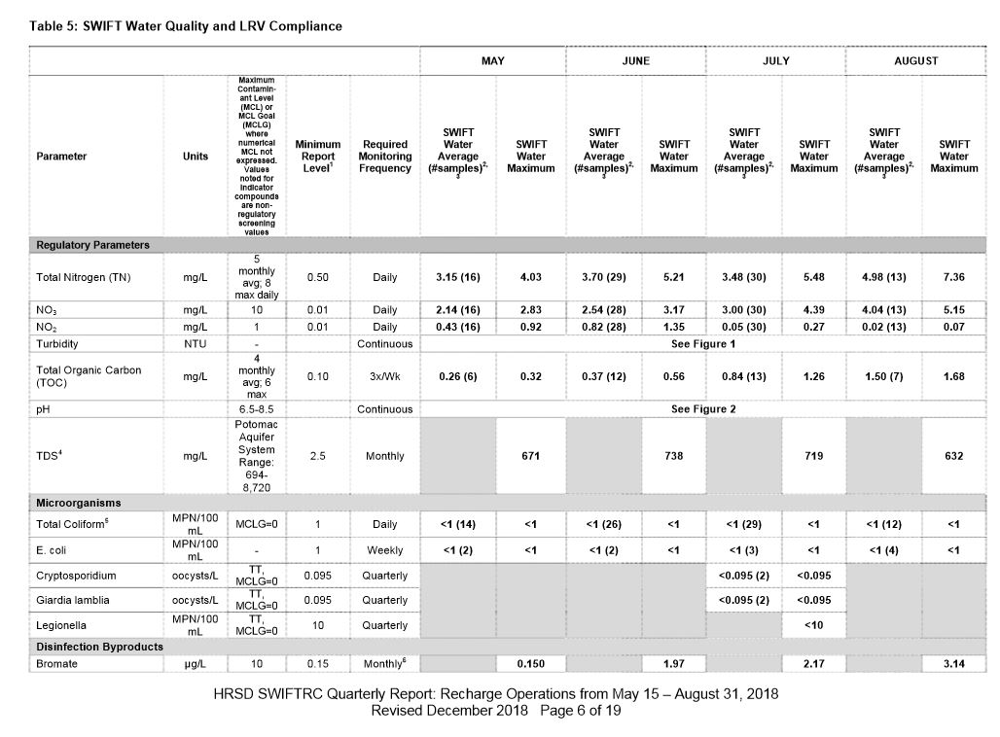

In [72]:
img  = Image.open('C:/Users/a_mac/Desktop/SWIFT_Water_Quality_2018.JPG')
img

Look at the nitrate values (table above)!!! if this are for ground-water, concnetrations comming out of WWTPs might be higher.

to get an indea... the following are waste water concentrations in raw water from different businesses
https://www.hrsd.com/surcharge

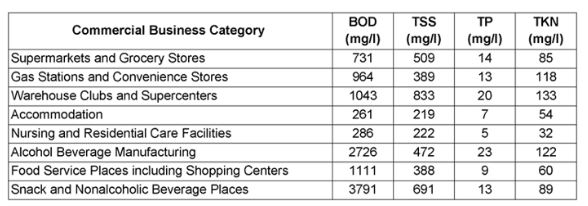

In [73]:
img  = Image.open('C:/Users/a_mac/Desktop/wastewater_concentration_dif_business.JPG')
img

from the guys that build or managge the treatment plant nex to ODU (Virginia Initiative Plant Nutrient Reduction)

    ...A unique versatile bioreactor provides treatment flexibility, allowing the bioreactor to operate in series or in parallel with the existing 3-stage nutrient removal processes to achieve required effluent quality of 5 mg/l total nitrogen and 1 mg/l total phosphorus and increase the peak flow capacity from 80 MGD to over 100 MGD...
    
This matches with the results from the SWIFT project, which makes me think that values similar those of table 5 (above) are being introduced continuously to the lower part of the Elizabeth River. The efluent of the plant is 


    Data from the NFK waste-water treatment plant with outflow near the mouth of the Lafayette River

Text(0, 0.5, 'TN:TP molar ratio')

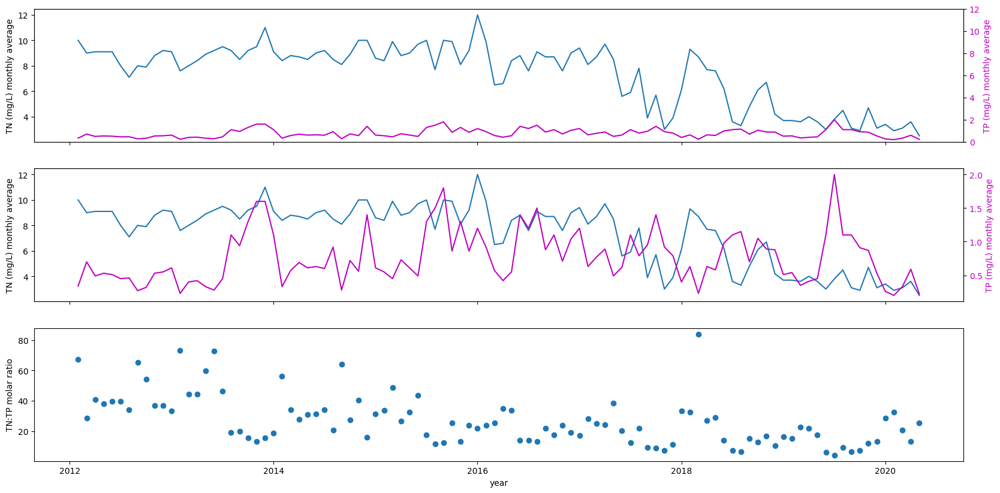

In [79]:
fig, (ax1, ax2, ax3)=plt.subplots(3,1,figsize=(20,10),dpi=100,sharex='all')
ax10=ax1.twinx()
ax20=ax2.twinx()

ax1.plot(1900+(((data_NFK_wastewater.year - 1900)*364.75) + (data_NFK_wastewater.month*(364.75/12)))/364.75,
           data_NFK_wastewater.TN_Monthly_Average_mgL)
ax1.set_ylabel('TN (mg/L) monthly average')
ax10.plot(1900+(((data_NFK_wastewater.year - 1900)*364.75) + (data_NFK_wastewater.month*(364.75/12)))/364.75,
           data_NFK_wastewater.TP_Monthly_Average_mgL,color='m')
ax10.set_ylabel(r'TP (mg/L) monthly average',color='m')
ax10.tick_params(axis='y',labelcolor='m')
ax10.set_ylim(0,12)

ax2.plot(1900+(((data_NFK_wastewater.year - 1900)*364.75) + (data_NFK_wastewater.month*(364.75/12)))/364.75,
           data_NFK_wastewater.TN_Monthly_Average_mgL)
ax2.set_ylabel('TN (mg/L) monthly average')
ax20.plot(1900+(((data_NFK_wastewater.year - 1900)*364.75) + (data_NFK_wastewater.month*(364.75/12)))/364.75,
           data_NFK_wastewater.TP_Monthly_Average_mgL,color='m')
ax20.set_ylabel(r'TP (mg/L) monthly average',color='m')
ax20.tick_params(axis='y',labelcolor='m')

ax3.scatter(1900+(((data_NFK_wastewater.year - 1900)*364.75) + (data_NFK_wastewater.month*(364.75/12)))/364.75,
           data_NFK_wastewater.TNTP_molar_ratio)
ax3.set_xlabel('year')
ax3.set_ylabel('TN:TP molar ratio')

# Average value per month

In [4]:
PRCP_jan_avg = np.mean(data_NFK_airport.PRCP[(data_NFK_airport.month==1)])
PRCP_jan_sd = np.std(data_NFK_airport.PRCP[(data_NFK_airport.month==1)])

PRCP_feb_avg = np.mean(data_NFK_airport.PRCP[(data_NFK_airport.month==2)])
PRCP_feb_sd = np.std(data_NFK_airport.PRCP[(data_NFK_airport.month==2)])

PRCP_mar_avg = np.mean(data_NFK_airport.PRCP[(data_NFK_airport.month==3)])
PRCP_mar_sd = np.std(data_NFK_airport.PRCP[(data_NFK_airport.month==3)])

PRCP_apr_avg = np.mean(data_NFK_airport.PRCP[(data_NFK_airport.month==4)])
PRCP_apr_sd = np.std(data_NFK_airport.PRCP[(data_NFK_airport.month==4)])

PRCP_may_avg = np.mean(data_NFK_airport.PRCP[(data_NFK_airport.month==5)])
PRCP_may_sd = np.std(data_NFK_airport.PRCP[(data_NFK_airport.month==5)])

PRCP_jun_avg = np.mean(data_NFK_airport.PRCP[(data_NFK_airport.month==6)])
PRCP_jun_sd = np.std(data_NFK_airport.PRCP[(data_NFK_airport.month==6)])

PRCP_jul_avg = np.mean(data_NFK_airport.PRCP[(data_NFK_airport.month==7)])
PRCP_jul_sd = np.std(data_NFK_airport.PRCP[(data_NFK_airport.month==7)])

PRCP_aug_avg = np.mean(data_NFK_airport.PRCP[(data_NFK_airport.month==8)])
PRCP_aug_sd = np.std(data_NFK_airport.PRCP[(data_NFK_airport.month==8)])

PRCP_sep_avg = np.mean(data_NFK_airport.PRCP[(data_NFK_airport.month==9)])
PRCP_sep_sd = np.std(data_NFK_airport.PRCP[(data_NFK_airport.month==9)])

PRCP_oct_avg = np.mean(data_NFK_airport.PRCP[(data_NFK_airport.month==10)])
PRCP_oct_sd = np.std(data_NFK_airport.PRCP[(data_NFK_airport.month==10)])

PRCP_nov_avg = np.mean(data_NFK_airport.PRCP[(data_NFK_airport.month==11)])
PRCP_nov_sd = np.std(data_NFK_airport.PRCP[(data_NFK_airport.month==11)])

PRCP_dec_avg = np.mean(data_NFK_airport.PRCP[(data_NFK_airport.month==12)])
PRCP_dec_sd = np.std(data_NFK_airport.PRCP[(data_NFK_airport.month==12)])


In [5]:
AWND_jan_avg = np.mean(data_NFK_airport.AWND[(data_NFK_airport.month==1)])

AWND_feb_avg = np.mean(data_NFK_airport.AWND[(data_NFK_airport.month==2)])

AWND_mar_avg = np.mean(data_NFK_airport.AWND[(data_NFK_airport.month==3)])

AWND_apr_avg = np.mean(data_NFK_airport.AWND[(data_NFK_airport.month==4)])

AWND_may_avg = np.mean(data_NFK_airport.AWND[(data_NFK_airport.month==5)])

AWND_jun_avg = np.mean(data_NFK_airport.AWND[(data_NFK_airport.month==6)])

AWND_jul_avg = np.mean(data_NFK_airport.AWND[(data_NFK_airport.month==7)])

AWND_aug_avg = np.mean(data_NFK_airport.AWND[(data_NFK_airport.month==8)])

AWND_sep_avg = np.mean(data_NFK_airport.AWND[(data_NFK_airport.month==9)])

AWND_oct_avg = np.mean(data_NFK_airport.AWND[(data_NFK_airport.month==10)])

AWND_nov_avg = np.mean(data_NFK_airport.AWND[(data_NFK_airport.month==11)])

AWND_dec_avg = np.mean(data_NFK_airport.AWND[(data_NFK_airport.month==12)])


In [78]:
MLLW_jan_avg = np.mean(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==1)])
MLLW_jan_sd = np.std(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==1)])

MLLW_feb_avg = np.mean(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==2)])
MLLW_feb_sd = np.std(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==2)])

MLLW_mar_avg = np.mean(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==3)])
MLLW_mar_sd = np.std(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==3)])

MLLW_apr_avg = np.mean(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==4)])
MLLW_apr_sd = np.std(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==4)])

MLLW_may_avg = np.mean(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==5)])
MLLW_may_sd = np.std(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==5)])

MLLW_jun_avg = np.mean(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==6)])
MLLW_jun_sd = np.std(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==6)])

MLLW_jul_avg = np.mean(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==7)])
MLLW_jul_sd = np.std(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==7)])

MLLW_aug_avg = np.mean(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==8)])
MLLW_aug_sd = np.std(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==8)])

MLLW_sep_avg = np.mean(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==9)])
MLLW_sep_sd = np.std(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==9)])

MLLW_oct_avg = np.mean(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==10)])
MLLW_oct_sd = np.std(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==10)])

MLLW_nov_avg = np.mean(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==11)])
MLLW_nov_sd = np.std(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==11)])

MLLW_dec_avg = np.mean(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==12)])
MLLW_dec_sd = np.std(data_MLLW_Sewells.Verified_ft[(data_MLLW_Sewells.month==12)])

In [6]:
sites_PRCP=['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']

x_pos_PRCP=np.arange(len(sites_PRCP))

CTEs_PRCP=[PRCP_jan_avg,PRCP_feb_avg,PRCP_mar_avg,PRCP_apr_avg,PRCP_may_avg,PRCP_jun_avg,
      PRCP_jul_avg,PRCP_aug_avg,PRCP_sep_avg,PRCP_oct_avg,PRCP_nov_avg,PRCP_dec_avg]

error_PRCP=[PRCP_jan_sd,PRCP_feb_sd,PRCP_mar_sd,PRCP_apr_sd,PRCP_may_sd,PRCP_jun_sd,
      PRCP_jul_sd,PRCP_aug_sd,PRCP_sep_sd,PRCP_oct_sd,PRCP_nov_sd,PRCP_dec_sd]

In [7]:
sites_AWND=['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']

x_pos_AWND=np.arange(len(sites_AWND))

CTEs_AWND=[AWND_jan_avg,AWND_feb_avg,AWND_mar_avg,AWND_apr_avg,AWND_may_avg,AWND_jun_avg,
      AWND_jul_avg,AWND_aug_avg,AWND_sep_avg,AWND_oct_avg,AWND_nov_avg,AWND_dec_avg]

# error_WaTem=[Chla_jan_sd,Chla_feb_sd,Chla_mar_sd,Chla_apr_sd,Chla_may_sd,Chla_jun_sd,
#       Chla_jul_sd,Chla_aug_sd,Chla_sep_sd,Chla_oct_sd,Chla_nov_sd,Chla_dec_sd]

In [81]:
sites_MLLW=['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']

x_pos_MLLW=np.arange(len(sites_MLLW))

CTEs_MLLW=[MLLW_jan_avg,MLLW_feb_avg,MLLW_mar_avg,MLLW_apr_avg,MLLW_may_avg,MLLW_jun_avg,
      MLLW_jul_avg,MLLW_aug_avg,MLLW_sep_avg,MLLW_oct_avg,MLLW_nov_avg,MLLW_dec_avg]

error_MLLW=[MLLW_jan_sd,MLLW_feb_sd,MLLW_mar_sd,MLLW_apr_sd,MLLW_may_sd,MLLW_jun_sd,
      MLLW_jul_sd,MLLW_aug_sd,MLLW_sep_sd,MLLW_oct_sd,MLLW_nov_sd,MLLW_dec_sd]

Text(0.5, 1.0, 'monthly Precipitation average')

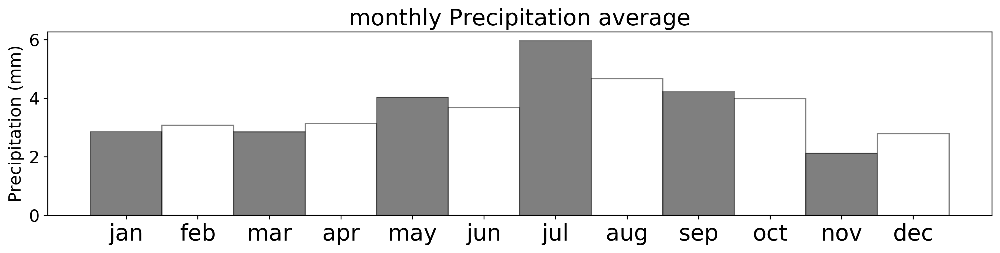

In [10]:
fig, ax = plt.subplots(1,1,figsize=(15,3),dpi=300)

# bars=ax.bar(x_pos, CTEs, yerr=error, align='center', alpha=0.5, ecolor='black', capsize=5, color=['black','white','red'], edgecolor='black',width=1)
bars=ax.bar(x_pos_PRCP,CTEs_PRCP, align='center', alpha=0.5, ecolor='black', capsize=5, color=['black','white'], edgecolor='black',width=1)


ax.set_ylabel('Precipitation (mm)',fontsize=15)
ax.tick_params(axis='y',labelcolor='k',labelsize=15)
ax.set_xticks(x_pos_PRCP)
ax.set_xticklabels(sites_PRCP, fontsize=20)
ax.set_title('monthly Precipitation average', fontsize=20)
# ax.set_ylim(0,30)

Text(0.5, 1.0, 'monthly Wind speed average')

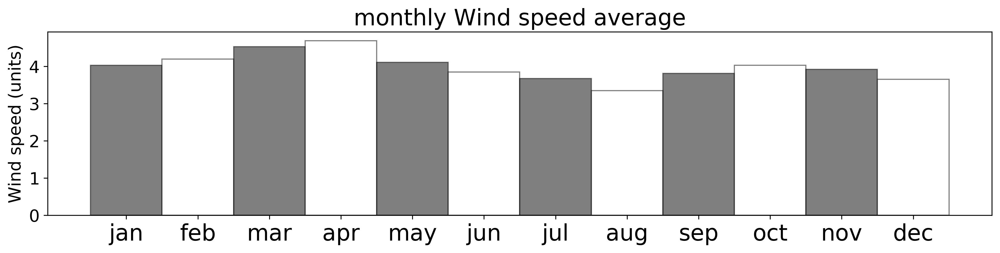

In [83]:
fig, ax = plt.subplots(1,1,figsize=(15,3),dpi=300)

# bars=ax.bar(x_pos, CTEs, yerr=error, align='center', alpha=0.5, ecolor='black', capsize=5, color=['black','white','red'], edgecolor='black',width=1)
bars=ax.bar(x_pos_AWND, CTEs_AWND, align='center', alpha=0.5, ecolor='black', capsize=5, color=['black','white'], edgecolor='black',width=1)


ax.set_ylabel('Wind speed (units)',fontsize=15)
ax.tick_params(axis='y',labelcolor='k',labelsize=15)
ax.set_xticks(x_pos_AWND)
ax.set_xticklabels(sites_AWND, fontsize=20)
ax.set_title('monthly Wind speed average', fontsize=20)
# ax.set_ylim(0,30)

Text(0.5, 1.0, 'monthly water level average')

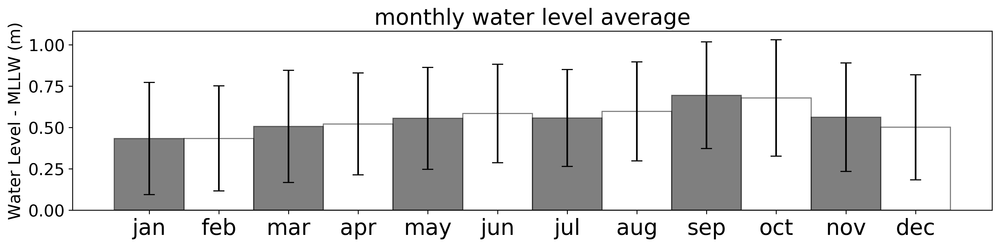

In [84]:
fig, ax = plt.subplots(1,1,figsize=(15,3),dpi=300)

# bars=ax.bar(x_pos, CTEs, yerr=error, align='center', alpha=0.5, ecolor='black', capsize=5, color=['black','white','red'], edgecolor='black',width=1)
bars=ax.bar(x_pos_MLLW, CTEs_MLLW, yerr=error_MLLW, align='center', alpha=0.5, ecolor='black', capsize=5, color=['black','white'], edgecolor='black',width=1)


ax.set_ylabel('Water Level - MLLW (m)',fontsize=15)
ax.tick_params(axis='y',labelcolor='k',labelsize=15)
ax.set_xticks(x_pos_MLLW)
ax.set_xticklabels(sites_MLLW, fontsize=20)
ax.set_title('monthly water level average', fontsize=20)
# ax.set_ylim(0,30)

# Correlation plots

Text(0, 0.5, 'Hour of the day (in fraction)')

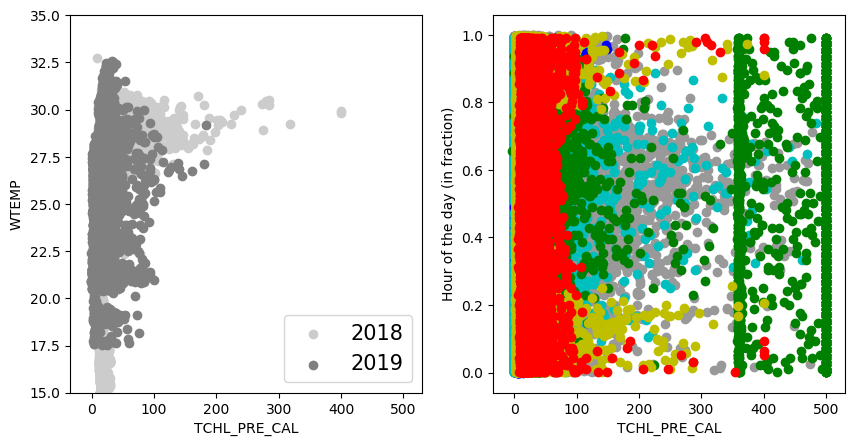

In [199]:
fig, (ax2, ax3)=plt.subplots(1,2,figsize=(10,5),dpi=100,sharex='all')

ax2.scatter(data_jan_dec_2018.TCHL_PRE_CAL[data_jan_dec_2018.SAMPLE_MONTH>6],data_jan_dec_2018.WTEMP[data_jan_dec_2018.SAMPLE_MONTH>6],color='0.8',label='2018')
ax2.scatter(data_jan_dec_2019.TCHL_PRE_CAL[data_jan_dec_2019.SAMPLE_MONTH>6],data_jan_dec_2019.WTEMP[data_jan_dec_2019.SAMPLE_MONTH>6],color='0.5',label='2019')

ax2.set_xlabel('TCHL_PRE_CAL')
ax2.set_ylabel('WTEMP')
ax2.legend(loc="lower right",fontsize=15)
ax2.set_ylim(15,35)


ax3.scatter(data_jul_dec_2012.TCHL_PRE_CAL,data_jul_dec_2012.SAMPLE_TIME,color='0.6',label='2012')
ax3.scatter(data_jul_dec_2013.TCHL_PRE_CAL,data_jul_dec_2013.SAMPLE_TIME,color='c',label='2013')
ax3.scatter(data_jul_dec_2014.TCHL_PRE_CAL,data_jul_dec_2014.SAMPLE_TIME,color='b',label='2014')
ax3.scatter(data_jul_dec_2015.TCHL_PRE_CAL,data_jul_dec_2015.SAMPLE_TIME,color='g',label='2015')
ax3.scatter(data_jul_dec_2016.TCHL_PRE_CAL,data_jul_dec_2016.SAMPLE_TIME,color='y',label='2016')
ax3.scatter(data_jul_dec_2017.TCHL_PRE_CAL,data_jul_dec_2017.SAMPLE_TIME,color='r',label='2017')

ax3.set_xlabel('TCHL_PRE_CAL')
ax3.set_ylabel('Hour of the day (in fraction)')
# ax3.legend(loc="best",fontsize=15)
# ax3.set_ylim(15,35)
# ax3.set_xlim(0,700)

(15, 35)

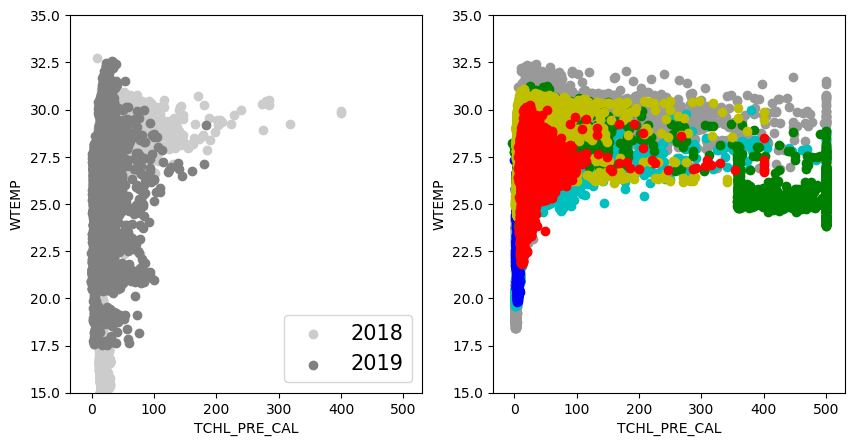

In [201]:
# plt.scatter(data_jan_jun_2012.TCHL_PRE_CAL,data_jan_jun_2012.TCHL_PRE_CAL)
fig, (ax2, ax3)=plt.subplots(1,2,figsize=(10,5),dpi=100,sharex='all')

ax2.scatter(data_jan_dec_2018.TCHL_PRE_CAL[data_jan_dec_2018.SAMPLE_MONTH>6],data_jan_dec_2018.WTEMP[data_jan_dec_2018.SAMPLE_MONTH>6],color='0.8',label='2018')
ax2.scatter(data_jan_dec_2019.TCHL_PRE_CAL[data_jan_dec_2019.SAMPLE_MONTH>6],data_jan_dec_2019.WTEMP[data_jan_dec_2019.SAMPLE_MONTH>6],color='0.5',label='2019')

ax2.set_xlabel('TCHL_PRE_CAL')
ax2.set_ylabel('WTEMP')
ax2.legend(loc="lower right",fontsize=15)
ax2.set_ylim(15,35)


ax3.scatter(data_jul_dec_2012.TCHL_PRE_CAL,data_jul_dec_2012.WTEMP,color='0.6',label='2012')
ax3.scatter(data_jul_dec_2013.TCHL_PRE_CAL,data_jul_dec_2013.WTEMP,color='c',label='2013')
ax3.scatter(data_jul_dec_2014.TCHL_PRE_CAL,data_jul_dec_2014.WTEMP,color='b',label='2014')
ax3.scatter(data_jul_dec_2015.TCHL_PRE_CAL,data_jul_dec_2015.WTEMP,color='g',label='2015')
ax3.scatter(data_jul_dec_2016.TCHL_PRE_CAL,data_jul_dec_2016.WTEMP,color='y',label='2016')
ax3.scatter(data_jul_dec_2017.TCHL_PRE_CAL,data_jul_dec_2017.WTEMP,color='r',label='2017')

ax3.set_xlabel('TCHL_PRE_CAL')
ax3.set_ylabel('WTEMP')
# ax3.legend(loc="best",fontsize=15)
ax3.set_ylim(15,35)

(5, 30)

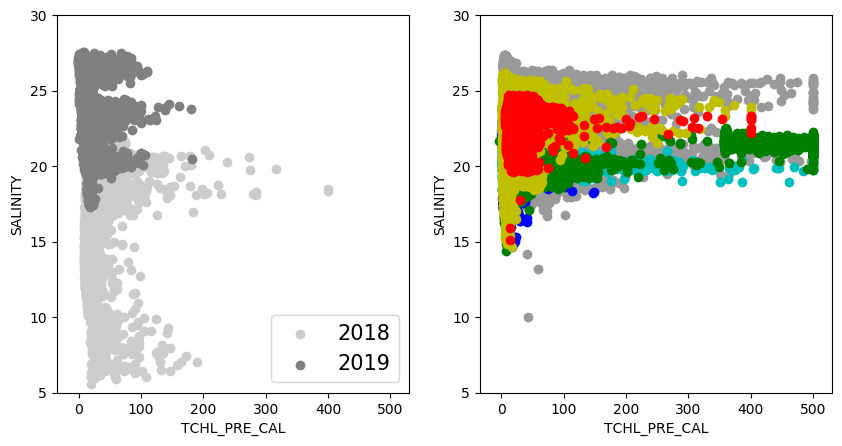

In [202]:
fig, (ax2, ax3)=plt.subplots(1,2,figsize=(10,5),dpi=100,sharex='all')

ax2.scatter(data_jan_dec_2018.TCHL_PRE_CAL[data_jan_dec_2018.SAMPLE_MONTH>6],data_jan_dec_2018.SALINITY[data_jan_dec_2018.SAMPLE_MONTH>6],color='0.8',label='2018')
ax2.scatter(data_jan_dec_2019.TCHL_PRE_CAL[data_jan_dec_2019.SAMPLE_MONTH>6],data_jan_dec_2019.SALINITY[data_jan_dec_2019.SAMPLE_MONTH>6],color='0.5',label='2019')

ax2.set_xlabel('TCHL_PRE_CAL')
ax2.set_ylabel('SALINITY')
ax2.legend(loc="lower right",fontsize=15)
ax2.set_ylim(5,30)

ax3.scatter(data_jul_dec_2012.TCHL_PRE_CAL,data_jul_dec_2012.SALINITY,color='0.6',label='2012')
ax3.scatter(data_jul_dec_2013.TCHL_PRE_CAL,data_jul_dec_2013.SALINITY,color='c',label='2013')
ax3.scatter(data_jul_dec_2014.TCHL_PRE_CAL,data_jul_dec_2014.SALINITY,color='b',label='2014')
ax3.scatter(data_jul_dec_2015.TCHL_PRE_CAL,data_jul_dec_2015.SALINITY,color='g',label='2015')
ax3.scatter(data_jul_dec_2016.TCHL_PRE_CAL,data_jul_dec_2016.SALINITY,color='y',label='2016')
ax3.scatter(data_jul_dec_2017.TCHL_PRE_CAL,data_jul_dec_2017.SALINITY,color='r',label='2017')

ax3.set_xlabel('TCHL_PRE_CAL')
ax3.set_ylabel('SALINITY')
# ax3.legend(loc="best",fontsize=15)
ax3.set_ylim(5,30)

(2, 16)

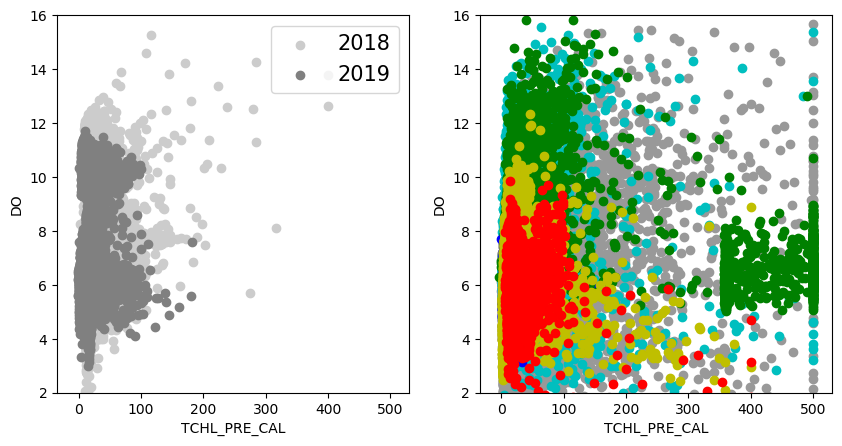

In [203]:
fig, (ax2, ax3)=plt.subplots(1,2,figsize=(10,5),dpi=100,sharex='all')

ax2.scatter(data_jan_dec_2018.TCHL_PRE_CAL[data_jan_dec_2018.SAMPLE_MONTH>6],data_jan_dec_2018.DO[data_jan_dec_2018.SAMPLE_MONTH>6],color='0.8',label='2018')
ax2.scatter(data_jan_dec_2019.TCHL_PRE_CAL[data_jan_dec_2019.SAMPLE_MONTH>6],data_jan_dec_2019.DO[data_jan_dec_2019.SAMPLE_MONTH>6],color='0.5',label='2019')
ax2.set_xlabel('TCHL_PRE_CAL')
ax2.set_ylabel('DO')
ax2.legend(loc="upper right",fontsize=15)
ax2.set_ylim(2,16)

ax3.scatter(data_jul_dec_2012.TCHL_PRE_CAL,data_jul_dec_2012.DO,color='0.6',label='2012')
ax3.scatter(data_jul_dec_2013.TCHL_PRE_CAL,data_jul_dec_2013.DO,color='c',label='2013')
ax3.scatter(data_jul_dec_2014.TCHL_PRE_CAL,data_jul_dec_2014.DO,color='b',label='2014')
ax3.scatter(data_jul_dec_2015.TCHL_PRE_CAL,data_jul_dec_2015.DO,color='g',label='2015')
ax3.scatter(data_jul_dec_2016.TCHL_PRE_CAL,data_jul_dec_2016.DO,color='y',label='2016')
ax3.scatter(data_jul_dec_2017.TCHL_PRE_CAL,data_jul_dec_2017.DO,color='r',label='2017')

ax3.set_xlabel('TCHL_PRE_CAL')
ax3.set_ylabel('DO')
# ax3.legend(loc="best",fontsize=15)
ax3.set_ylim(2,16)

(6.5, 9)

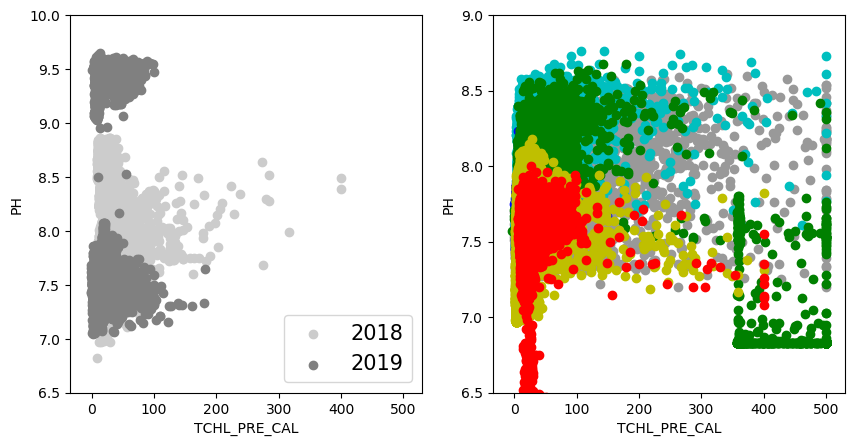

In [204]:
fig, (ax2, ax3)=plt.subplots(1,2,figsize=(10,5),dpi=100,sharex='all')

ax2.scatter(data_jan_dec_2018.TCHL_PRE_CAL[data_jan_dec_2018.SAMPLE_MONTH>6],data_jan_dec_2018.PH[data_jan_dec_2018.SAMPLE_MONTH>6],color='0.8',label='2018')
ax2.scatter(data_jan_dec_2019.TCHL_PRE_CAL[data_jan_dec_2019.SAMPLE_MONTH>6],data_jan_dec_2019.PH[data_jan_dec_2019.SAMPLE_MONTH>6],color='0.5',label='2019')
ax2.set_xlabel('TCHL_PRE_CAL')
ax2.set_ylabel('PH')
ax2.legend(loc="lower right",fontsize=15)
ax2.set_ylim(6.5,10)

ax3.scatter(data_jul_dec_2012.TCHL_PRE_CAL,data_jul_dec_2012.PH,color='0.6',label='2012')
ax3.scatter(data_jul_dec_2013.TCHL_PRE_CAL,data_jul_dec_2013.PH,color='c',label='2013')
ax3.scatter(data_jul_dec_2014.TCHL_PRE_CAL,data_jul_dec_2014.PH,color='b',label='2014')
ax3.scatter(data_jul_dec_2015.TCHL_PRE_CAL,data_jul_dec_2015.PH,color='g',label='2015')
ax3.scatter(data_jul_dec_2016.TCHL_PRE_CAL,data_jul_dec_2016.PH,color='y',label='2016')
ax3.scatter(data_jul_dec_2017.TCHL_PRE_CAL,data_jul_dec_2017.PH,color='r',label='2017')

ax3.set_xlabel('TCHL_PRE_CAL')
ax3.set_ylabel('PH')
# ax3.legend(loc="best",fontsize=15)
ax3.set_ylim(6.5,9)

(0, 1500)

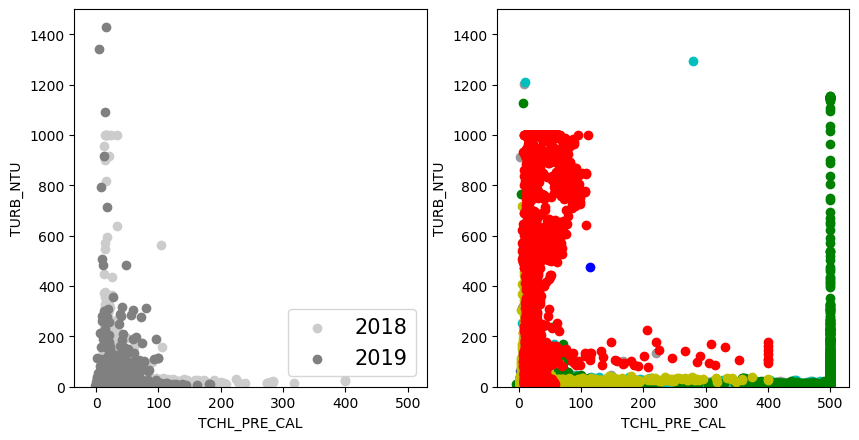

In [205]:
fig, (ax2, ax3)=plt.subplots(1,2,figsize=(10,5),dpi=100,sharex='all')

ax2.scatter(data_jan_dec_2018.TCHL_PRE_CAL[data_jan_dec_2018.SAMPLE_MONTH>6],data_jan_dec_2018.TURB_NTU[data_jan_dec_2018.SAMPLE_MONTH>6],color='0.8',label='2018')
ax2.scatter(data_jan_dec_2019.TCHL_PRE_CAL[data_jan_dec_2019.SAMPLE_MONTH>6],data_jan_dec_2019.TURB_NTU[data_jan_dec_2019.SAMPLE_MONTH>6],color='0.5',label='2019')
ax2.set_xlabel('TCHL_PRE_CAL')
ax2.set_ylabel('TURB_NTU')
ax2.legend(loc="lower right",fontsize=15)
ax2.set_ylim(0,1500)

ax3.scatter(data_jul_dec_2012.TCHL_PRE_CAL,data_jul_dec_2012.TURB_NTU,color='0.6',label='2012')
ax3.scatter(data_jul_dec_2013.TCHL_PRE_CAL,data_jul_dec_2013.TURB_NTU,color='c',label='2013')
ax3.scatter(data_jul_dec_2014.TCHL_PRE_CAL,data_jul_dec_2014.TURB_NTU,color='b',label='2014')
ax3.scatter(data_jul_dec_2015.TCHL_PRE_CAL,data_jul_dec_2015.TURB_NTU,color='g',label='2015')
ax3.scatter(data_jul_dec_2016.TCHL_PRE_CAL,data_jul_dec_2016.TURB_NTU,color='y',label='2016')
ax3.scatter(data_jul_dec_2017.TCHL_PRE_CAL,data_jul_dec_2017.TURB_NTU,color='r',label='2017')

ax3.set_xlabel('TCHL_PRE_CAL')
ax3.set_ylabel('TURB_NTU')
# ax3.legend(loc="best",fontsize=15)
ax3.set_ylim(0,1500)

# Correlation - only with data collected between 12:00 and 15:00

(15, 35)

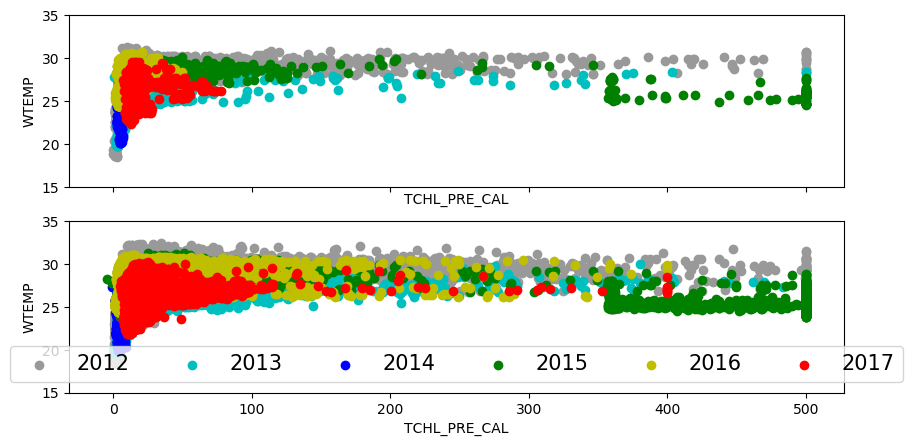

In [206]:
fig, (ax2,ax3)=plt.subplots(2,1,figsize=(10,5),dpi=100,sharex='all')


ax2.scatter(data_jul_dec_2012.TCHL_PRE_CAL[(data_jul_dec_2012.SAMPLE_TIME>0.5)&(data_jul_dec_2012.SAMPLE_TIME<0.6)],data_jul_dec_2012.WTEMP[(data_jul_dec_2012.SAMPLE_TIME>0.5)&(data_jul_dec_2012.SAMPLE_TIME<0.6)],color='0.6',label='2012')
ax2.scatter(data_jul_dec_2013.TCHL_PRE_CAL[(data_jul_dec_2013.SAMPLE_TIME>0.5)&(data_jul_dec_2013.SAMPLE_TIME<0.6)],data_jul_dec_2013.WTEMP[(data_jul_dec_2013.SAMPLE_TIME>0.5)&(data_jul_dec_2013.SAMPLE_TIME<0.6)],color='c',label='2013')
ax2.scatter(data_jul_dec_2014.TCHL_PRE_CAL[(data_jul_dec_2014.SAMPLE_TIME>0.5)&(data_jul_dec_2014.SAMPLE_TIME<0.6)],data_jul_dec_2014.WTEMP[(data_jul_dec_2014.SAMPLE_TIME>0.5)&(data_jul_dec_2014.SAMPLE_TIME<0.6)],color='b',label='2014')
ax2.scatter(data_jul_dec_2015.TCHL_PRE_CAL[(data_jul_dec_2015.SAMPLE_TIME>0.5)&(data_jul_dec_2015.SAMPLE_TIME<0.6)],data_jul_dec_2015.WTEMP[(data_jul_dec_2015.SAMPLE_TIME>0.5)&(data_jul_dec_2015.SAMPLE_TIME<0.6)],color='g',label='2015')
ax2.scatter(data_jul_dec_2016.TCHL_PRE_CAL[(data_jul_dec_2016.SAMPLE_TIME>0.5)&(data_jul_dec_2016.SAMPLE_TIME<0.6)],data_jul_dec_2016.WTEMP[(data_jul_dec_2016.SAMPLE_TIME>0.5)&(data_jul_dec_2016.SAMPLE_TIME<0.6)],color='y',label='2016')
ax2.scatter(data_jul_dec_2017.TCHL_PRE_CAL[(data_jul_dec_2017.SAMPLE_TIME>0.5)&(data_jul_dec_2017.SAMPLE_TIME<0.6)],data_jul_dec_2017.WTEMP[(data_jul_dec_2017.SAMPLE_TIME>0.5)&(data_jul_dec_2017.SAMPLE_TIME<0.6)],color='r',label='2017')

ax2.set_xlabel('TCHL_PRE_CAL')
ax2.set_ylabel('WTEMP')
# ax2.legend(loc="upper center",fontsize=15,ncol=6)
ax2.set_ylim(15,35)

ax3.scatter(data_jul_dec_2012.TCHL_PRE_CAL,data_jul_dec_2012.WTEMP,color='0.6',label='2012')
ax3.scatter(data_jul_dec_2013.TCHL_PRE_CAL,data_jul_dec_2013.WTEMP,color='c',label='2013')
ax3.scatter(data_jul_dec_2014.TCHL_PRE_CAL,data_jul_dec_2014.WTEMP,color='b',label='2014')
ax3.scatter(data_jul_dec_2015.TCHL_PRE_CAL,data_jul_dec_2015.WTEMP,color='g',label='2015')
ax3.scatter(data_jul_dec_2016.TCHL_PRE_CAL,data_jul_dec_2016.WTEMP,color='y',label='2016')
ax3.scatter(data_jul_dec_2017.TCHL_PRE_CAL,data_jul_dec_2017.WTEMP,color='r',label='2017')

ax3.set_xlabel('TCHL_PRE_CAL')
ax3.set_ylabel('WTEMP')
ax3.legend(loc="lower center",fontsize=15,ncol=6)
ax3.set_ylim(15,35)

# Correlation plots -  max values per day

(20, 40)

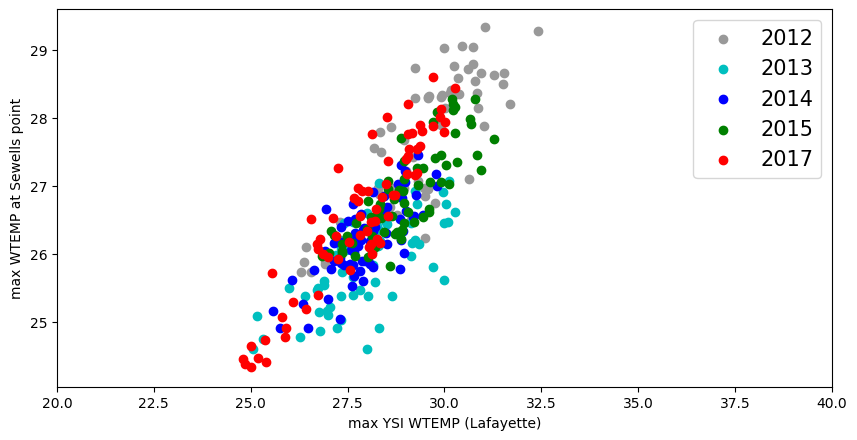

In [99]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')

ax3.scatter(data_Laf_moor_matchdays_12.maxWTEMP,data_Laf_moor_matchdays_12.maxWTempSewells,color='0.6',label='2012')
ax3.scatter(data_Laf_moor_matchdays_13.maxWTEMP,data_Laf_moor_matchdays_13.maxWTempSewells,color='c',label='2013')
ax3.scatter(data_Laf_moor_matchdays_14.maxWTEMP,data_Laf_moor_matchdays_14.maxWTempSewells,color='b',label='2014')
ax3.scatter(data_Laf_moor_matchdays_15.maxWTEMP,data_Laf_moor_matchdays_15.maxWTempSewells,color='g',label='2015')
# ax3.scatter(data_Laf_moor_matchdays_16.maxWTEMP,data_Laf_moor_matchdays_16.maxWTempSewells,color='y',label='2016')
ax3.scatter(data_Laf_moor_matchdays_17.maxWTEMP,data_Laf_moor_matchdays_17.maxWTempSewells,color='r',label='2017')

ax3.set_xlabel('max YSI WTEMP (Lafayette)')
ax3.set_ylabel('max WTEMP at Sewells point')
ax3.legend(loc="best",fontsize=15)
ax3.set_xlim(20,40)

(2, 510)

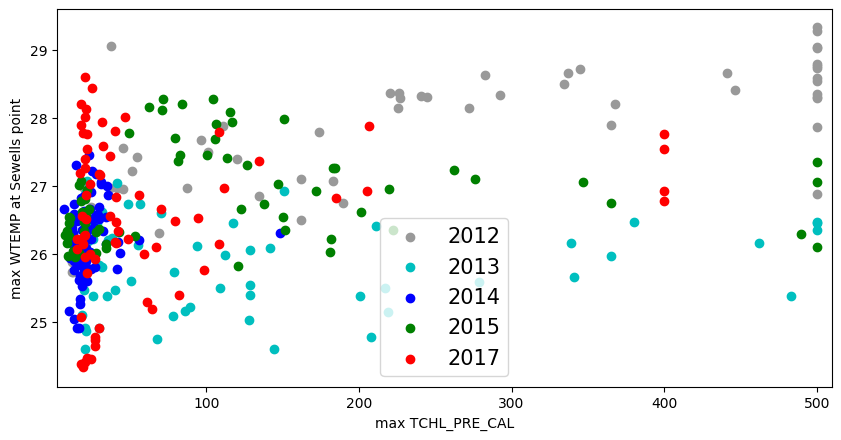

In [101]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')

ax3.scatter(data_Laf_moor_matchdays_12.maxTCHL,data_Laf_moor_matchdays_12.maxWTempSewells,color='0.6',label='2012')
ax3.scatter(data_Laf_moor_matchdays_13.maxTCHL,data_Laf_moor_matchdays_13.maxWTempSewells,color='c',label='2013')
ax3.scatter(data_Laf_moor_matchdays_14.maxTCHL,data_Laf_moor_matchdays_14.maxWTempSewells,color='b',label='2014')
ax3.scatter(data_Laf_moor_matchdays_15.maxTCHL,data_Laf_moor_matchdays_15.maxWTempSewells,color='g',label='2015')
# ax3.scatter(data_Laf_moor_matchdays_16.maxTCHL,data_Laf_moor_matchdays_16.maxWTempSewells,color='y',label='2016')
ax3.scatter(data_Laf_moor_matchdays_17.maxTCHL,data_Laf_moor_matchdays_17.maxWTempSewells,color='r',label='2017')

ax3.set_xlabel('max TCHL_PRE_CAL')
ax3.set_ylabel('max WTEMP at Sewells point')
ax3.legend(loc="best",fontsize=15)
ax3.set_xlim(2,510)

Text(0, 0.5, 'max Air TEMP')

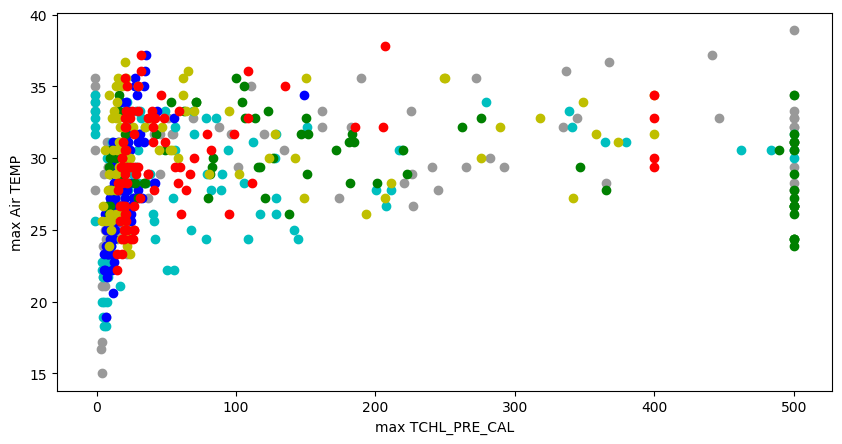

In [217]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')

ax3.scatter(data_Laf_moor_matchdays_12.maxTCHL,data_Laf_moor_matchdays_12.maxAirTemp,color='0.6',label='2012')
ax3.scatter(data_Laf_moor_matchdays_13.maxTCHL,data_Laf_moor_matchdays_13.maxAirTemp,color='c',label='2013')
ax3.scatter(data_Laf_moor_matchdays_14.maxTCHL,data_Laf_moor_matchdays_14.maxAirTemp,color='b',label='2014')
ax3.scatter(data_Laf_moor_matchdays_15.maxTCHL,data_Laf_moor_matchdays_15.maxAirTemp,color='g',label='2015')
ax3.scatter(data_Laf_moor_matchdays_16.maxTCHL,data_Laf_moor_matchdays_16.maxAirTemp,color='y',label='2016')
ax3.scatter(data_Laf_moor_matchdays_17.maxTCHL,data_Laf_moor_matchdays_17.maxAirTemp,color='r',label='2017')

ax3.set_xlabel('max TCHL_PRE_CAL')
ax3.set_ylabel('max Air TEMP')
# ax3.legend(loc="best",fontsize=15)

(15, 40)

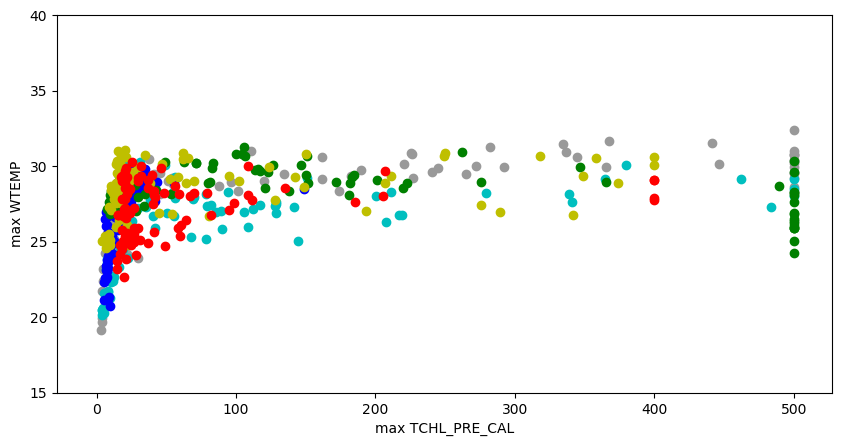

In [218]:
# plt.scatter(data_jan_jun_2012.TCHL_PRE_CAL,data_jan_jun_2012.TCHL_PRE_CAL)
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')

ax3.scatter(data_Laf_moor_matchdays_12.maxTCHL,data_Laf_moor_matchdays_12.maxWTEMP,color='0.6',label='2012')
ax3.scatter(data_Laf_moor_matchdays_13.maxTCHL,data_Laf_moor_matchdays_13.maxWTEMP,color='c',label='2013')
ax3.scatter(data_Laf_moor_matchdays_14.maxTCHL,data_Laf_moor_matchdays_14.maxWTEMP,color='b',label='2014')
ax3.scatter(data_Laf_moor_matchdays_15.maxTCHL,data_Laf_moor_matchdays_15.maxWTEMP,color='g',label='2015')
ax3.scatter(data_Laf_moor_matchdays_16.maxTCHL,data_Laf_moor_matchdays_16.maxWTEMP,color='y',label='2016')
ax3.scatter(data_Laf_moor_matchdays_17.maxTCHL,data_Laf_moor_matchdays_17.maxWTEMP,color='r',label='2017')

ax3.set_xlabel('max TCHL_PRE_CAL')
ax3.set_ylabel('max WTEMP')
# ax3.legend(loc="best",fontsize=15)
ax3.set_ylim(15,40)

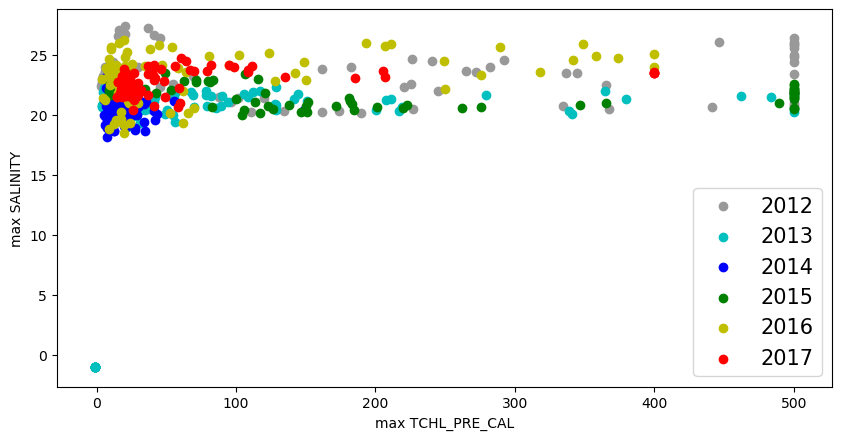

In [210]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')

ax3.scatter(data_Laf_moor_matchdays_12.maxTCHL,data_Laf_moor_matchdays_12.maxSAL,color='0.6',label='2012')
ax3.scatter(data_Laf_moor_matchdays_13.maxTCHL,data_Laf_moor_matchdays_13.maxSAL,color='c',label='2013')
ax3.scatter(data_Laf_moor_matchdays_14.maxTCHL,data_Laf_moor_matchdays_14.maxSAL,color='b',label='2014')
ax3.scatter(data_Laf_moor_matchdays_15.maxTCHL,data_Laf_moor_matchdays_15.maxSAL,color='g',label='2015')
ax3.scatter(data_Laf_moor_matchdays_16.maxTCHL,data_Laf_moor_matchdays_16.maxSAL,color='y',label='2016')
ax3.scatter(data_Laf_moor_matchdays_17.maxTCHL,data_Laf_moor_matchdays_17.maxSAL,color='r',label='2017')

ax3.set_xlabel('max TCHL_PRE_CAL')
ax3.set_ylabel('max SALINITY')
ax3.legend(loc="best",fontsize=15)
# ax3.set_ylim(15,35)

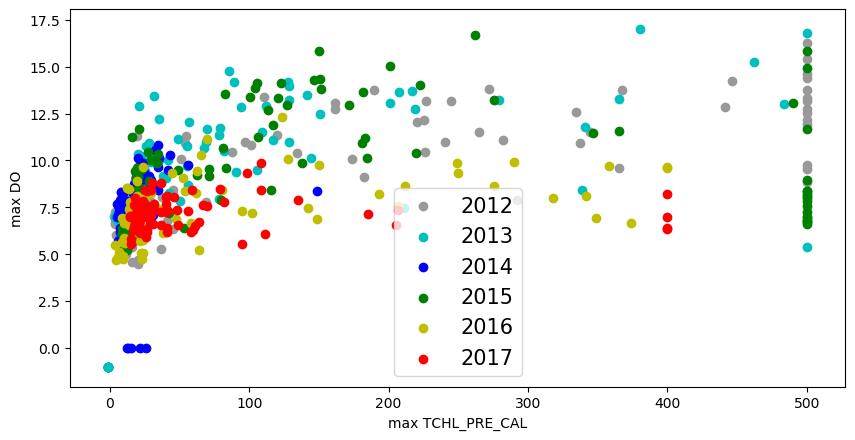

In [211]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')

ax3.scatter(data_Laf_moor_matchdays_12.maxTCHL,data_Laf_moor_matchdays_12.maxDO,color='0.6',label='2012')
ax3.scatter(data_Laf_moor_matchdays_13.maxTCHL,data_Laf_moor_matchdays_13.maxDO,color='c',label='2013')
ax3.scatter(data_Laf_moor_matchdays_14.maxTCHL,data_Laf_moor_matchdays_14.maxDO,color='b',label='2014')
ax3.scatter(data_Laf_moor_matchdays_15.maxTCHL,data_Laf_moor_matchdays_15.maxDO,color='g',label='2015')
ax3.scatter(data_Laf_moor_matchdays_16.maxTCHL,data_Laf_moor_matchdays_16.maxDO,color='y',label='2016')
ax3.scatter(data_Laf_moor_matchdays_17.maxTCHL,data_Laf_moor_matchdays_17.maxDO,color='r',label='2017')

ax3.set_xlabel('max TCHL_PRE_CAL')
ax3.set_ylabel('max DO')
ax3.legend(loc="best",fontsize=15)
# ax3.set_ylim(15,35)

(5, 9)

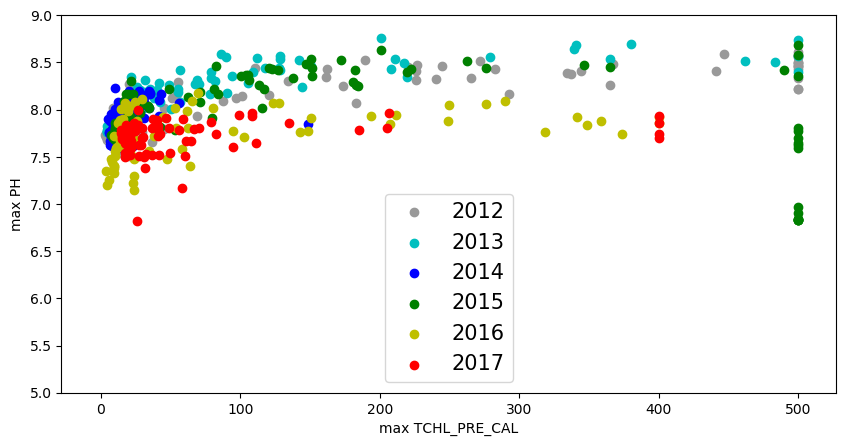

In [212]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')

ax3.scatter(data_Laf_moor_matchdays_12.maxTCHL,data_Laf_moor_matchdays_12.maxPH,color='0.6',label='2012')
ax3.scatter(data_Laf_moor_matchdays_13.maxTCHL,data_Laf_moor_matchdays_13.maxPH,color='c',label='2013')
ax3.scatter(data_Laf_moor_matchdays_14.maxTCHL,data_Laf_moor_matchdays_14.maxPH,color='b',label='2014')
ax3.scatter(data_Laf_moor_matchdays_15.maxTCHL,data_Laf_moor_matchdays_15.maxPH,color='g',label='2015')
ax3.scatter(data_Laf_moor_matchdays_16.maxTCHL,data_Laf_moor_matchdays_16.maxPH,color='y',label='2016')
ax3.scatter(data_Laf_moor_matchdays_17.maxTCHL,data_Laf_moor_matchdays_17.maxPH,color='r',label='2017')

ax3.set_xlabel('max TCHL_PRE_CAL')
ax3.set_ylabel('max PH')
ax3.legend(loc="best",fontsize=15)
ax3.set_ylim(5,9)

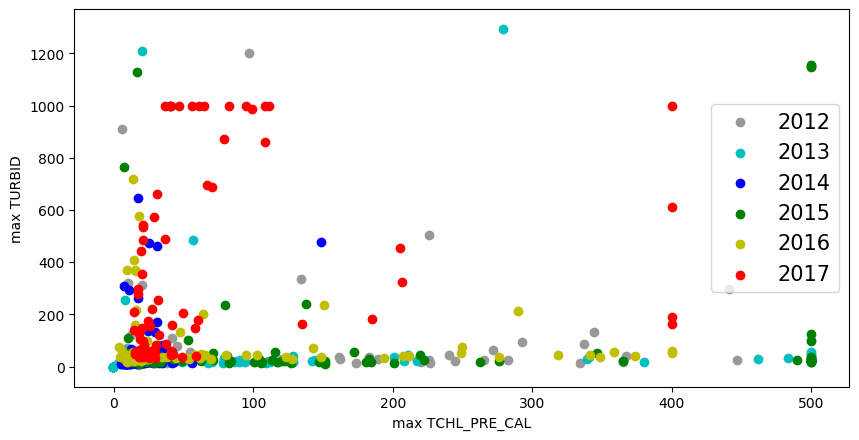

In [213]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')

ax3.scatter(data_Laf_moor_matchdays_12.maxTCHL,data_Laf_moor_matchdays_12.maxTURB,color='0.6',label='2012')
ax3.scatter(data_Laf_moor_matchdays_13.maxTCHL,data_Laf_moor_matchdays_13.maxTURB,color='c',label='2013')
ax3.scatter(data_Laf_moor_matchdays_14.maxTCHL,data_Laf_moor_matchdays_14.maxTURB,color='b',label='2014')
ax3.scatter(data_Laf_moor_matchdays_15.maxTCHL,data_Laf_moor_matchdays_15.maxTURB,color='g',label='2015')
ax3.scatter(data_Laf_moor_matchdays_16.maxTCHL,data_Laf_moor_matchdays_16.maxTURB,color='y',label='2016')
ax3.scatter(data_Laf_moor_matchdays_17.maxTCHL,data_Laf_moor_matchdays_17.maxTURB,color='r',label='2017')

ax3.set_xlabel('max TCHL_PRE_CAL')
ax3.set_ylabel('max TURBID')
ax3.legend(loc="best",fontsize=15)
# ax3.set_ylim(5,9)

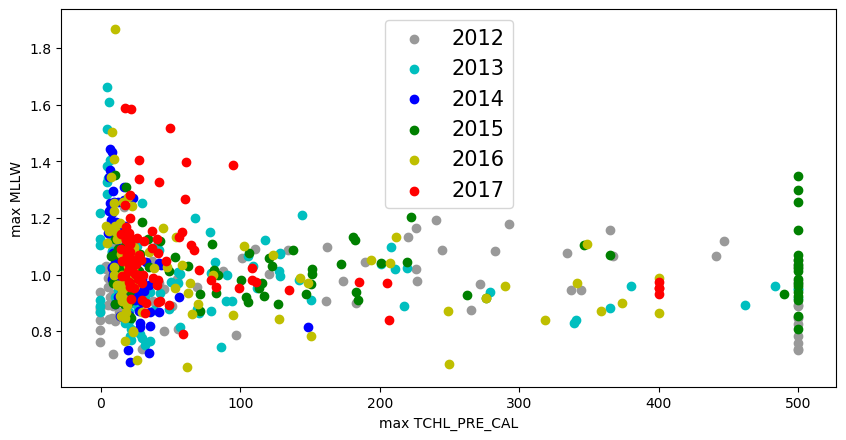

In [214]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')

ax3.scatter(data_Laf_moor_matchdays_12.maxTCHL,data_Laf_moor_matchdays_12.maxMLLW,color='0.6',label='2012')
ax3.scatter(data_Laf_moor_matchdays_13.maxTCHL,data_Laf_moor_matchdays_13.maxMLLW,color='c',label='2013')
ax3.scatter(data_Laf_moor_matchdays_14.maxTCHL,data_Laf_moor_matchdays_14.maxMLLW,color='b',label='2014')
ax3.scatter(data_Laf_moor_matchdays_15.maxTCHL,data_Laf_moor_matchdays_15.maxMLLW,color='g',label='2015')
ax3.scatter(data_Laf_moor_matchdays_16.maxTCHL,data_Laf_moor_matchdays_16.maxMLLW,color='y',label='2016')
ax3.scatter(data_Laf_moor_matchdays_17.maxTCHL,data_Laf_moor_matchdays_17.maxMLLW,color='r',label='2017')

ax3.set_xlabel('max TCHL_PRE_CAL')
ax3.set_ylabel('max MLLW')
ax3.legend(loc="best",fontsize=15)
# ax3.set_ylim(15,35)

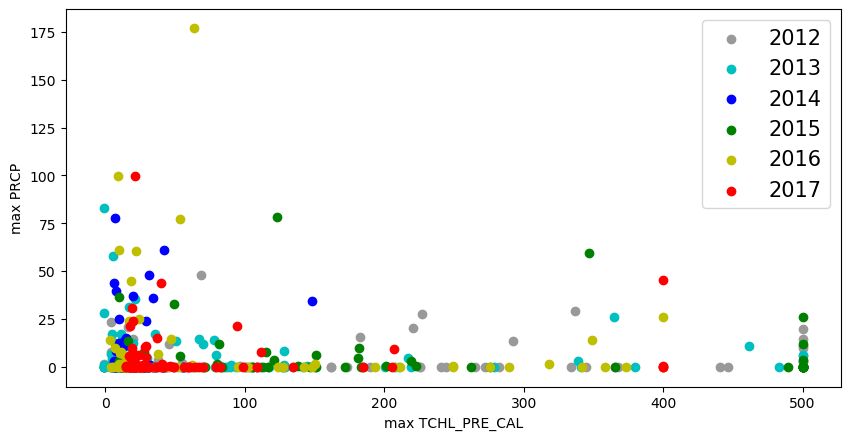

In [215]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')

ax3.scatter(data_Laf_moor_matchdays_12.maxTCHL,data_Laf_moor_matchdays_12.maxPRCP,color='0.6',label='2012')
ax3.scatter(data_Laf_moor_matchdays_13.maxTCHL,data_Laf_moor_matchdays_13.maxPRCP,color='c',label='2013')
ax3.scatter(data_Laf_moor_matchdays_14.maxTCHL,data_Laf_moor_matchdays_14.maxPRCP,color='b',label='2014')
ax3.scatter(data_Laf_moor_matchdays_15.maxTCHL,data_Laf_moor_matchdays_15.maxPRCP,color='g',label='2015')
ax3.scatter(data_Laf_moor_matchdays_16.maxTCHL,data_Laf_moor_matchdays_16.maxPRCP,color='y',label='2016')
ax3.scatter(data_Laf_moor_matchdays_17.maxTCHL,data_Laf_moor_matchdays_17.maxPRCP,color='r',label='2017')

ax3.set_xlabel('max TCHL_PRE_CAL')
ax3.set_ylabel('max PRCP')
ax3.legend(loc="best",fontsize=15)
# ax3.set_ylim(15,35)

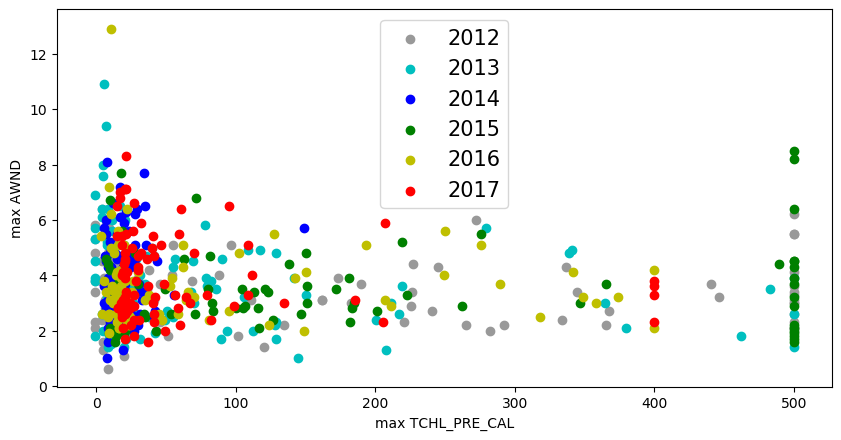

In [216]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')

ax3.scatter(data_Laf_moor_matchdays_12.maxTCHL,data_Laf_moor_matchdays_12.maxAWND,color='0.6',label='2012')
ax3.scatter(data_Laf_moor_matchdays_13.maxTCHL,data_Laf_moor_matchdays_13.maxAWND,color='c',label='2013')
ax3.scatter(data_Laf_moor_matchdays_14.maxTCHL,data_Laf_moor_matchdays_14.maxAWND,color='b',label='2014')
ax3.scatter(data_Laf_moor_matchdays_15.maxTCHL,data_Laf_moor_matchdays_15.maxAWND,color='g',label='2015')
ax3.scatter(data_Laf_moor_matchdays_16.maxTCHL,data_Laf_moor_matchdays_16.maxAWND,color='y',label='2016')
ax3.scatter(data_Laf_moor_matchdays_17.maxTCHL,data_Laf_moor_matchdays_17.maxAWND,color='r',label='2017')

ax3.set_xlabel('max TCHL_PRE_CAL')
ax3.set_ylabel('max AWND')
ax3.legend(loc="best",fontsize=15)
# ax3.set_ylim(15,35)

# monthly average per year

In [26]:
Chla_jul_12avg=np.mean(data_jul_dec_2012.TCHL_PRE_CAL[data_jul_dec_2012.SAMPLE_MONTH==7])
Chla_aug_12avg=np.mean(data_jul_dec_2012.TCHL_PRE_CAL[data_jul_dec_2012.SAMPLE_MONTH==8])
Chla_sep_12avg=np.mean(data_jul_dec_2012.TCHL_PRE_CAL[data_jul_dec_2012.SAMPLE_MONTH==9])
Chla_oct_12avg=np.mean(data_jul_dec_2012.TCHL_PRE_CAL[data_jul_dec_2012.SAMPLE_MONTH==10])

Chla_jul_13avg=np.mean(data_jul_dec_2013.TCHL_PRE_CAL[data_jul_dec_2013.SAMPLE_MONTH==7])
Chla_aug_13avg=np.mean(data_jul_dec_2013.TCHL_PRE_CAL[data_jul_dec_2013.SAMPLE_MONTH==8])
Chla_sep_13avg=np.mean(data_jul_dec_2013.TCHL_PRE_CAL[data_jul_dec_2013.SAMPLE_MONTH==9])
Chla_oct_13avg=np.mean(data_jul_dec_2013.TCHL_PRE_CAL[data_jul_dec_2013.SAMPLE_MONTH==10])

Chla_jul_14avg=np.mean(data_jul_dec_2014.TCHL_PRE_CAL[data_jul_dec_2014.SAMPLE_MONTH==7])
Chla_aug_14avg=np.mean(data_jul_dec_2014.TCHL_PRE_CAL[data_jul_dec_2014.SAMPLE_MONTH==8])
Chla_sep_14avg=np.mean(data_jul_dec_2014.TCHL_PRE_CAL[data_jul_dec_2014.SAMPLE_MONTH==9])
Chla_oct_14avg=np.mean(data_jul_dec_2014.TCHL_PRE_CAL[data_jul_dec_2014.SAMPLE_MONTH==10])

Chla_jul_15avg=np.mean(data_jul_dec_2015.TCHL_PRE_CAL[data_jul_dec_2015.SAMPLE_MONTH==7])
Chla_aug_15avg=np.mean(data_jul_dec_2015.TCHL_PRE_CAL[data_jul_dec_2015.SAMPLE_MONTH==8])
Chla_sep_15avg=np.mean(data_jul_dec_2015.TCHL_PRE_CAL[data_jul_dec_2015.SAMPLE_MONTH==9])
Chla_oct_15avg=np.mean(data_jul_dec_2015.TCHL_PRE_CAL[data_jul_dec_2015.SAMPLE_MONTH==10])

Chla_jul_16avg=np.mean(data_jul_dec_2016.TCHL_PRE_CAL[data_jul_dec_2016.SAMPLE_MONTH==7])
Chla_aug_16avg=np.mean(data_jul_dec_2016.TCHL_PRE_CAL[data_jul_dec_2016.SAMPLE_MONTH==8])
Chla_sep_16avg=np.mean(data_jul_dec_2016.TCHL_PRE_CAL[data_jul_dec_2016.SAMPLE_MONTH==9])
Chla_oct_16avg=np.mean(data_jul_dec_2016.TCHL_PRE_CAL[data_jul_dec_2016.SAMPLE_MONTH==10])

Chla_jul_17avg=np.mean(data_jul_dec_2017.TCHL_PRE_CAL[data_jul_dec_2017.SAMPLE_MONTH==7])
Chla_aug_17avg=np.mean(data_jul_dec_2017.TCHL_PRE_CAL[data_jul_dec_2017.SAMPLE_MONTH==8])
Chla_sep_17avg=np.mean(data_jul_dec_2017.TCHL_PRE_CAL[data_jul_dec_2017.SAMPLE_MONTH==9])
Chla_oct_17avg=np.mean(data_jul_dec_2017.TCHL_PRE_CAL[data_jul_dec_2017.SAMPLE_MONTH==10])
Chla_sep_17avg

16.621553279386713

In [39]:
CTEs_Chla=[Chla_jul_12avg,Chla_aug_12avg,Chla_sep_12avg,Chla_oct_12avg,
          Chla_jul_13avg,Chla_aug_13avg,Chla_sep_13avg,Chla_oct_13avg,
          Chla_jul_14avg,Chla_aug_14avg,Chla_sep_14avg,Chla_oct_14avg,
          Chla_jul_15avg,Chla_aug_15avg,Chla_sep_15avg,Chla_oct_15avg,
          Chla_jul_16avg,Chla_aug_16avg,Chla_sep_16avg,Chla_oct_16avg,
          Chla_jul_17avg,Chla_aug_17avg,Chla_sep_17avg,Chla_oct_17avg]
CTEs_Chla

[30.89388523047981,
 44.185967741935514,
 6.463508820669536,
 3.1318468823993686,
 9.422222222222194,
 28.139718215364006,
 25.05495839112342,
 6.057030692362605,
 14.287084870848734,
 8.86308724832215,
 7.026733703190039,
 4.758866995073889,
 39.35313653136536,
 16.928624161073884,
 248.27085264133453,
 nan,
 13.085336743392997,
 18.049778597785917,
 10.3939801178203,
 6.157671957671955,
 24.505381546218523,
 20.14208138440872,
 16.621553279386713,
 nan]

In [47]:
sites_Chla=['jul','aug','sep','oct',
           'jul','aug','sep','oct',
           'jul','aug','sep','oct',
           'jul','aug','sep','oct',
           'jul','aug','sep','oct',
           'jul','aug','sep','oct']

x_pos_Chla=np.arange(len(sites_Chla))

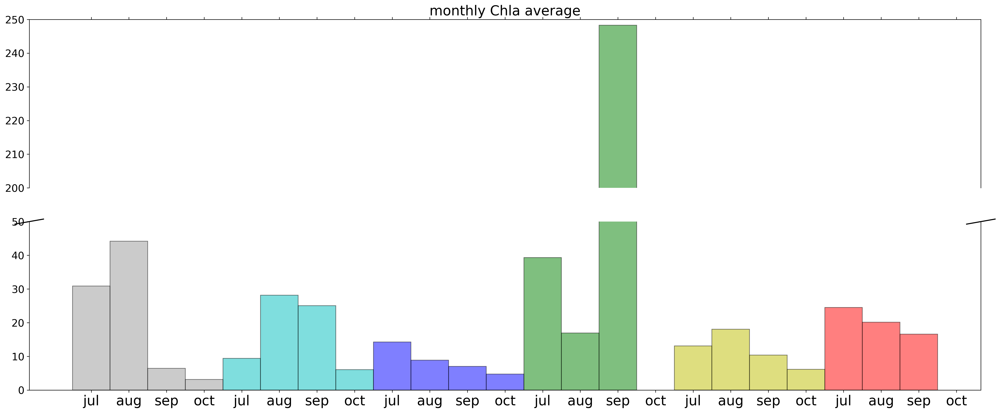

In [96]:
f, (ax20, ax2) = plt.subplots(2, 1, sharex=True,figsize=(25,10),dpi=300)

ax20.bar(x_pos_Chla,CTEs_Chla, align='center', alpha=0.5, ecolor='black', capsize=5, color=['0.6','0.6','0.6','0.6','c','c','c','c','b','b','b','b','g','g','g','g','y','y','y','y','r','r','r','r'], edgecolor='black',width=1)
ax2.bar(x_pos_Chla,CTEs_Chla, align='center', alpha=0.5, ecolor='black', capsize=5, color=['0.6','0.6','0.6','0.6','c','c','c','c','b','b','b','b','g','g','g','g','y','y','y','y','r','r','r','r'], edgecolor='black',width=1)

# ax20.set_ylabel('[Chla]',fontsize=15)
ax2.tick_params(axis='y',labelcolor='k',labelsize=15)
ax20.tick_params(axis='y',labelcolor='k',labelsize=15)
ax2.set_xticks(x_pos_Chla)
ax2.set_xticklabels(sites_Chla, fontsize=20)
ax20.set_title('monthly Chla average', fontsize=20)

ax20.set_ylim(200, 250)  # outliers only
ax2.set_ylim(0, 50)

ax20.spines['bottom'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax20.xaxis.tick_top()
ax20.tick_params(labeltop=False)  # don't put tick labels at the top
ax2.xaxis.tick_bottom()

d = .015  # how big to make the diagonal lines in axes coordinates
# arguments to pass to plot, just so we don't keep repeating them
kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
ax.plot((-d, +d), (-d, +d), **kwargs)        # top-left diagonal
ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)  # top-right diagonal

kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
ax2.plot((-d, +d), (1 - d, 1 + d), **kwargs)  # bottom-left diagonal
ax2.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)  # bottom-right diagonal

# What's cool about this is that now if we vary the distance between
# ax and ax2 via f.subplots_adjust(hspace=...) or plt.subplot_tool(),
# the diagonal lines will move accordingly, and stay right at the tips
# of the spines they are 'breaking'

plt.show()

# scatter plots of Chl and water-variables from long term lafayette monitoring data (1999 - 2019)

In [99]:
data_Laf_longterm_matchdays.columns

Index(['VECOS_CHL', 'VECOS_WTEMP', 'VECOS_DIN', 'VECOS_DON', 'VECOS_DOP',
       'VECOS_NH4', 'VECOS_NO23F', 'VECOS_NO2F', 'VECOS_NO3F', 'VECOS_PO4F',
       'VECOS_SAL', 'VECOS_SECCHI', 'VECOS_SIGT', 'VECOS_TDN', 'VECOS_TSS'],
      dtype='object')

Text(0, 0.5, 'VECOS_WTEMP')

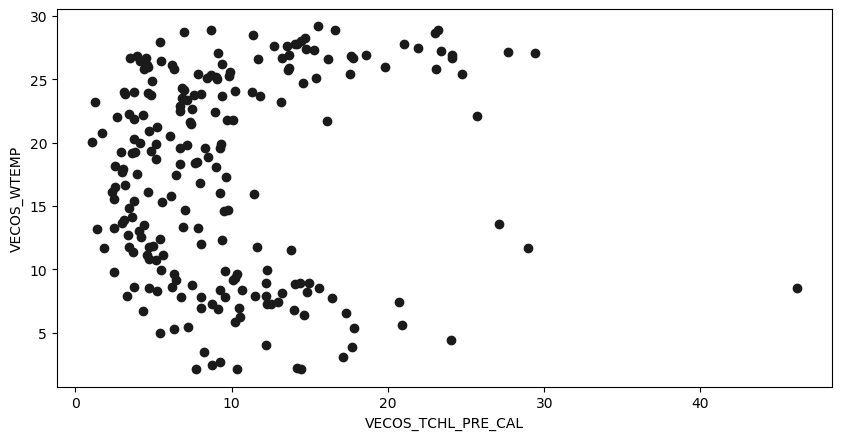

In [80]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_WTEMP,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_WTEMP')

Text(0, 0.5, 'VECOS_DIN')

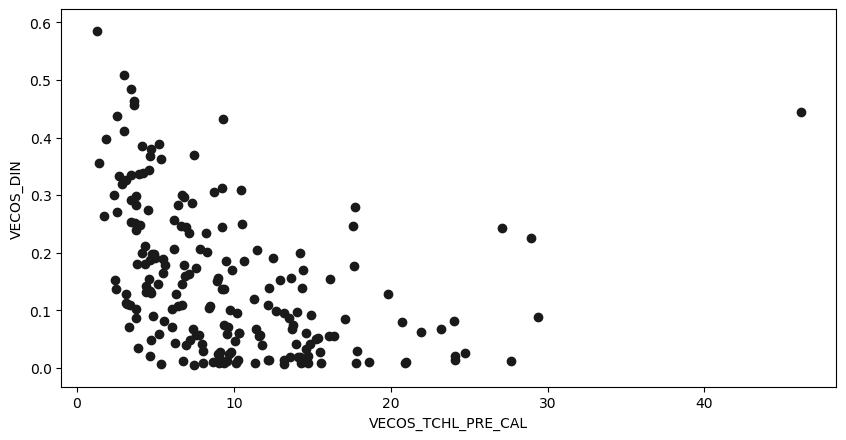

In [101]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_DIN,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_DIN')

Text(0, 0.5, 'VECOS_DON')

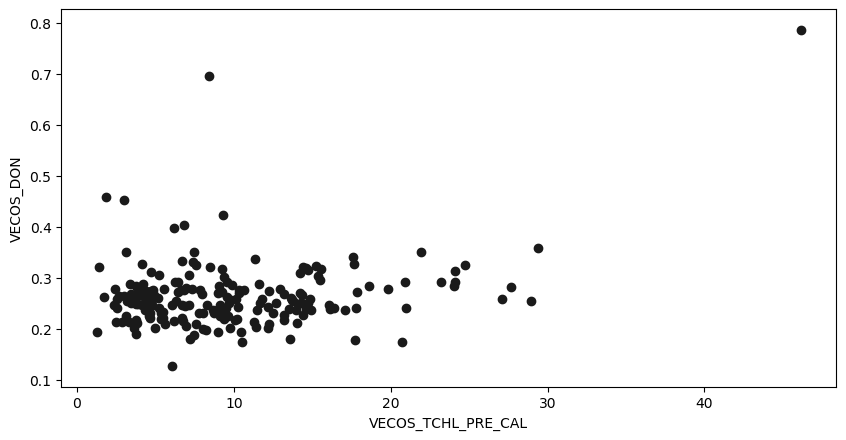

In [102]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_DON,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_DON')

Text(0, 0.5, 'VECOS_DOP')

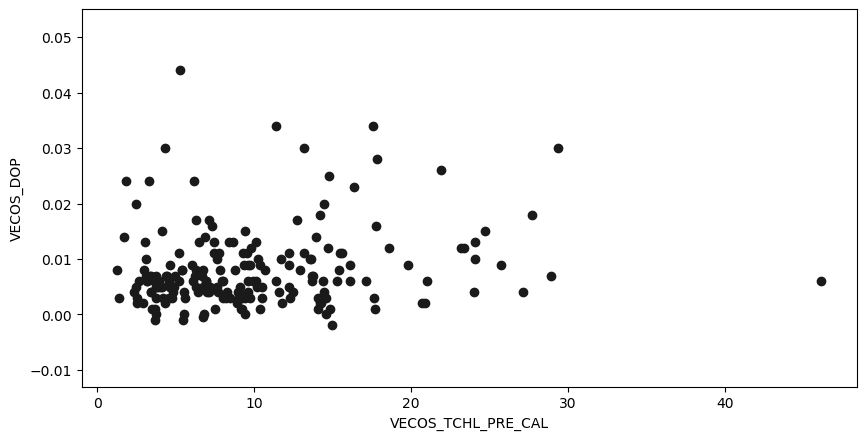

In [103]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_DOP,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_DOP')

Text(0, 0.5, 'VECOS_NH4F')

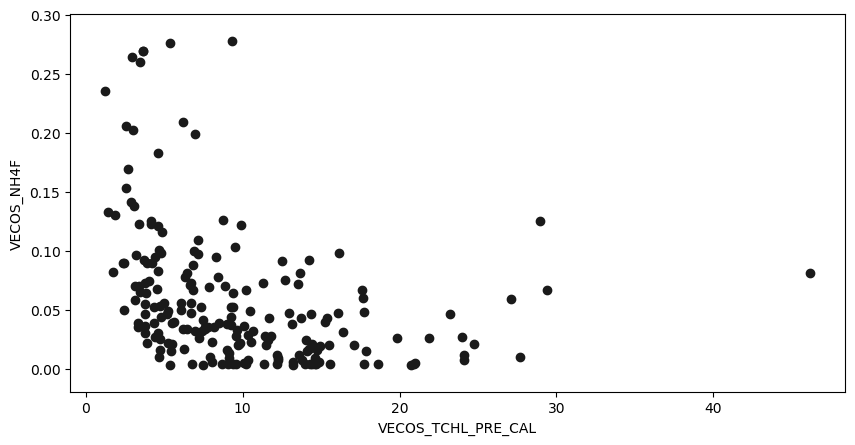

In [105]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_NH4,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_NH4F')

Text(0, 0.5, 'VECOS_NO23F')

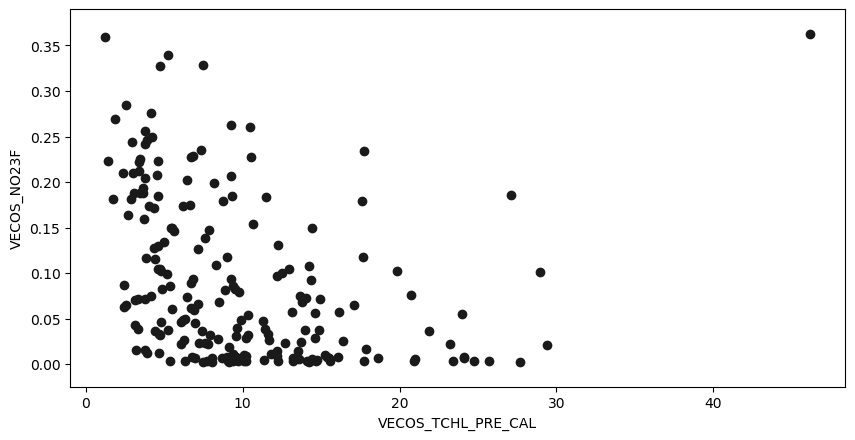

In [106]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_NO23F,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_NO23F')

Text(0, 0.5, 'VECOS_NO2F')

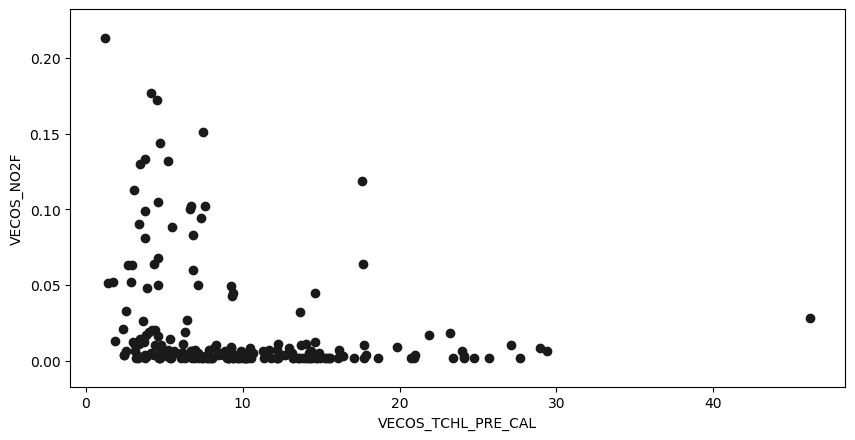

In [107]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_NO2F,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_NO2F')

Text(0, 0.5, 'VECOS_NO3F')

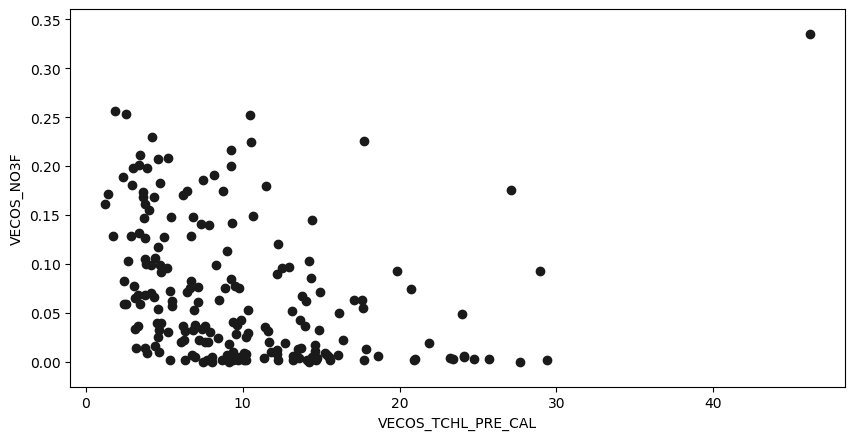

In [108]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_NO3F,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_NO3F')

Text(0, 0.5, 'VECOS_PO4F')

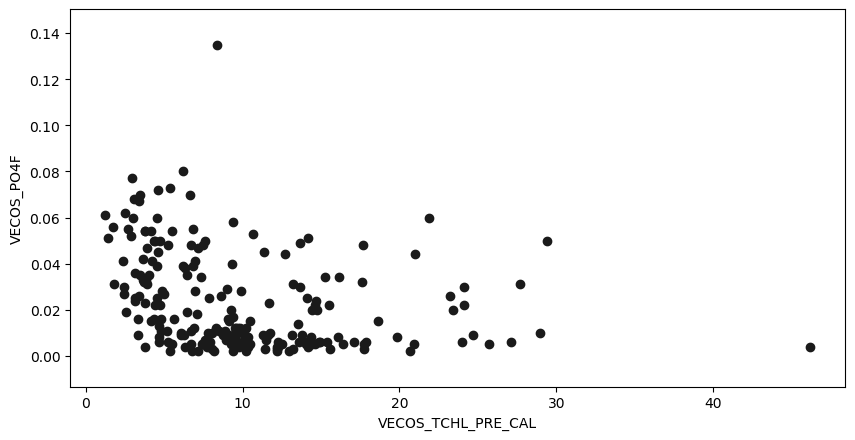

In [109]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_PO4F,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_PO4F')

Text(0, 0.5, 'VECOS_TDN')

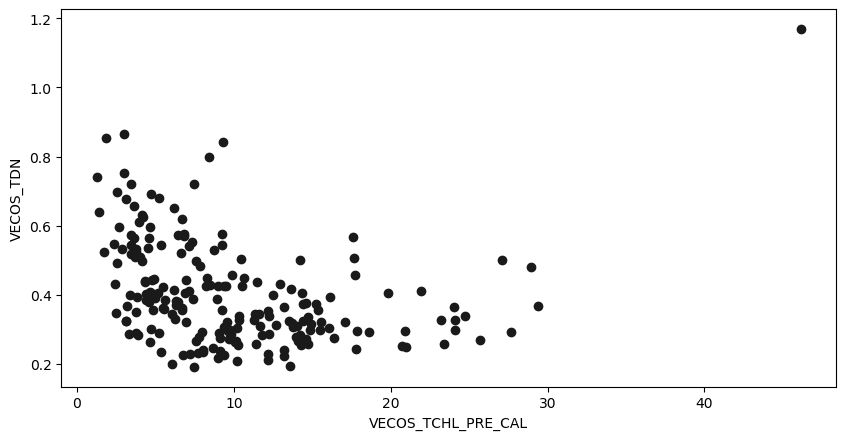

In [110]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_TDN,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_TDN')

Text(0, 0.5, 'VECOS_SALINITY')

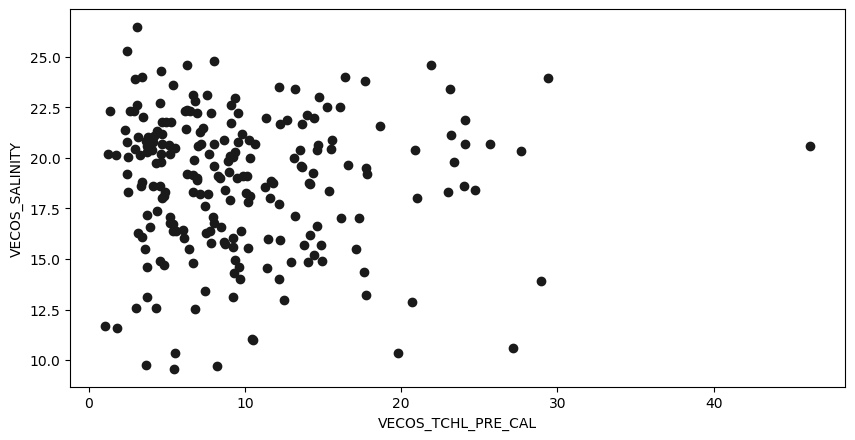

In [117]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_SAL,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_SALINITY')

Text(0, 0.5, 'VECOS_SECCHI')

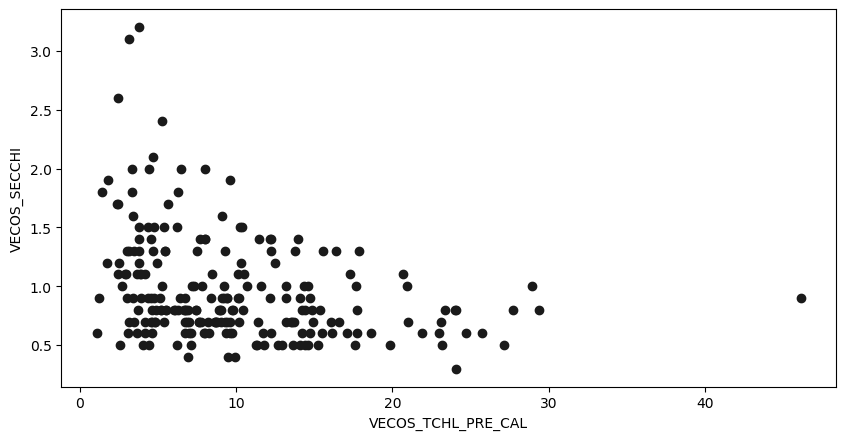

In [118]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_SECCHI,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_SECCHI')

Text(0, 0.5, 'VECOS_SIGMA-T')

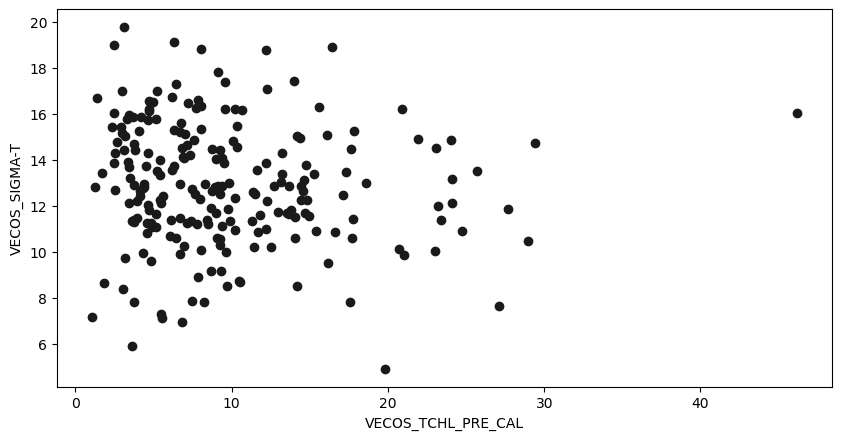

In [119]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_SIGT,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_SIGMA-T')

Text(0, 0.5, 'VECOS_TSS')

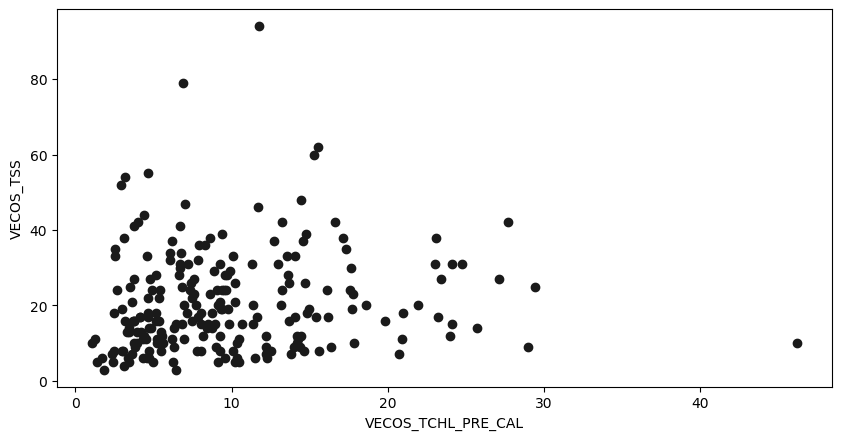

In [120]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_Laf_longterm_matchdays.VECOS_CHL,data_Laf_longterm_matchdays.VECOS_TSS,color='0.1')
ax3.set_xlabel('VECOS_TCHL_PRE_CAL')
ax3.set_ylabel('VECOS_TSS')

# DATA-FLOW transect data (2008 - 2015) - Lafayette R

In [24]:
data_dataFLOW_laf.columns

Index(['idCollectionEvent', 'PROJECT', 'SOURCE', 'SAMPLE_DATETIME',
       'SAMPLE_DATE', 'SAMPLE_MONTH', 'SAMPLE_DAY', 'SAMPLE_YEAR',
       'SAMPLE_TIME', 'CRUISE_TRACK', 'WATER_BODY', 'PRI_SEG', 'STATION',
       'SONDE', 'LATITUDE', 'LONGITUDE', 'DEPTH', 'LAYER', 'TOTAL_DEPTH',
       'TOTAL_DEPTH_UNITS', 'TOTAL_DEPTH_A', 'BOAT_SPEED', 'BOAT_SPEED_UNITS',
       'BOAT_SPEED_A', 'BATT', 'BATT_A', 'WTEMP', 'WTEMP_UNITS', 'WTEMP_A',
       'WTEMP_QUALIFIER', 'WTEMP_METHOD', 'SPCOND', 'SPCOND_UNITS', 'SPCOND_A',
       'SPCOND_QUALIFIER', 'SPCOND_METHOD', 'SALINITY', 'SALINITY_UNITS',
       'SALINITY_A', 'SALINITY_QUALIFIER', 'SALINITY_METHOD', 'DO_SAT',
       'DO_SAT_UNITS', 'DO_SAT_A', 'DO_SAT_QUALIFIER', 'DO_SAT_METHOD', 'DO',
       'DO_UNITS', 'DO_A', 'DO_QUALIFIER', 'DO_METHOD', 'PH', 'PH_UNITS',
       'PH_A', 'PH_QUALIFIER', 'PH_METHOD', 'TURB_NTU', 'TURB_NTU_UNITS',
       'TURB_NTU_A', 'TURB_NTU_QUALIFIER', 'TURB_NTU_METHOD', 'FLUOR',
       'FLUOR_UNITS', 'FLUOR_A', 'FLUOR

(5, 25)

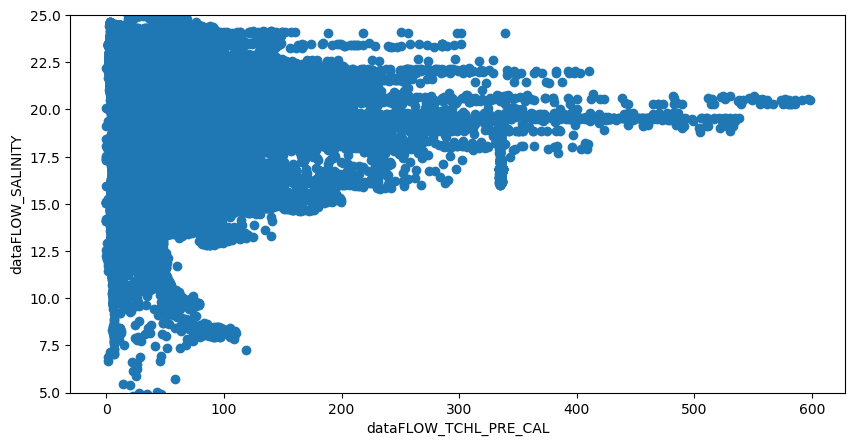

In [37]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_laf.TCHL_PRE_CAL,data_dataFLOW_laf.SALINITY)
ax3.set_xlabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_ylabel('dataFLOW_SALINITY')
ax3.set_ylim(5,25)

Text(0, 0.5, 'dataFLOW_WTEMP')

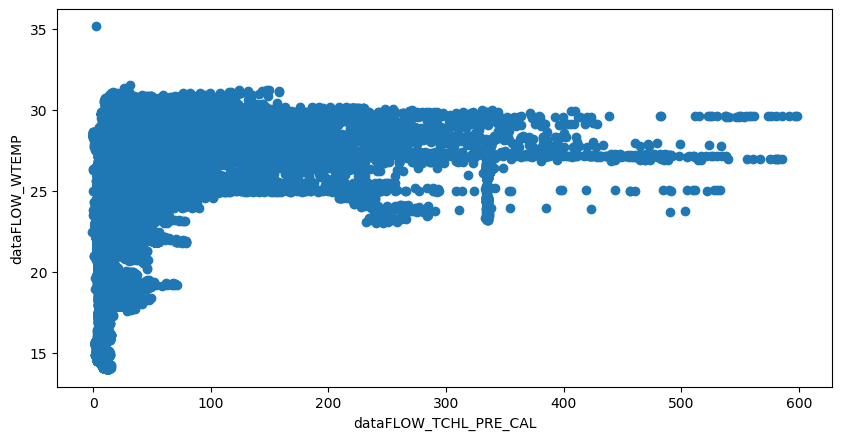

In [17]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_laf.TCHL_PRE_CAL,data_dataFLOW_laf.WTEMP)
ax3.set_xlabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_ylabel('dataFLOW_WTEMP')

Text(0.5, 0, 'Longitude')

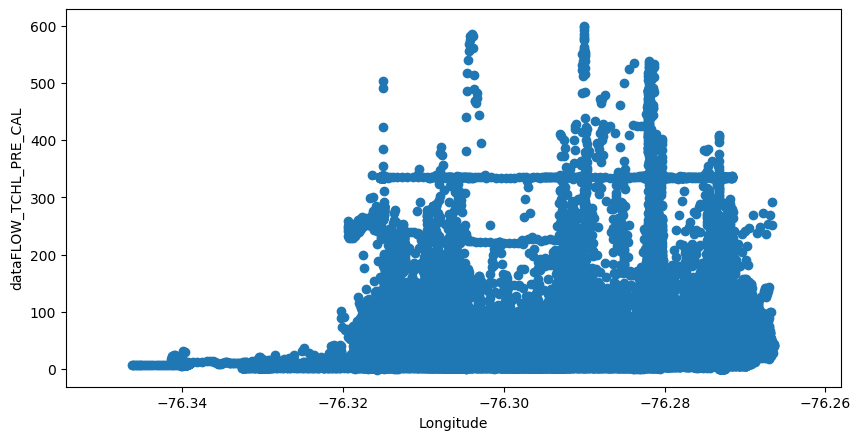

In [18]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_laf.LONGITUDE,data_dataFLOW_laf.TCHL_PRE_CAL)
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_xlabel('Longitude')

Text(0.5, 0, 'Date')

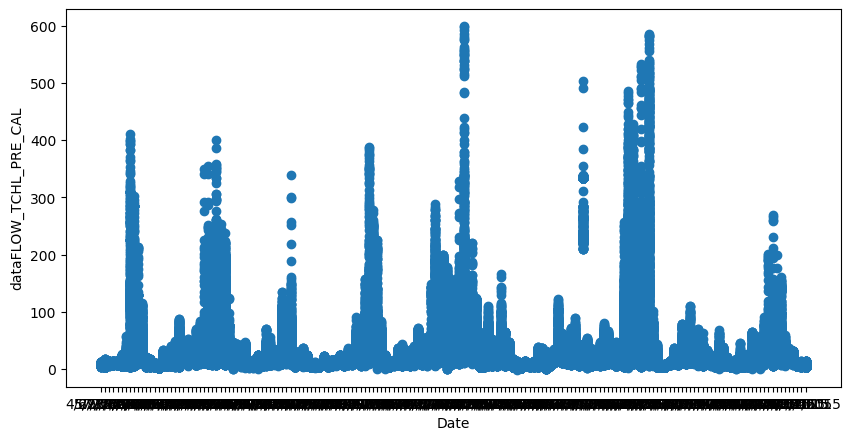

In [26]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE,data_dataFLOW_laf.TCHL_PRE_CAL)
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_xlabel('Date')

Text(0.5, 0, 'Date')

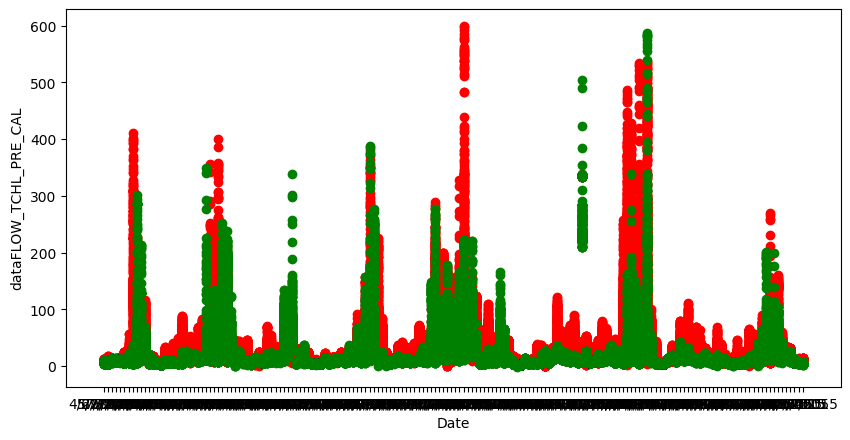

In [28]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[data_dataFLOW_laf.LONGITUDE>-76.30],data_dataFLOW_laf.TCHL_PRE_CAL[data_dataFLOW_laf.LONGITUDE>-76.30],color='r')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[data_dataFLOW_laf.LONGITUDE<-76.30],data_dataFLOW_laf.TCHL_PRE_CAL[data_dataFLOW_laf.LONGITUDE<-76.30],color='g')

ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_xlabel('Date')

Text(0.5, 0, 'Date')

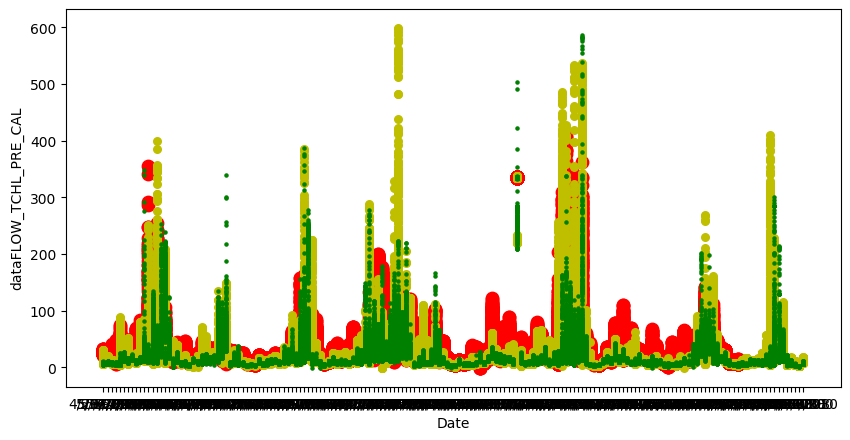

In [35]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[data_dataFLOW_laf.LONGITUDE>-76.28],data_dataFLOW_laf.TCHL_PRE_CAL[data_dataFLOW_laf.LONGITUDE>-76.28],color='r',s=80)
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)],color='y',s=30)
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[data_dataFLOW_laf.LONGITUDE<-76.30],data_dataFLOW_laf.TCHL_PRE_CAL[data_dataFLOW_laf.LONGITUDE<-76.30],color='g',s=5)

ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_xlabel('Date')

In [4]:
data_dataFLOW_laf.columns

Index(['idCollectionEvent', 'PROJECT', 'SOURCE', 'SAMPLE_DATETIME',
       'SAMPLE_DATE', 'SAMPLE_MONTH', 'SAMPLE_DAY', 'SAMPLE_YEAR',
       'SAMPLE_TIME', 'CRUISE_TRACK', 'WATER_BODY', 'PRI_SEG', 'STATION',
       'SONDE', 'LATITUDE', 'LONGITUDE', 'DEPTH', 'LAYER', 'TOTAL_DEPTH',
       'TOTAL_DEPTH_UNITS', 'TOTAL_DEPTH_A', 'BOAT_SPEED', 'BOAT_SPEED_UNITS',
       'BOAT_SPEED_A', 'BATT', 'BATT_A', 'WTEMP', 'WTEMP_UNITS', 'WTEMP_A',
       'WTEMP_QUALIFIER', 'WTEMP_METHOD', 'SPCOND', 'SPCOND_UNITS', 'SPCOND_A',
       'SPCOND_QUALIFIER', 'SPCOND_METHOD', 'SALINITY', 'SALINITY_UNITS',
       'SALINITY_A', 'SALINITY_QUALIFIER', 'SALINITY_METHOD', 'DO_SAT',
       'DO_SAT_UNITS', 'DO_SAT_A', 'DO_SAT_QUALIFIER', 'DO_SAT_METHOD', 'DO',
       'DO_UNITS', 'DO_A', 'DO_QUALIFIER', 'DO_METHOD', 'PH', 'PH_UNITS',
       'PH_A', 'PH_QUALIFIER', 'PH_METHOD', 'TURB_NTU', 'TURB_NTU_UNITS',
       'TURB_NTU_A', 'TURB_NTU_QUALIFIER', 'TURB_NTU_METHOD', 'FLUOR',
       'FLUOR_UNITS', 'FLUOR_A', 'FLUOR

In [10]:
tamlet=20

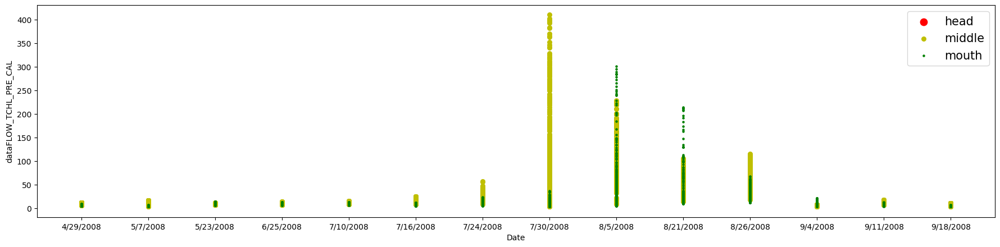

In [25]:
fig, (ax3)=plt.subplots(1,1,figsize=(22,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2008)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2008)],color='r',s=80,label='head')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2008)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2008)],color='y',s=30, label='middle')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2008)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2008)],color='g',s=5,label='mouth')

ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_xlabel('Date')
ax3.legend(loc="best",fontsize=15)

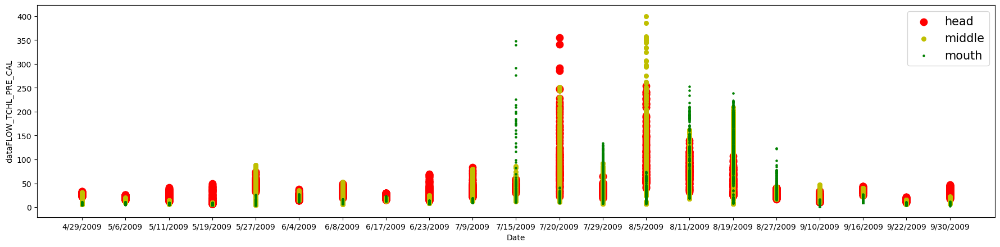

In [18]:
fig, (ax3)=plt.subplots(1,1,figsize=(22,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2009)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2009)],color='r',s=80,label='head')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2009)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2009)],color='y',s=30, label='middle')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2009)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2009)],color='g',s=5,label='mouth')

ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_xlabel('Date')
ax3.legend(loc="best",fontsize=15)

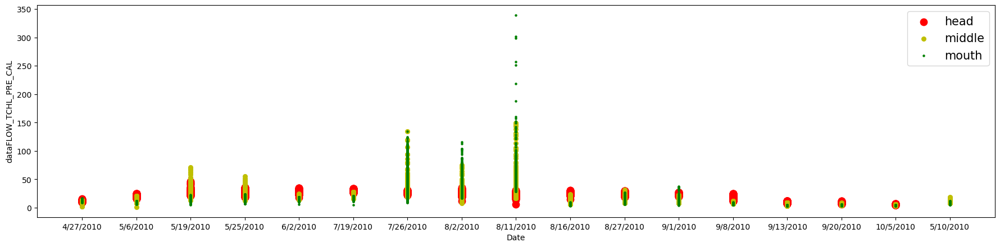

In [19]:
fig, (ax3)=plt.subplots(1,1,figsize=(22,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2010)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2010)],color='r',s=80,label='head')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2010)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2010)],color='y',s=30, label='middle')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2010)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2010)],color='g',s=5,label='mouth')

ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_xlabel('Date')
ax3.legend(loc="best",fontsize=15)

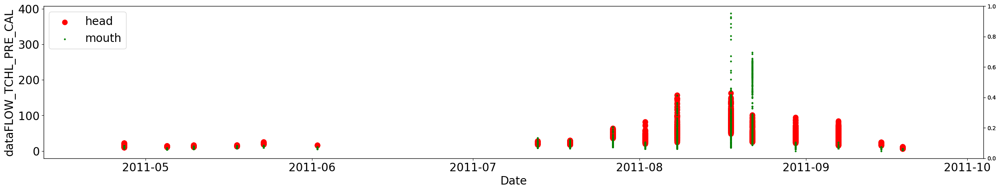

In [45]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()
ax300=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

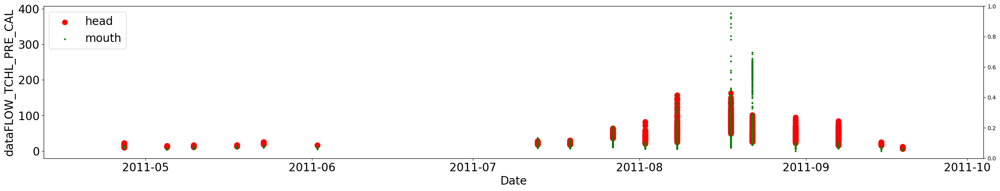

In [46]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

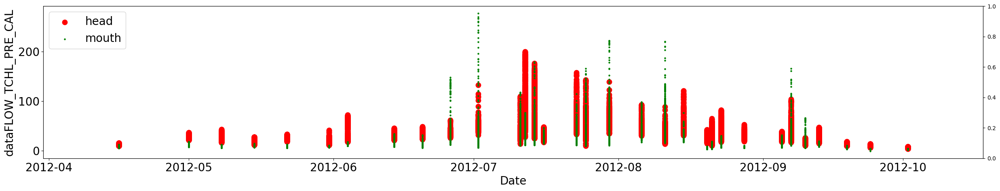

In [47]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

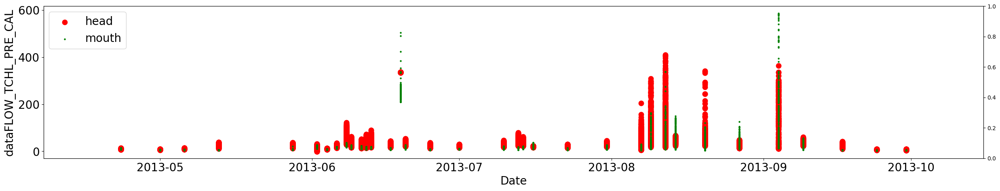

In [48]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

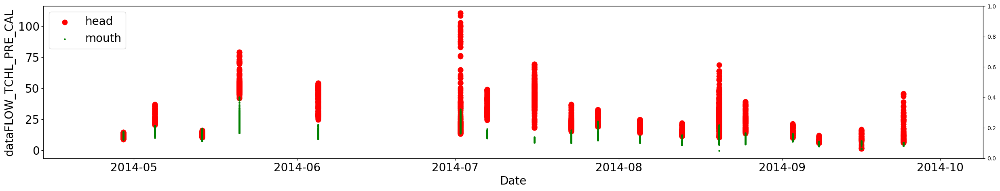

In [49]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

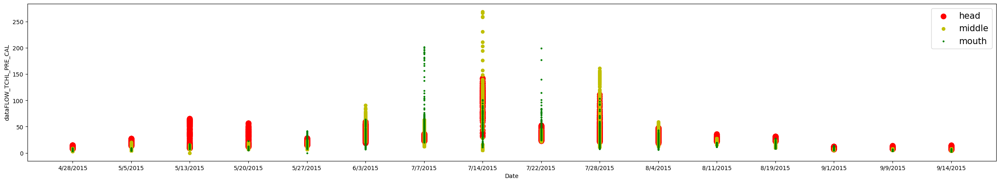

In [24]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2015)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2015)],color='r',s=80,label='head')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2015)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2015)],color='y',s=30, label='middle')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2015)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2015)],color='g',s=5,label='mouth')

ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_xlabel('Date')
ax3.legend(loc="best",fontsize=15)

In [27]:
TCHL_head_09avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2009)])
TCHL_mid_09avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2009)])
TCHL_mouth_09avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2009)])

TCHL_head_10avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2010)])
TCHL_mid_10avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2010)])
TCHL_mouth_10avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2010)])

TCHL_head_11avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)])
TCHL_mid_11avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)])
TCHL_mouth_11avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)])

TCHL_head_12avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)])
TCHL_mid_12avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)])
TCHL_mouth_12avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)])

TCHL_head_13avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)])
TCHL_mid_13avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)])
TCHL_mouth_13avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)])

TCHL_head_14avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)])
TCHL_mid_14avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)])
TCHL_mouth_14avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)])

TCHL_head_15avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2015)])
TCHL_mid_15avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2015)])
TCHL_mouth_15avg=np.mean(data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2015)])

TCHL_mouth_14avg

11.006458267216798

In [29]:
CTEs_TCHL_dataflow=[TCHL_head_09avg,TCHL_mid_09avg,TCHL_mouth_09avg,
                    TCHL_head_10avg,TCHL_mid_10avg,TCHL_mouth_10avg,
                   TCHL_head_11avg,TCHL_mid_11avg,TCHL_mouth_11avg,
                    TCHL_head_12avg,TCHL_mid_12avg,TCHL_mouth_12avg,
                   TCHL_head_13avg,TCHL_mid_13avg,TCHL_mouth_13avg,
                    TCHL_head_14avg,TCHL_mid_14avg,TCHL_mouth_14avg,
                   TCHL_head_15avg,TCHL_mid_15avg,TCHL_mouth_15avg]
# CTEs_TCHL_dataflow

In [30]:
sites_TCHL_dataflow=['','2009','',
                     '','2010','',
                     '','2011','',
                     '','2012','',
                     '','2013','',
                     '','2014','',
                     '','2015','']


x_pos_TCHL_dataflow=np.arange(len(sites_TCHL_dataflow))

[Text(0, 0, ''),
 Text(0, 0, '2009'),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, '2010'),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, '2011'),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, '2012'),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, '2013'),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, '2014'),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, '2015'),
 Text(0, 0, '')]

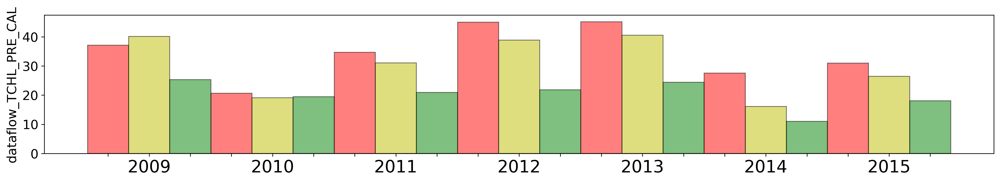

In [31]:
fig, ax = plt.subplots(1,1,figsize=(20,3),dpi=300)

bars=ax.bar(x_pos_TCHL_dataflow, CTEs_TCHL_dataflow, align='center', alpha=0.5, ecolor='black', capsize=5, color=['r','y','g'], edgecolor='black',width=1)

ax.set_ylabel('dataflow_TCHL_PRE_CAL',fontsize=15)
ax.tick_params(axis='y',labelcolor='k',labelsize=15)
ax.set_xticks(x_pos_TCHL_dataflow)
ax.set_xticklabels(sites_TCHL_dataflow, fontsize=20)

# DATA-FLOW transect data (2008 - 2015) - JAMES R

In [4]:
data_dataFLOW_Jam.columns

Index(['idCollectionEvent', 'PROJECT', 'SOURCE', 'SAMPLE_DATETIME',
       'CRUISE_TRACK', 'WATER_BODY', 'PRI_SEG', 'STATION', 'SONDE', 'LATITUDE',
       'LONGITUDE', 'DEPTH', 'LAYER', 'TOTAL_DEPTH', 'TOTAL_DEPTH_UNITS',
       'TOTAL_DEPTH_A', 'BOAT_SPEED', 'BOAT_SPEED_UNITS', 'BOAT_SPEED_A',
       'BATT', 'BATT_A', 'WTEMP', 'WTEMP_UNITS', 'WTEMP_A', 'WTEMP_QUALIFIER',
       'WTEMP_METHOD', 'SPCOND', 'SPCOND_UNITS', 'SPCOND_A',
       'SPCOND_QUALIFIER', 'SPCOND_METHOD', 'SALINITY', 'SALINITY_UNITS',
       'SALINITY_A', 'SALINITY_QUALIFIER', 'SALINITY_METHOD', 'DO_SAT',
       'DO_SAT_UNITS', 'DO_SAT_A', 'DO_SAT_QUALIFIER', 'DO_SAT_METHOD', 'DO',
       'DO_UNITS', 'DO_A', 'DO_QUALIFIER', 'DO_METHOD', 'PH', 'PH_UNITS',
       'PH_A', 'PH_QUALIFIER', 'PH_METHOD', 'TURB_NTU', 'TURB_NTU_UNITS',
       'TURB_NTU_A', 'TURB_NTU_QUALIFIER', 'TURB_NTU_METHOD', 'FLUOR',
       'FLUOR_UNITS', 'FLUOR_A', 'FLUOR_QUALIFIER', 'FLUOR_METHOD',
       'TCHL_PRE_CAL', 'TCHL_PRE_CAL_UNITS', 'TCHL_PR

(5, 25)

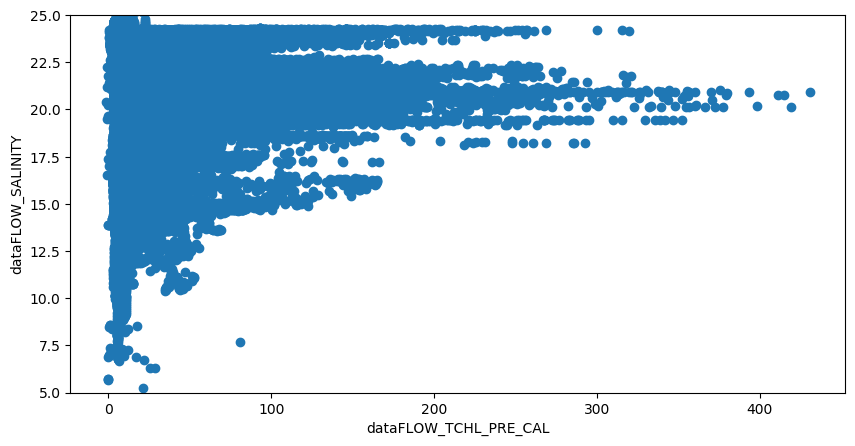

In [5]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_Jam.TCHL_PRE_CAL,data_dataFLOW_Jam.SALINITY)
ax3.set_xlabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_ylabel('dataFLOW_SALINITY')
ax3.set_ylim(5,25)

Text(0, 0.5, 'dataFLOW_WTEMP')

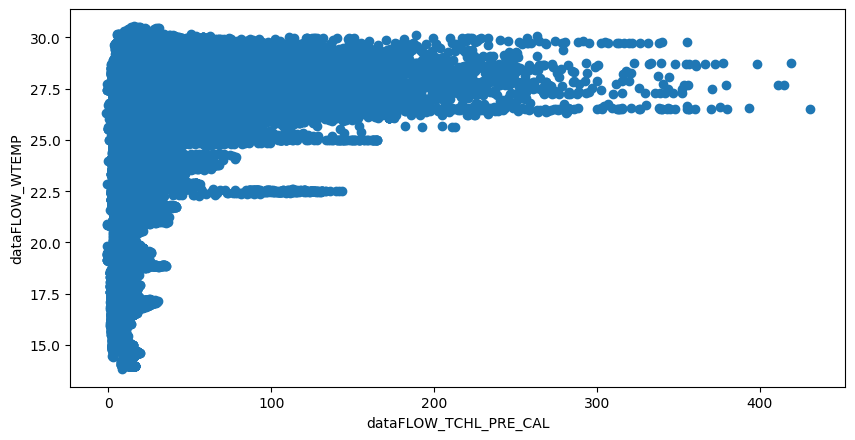

In [6]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_Jam.TCHL_PRE_CAL,data_dataFLOW_Jam.WTEMP)
ax3.set_xlabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_ylabel('dataFLOW_WTEMP')

Text(0.5, 0, 'Latitude')

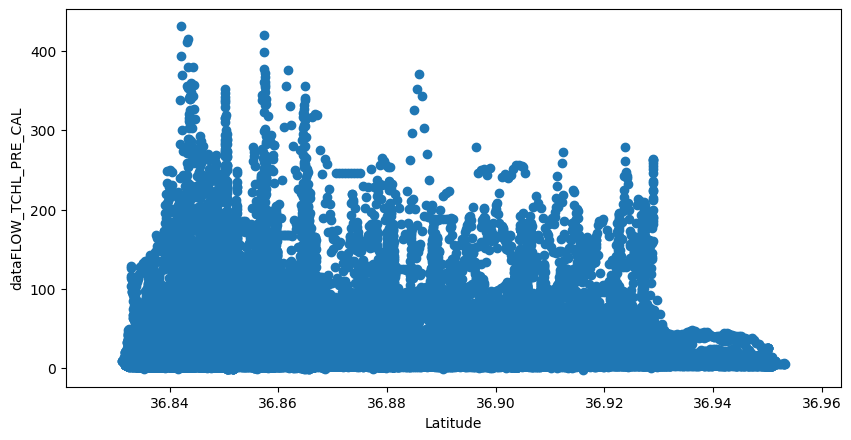

In [8]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_Jam.LATITUDE,data_dataFLOW_Jam.TCHL_PRE_CAL)
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_xlabel('Latitude')

Text(0.5, 0, 'Date')

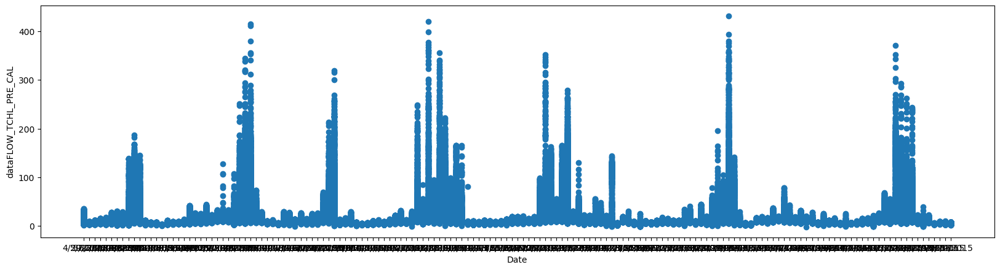

In [12]:
fig, (ax3)=plt.subplots(1,1,figsize=(20,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_Jam.SAMPLE_DATE,data_dataFLOW_Jam.TCHL_PRE_CAL)
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_xlabel('Date')

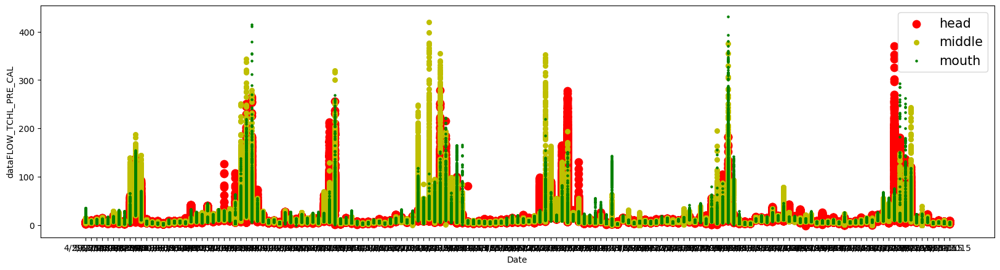

In [15]:
fig, (ax3)=plt.subplots(1,1,figsize=(20,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_Jam.SAMPLE_DATE[data_dataFLOW_Jam.LATITUDE>36.87],data_dataFLOW_Jam.TCHL_PRE_CAL[data_dataFLOW_Jam.LATITUDE>36.87],color='r',s=80,label='head')
ax3.scatter(data_dataFLOW_Jam.SAMPLE_DATE[(data_dataFLOW_Jam.LATITUDE<36.87)&(data_dataFLOW_Jam.LATITUDE>36.85)],data_dataFLOW_Jam.TCHL_PRE_CAL[(data_dataFLOW_Jam.LATITUDE<36.87)&(data_dataFLOW_Jam.LATITUDE>36.85)],color='y',s=30,label='middle')
ax3.scatter(data_dataFLOW_Jam.SAMPLE_DATE[data_dataFLOW_Jam.LATITUDE<36.85],data_dataFLOW_Jam.TCHL_PRE_CAL[data_dataFLOW_Jam.LATITUDE<36.85],color='g',s=5,label='mouth')

ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_xlabel('Date')
ax3.legend(loc="best",fontsize=15)

# Cell counts from daily summer sampling at the Lafayette stations 
# (NYCC and Ashland Circle)
# 2012 to 2019

In [51]:
data_cellcount_dataflow2.columns

Index(['Total_serial_numb', 'Year', 'Month', 'Day', 'Week', 'Season',
       'Analyst', 'ODUnumb', 'HRSD_numb', 'Segment', 'Station', 'Date', 'lat',
       'long', 'Depth', 'Time', 'Extracted_Chl', 'New_YSI', 'YSI_Chla',
       'Annual_Corrected_Chla', 'Annual_Chla_Bins', 'Species_code', 'Taxa',
       'Taxa2', 'Phyla', 'PhyNum', 'Density_cells_ml', 'biomas_pgC_cell',
       'biomas_pgC_ml', 'biomas_ugC_L', 'Total_abundance_cells_ml',
       'Total_biomas_ugC_L', 'PERCNT_biomass', 'Chlorophytes_biomass_ugC_L',
       'Cryptomonads_biomass_ugC_L', 'Cyanobacteria_biomass_ugC_L',
       'Diatoms_biomass_ugC_L', 'Dinoflagellates_biomass_ugC_L',
       'Eugelenoids_biomass_ugC_L', 'Prasinophytes_biomass_ugC_L',
       'Raphidophytes_biomass_ugC_L', 'Silicoflagellates_biomass_ugC_L',
       'PERCNT_Chlorophytes_biomass', 'PERCNT_Cryptomonads_biomass',
       'PERCNT_Cyanobacteria_biomass', 'PERCNT_Diatoms_biomass',
       'PERCNT_Dinoflagellates_biomass', 'PERCNT_Eugelenoids_biomass',
      

In [44]:
data_cellcount_dataflow2.Station.unique()

array(['AC', 'NYCC'], dtype=object)

Text(0.5, 0, 'Diatoms biomass (ugC/L)')

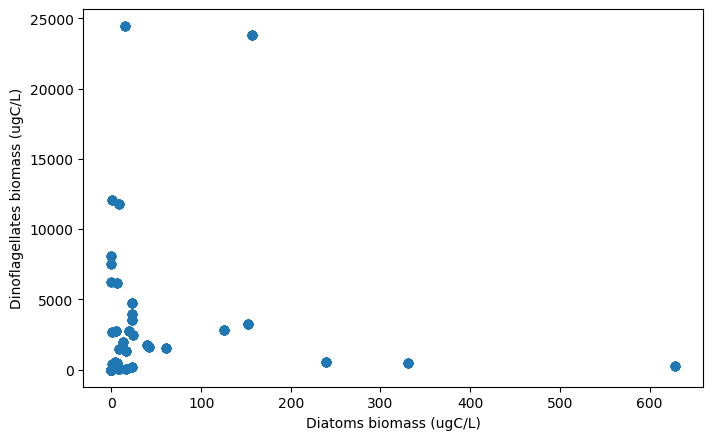

In [49]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(data_cellcount_dataflow2.Diatoms_biomass_ugC_L,data_cellcount_dataflow2.Dinoflagellates_biomass_ugC_L)
ax3.set_ylabel('Dinoflagellates biomass (ugC/L)')
ax3.set_xlabel('Diatoms biomass (ugC/L)')

Text(0.5, 0, 'Date (2012 to 2018)')

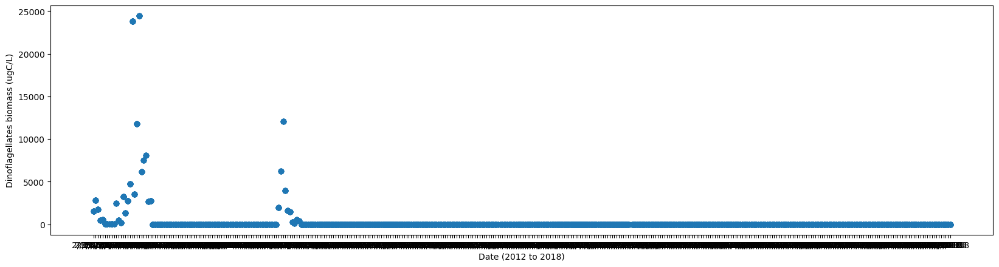

In [43]:
fig, (ax3)=plt.subplots(1,1,figsize=(20,5),dpi=100,sharex='all')
ax3.scatter(data_cellcount_dataflow2.Date,data_cellcount_dataflow2.Dinoflagellates_biomass_ugC_L)
ax3.set_ylabel('Dinoflagellates biomass (ugC/L)')
ax3.set_xlabel('Date (2012 to 2018)')

Text(0.5, 0, 'Date (2012 to 2018)')

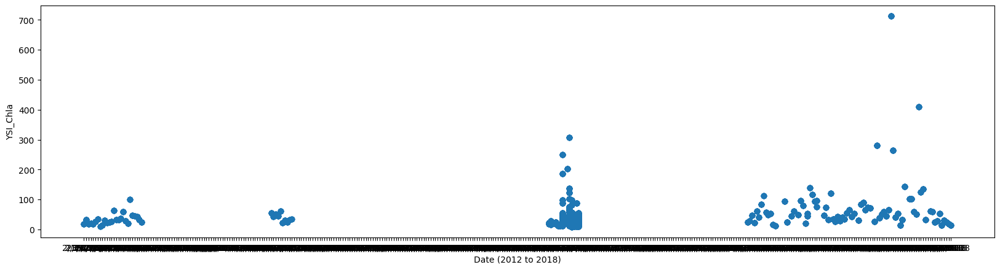

In [39]:
fig, (ax3)=plt.subplots(1,1,figsize=(20,5),dpi=100,sharex='all')
ax3.scatter(data_cellcount_dataflow2.Date,data_cellcount_dataflow2.YSI_Chla)
ax3.set_ylabel('YSI_Chla')
ax3.set_xlabel('Date')

Text(0.5, 0, 'Dinoflagellates biomass (ugC/L)')

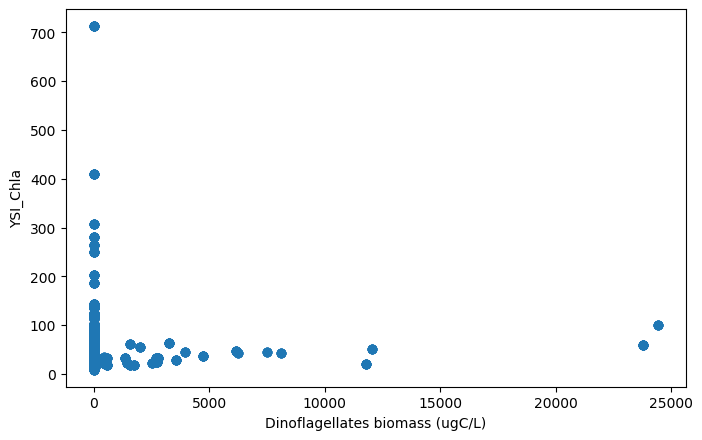

In [54]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(data_cellcount_dataflow2.Dinoflagellates_biomass_ugC_L,data_cellcount_dataflow2.YSI_Chla)
ax3.set_ylabel('YSI_Chla')
ax3.set_xlabel('Dinoflagellates biomass (ugC/L)')

Text(0.5, 0, 'Dinoflagellates biomass (ugC/L)')

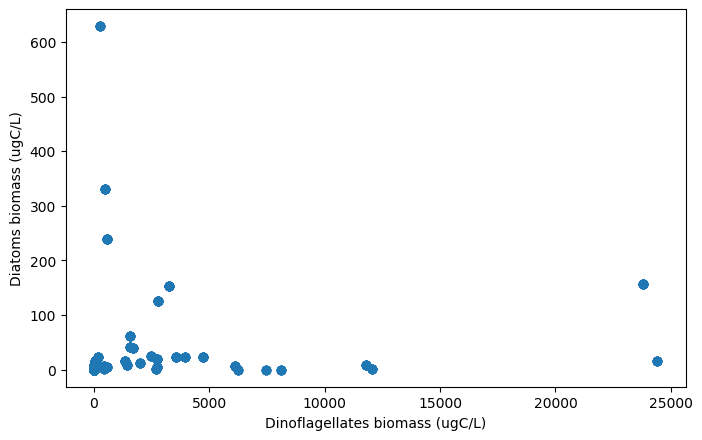

In [55]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(data_cellcount_dataflow2.Dinoflagellates_biomass_ugC_L,data_cellcount_dataflow2.Diatoms_biomass_ugC_L)
ax3.set_ylabel('Diatoms biomass (ugC/L)')
ax3.set_xlabel('Dinoflagellates biomass (ugC/L)')

Text(0.5, 0, '% Dinoflagellates of Tot biomass')

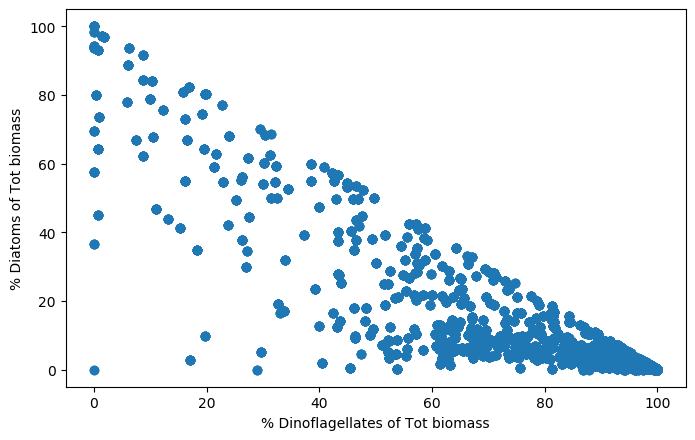

In [60]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(data_cellcount_dataflow2.PERCNT_Dinoflagellates_biomass,data_cellcount_dataflow2.PERCNT_Diatoms_biomass)
ax3.set_ylabel('% Diatoms of Tot biomass')
ax3.set_xlabel('% Dinoflagellates of Tot biomass')

Text(0.5, 0, 'Date')

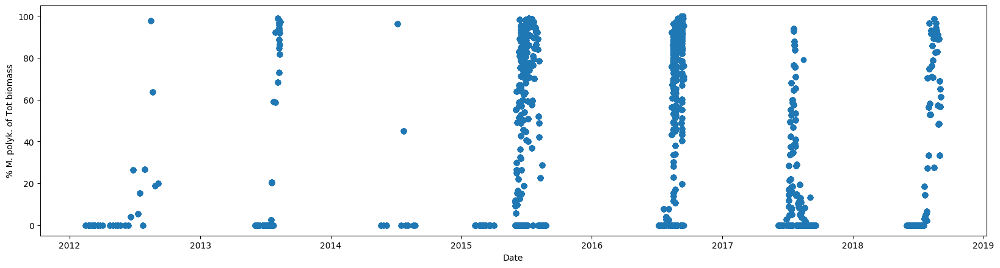

In [65]:
fig, (ax3)=plt.subplots(1,1,figsize=(20,5),dpi=100,sharex='all')
ax3.scatter(pd.to_datetime(data_cellcount_dataflow2.Date),data_cellcount_dataflow2.C_poly_PERCENT_biomass)
ax3.set_ylabel('% M. polyk. of Tot biomass')
ax3.set_xlabel('Date')

# Cell counts from dataFLOW transects at the JAMES and Lafayette Rivers

In [5]:
data_cellcount_dataflow.columns

Index(['TotalSerial', 'Year', 'Season', 'Month', 'weeknum', 'AnnualODUSerial',
       'Segment', 'HRSD_NUM', 'Date', 'Lat', 'Long', 'Total_Abunance_cells_ml',
       'Total_biomass_ugC_L', 'Chlorophytes_biomass_ugC_L',
       'Cryptomonads_biomass_ugC_L', 'Cyanobacteria_biomass_ugC_L',
       'Diatoms_biomass_ugC_L', 'Dinoflagellates_biomass_ugC_L',
       'Eugelenoids_biomass_ugC_L', 'Raphidophytes_biomass_ugC_L',
       'Silicoflagellates_biomass_ugC_L', 'Species_Richness',
       'H___Shannon_Diversity_index_', 'J___Pielou_evennes_index_',
       'Cochlodinium_cells_ml', 'Heterocapsa_cells_ml', 'Alexandrium_cells_ml',
       'Prorocentrum_minimum_cells_ml', 'Cochlodinium_present',
       'Cochlodinium_1000_cells_ml', 'Cochlodinium_10000_cells_ml',
       'Cochlodinium_50_PERCNT_biomass',
       'Cochlodinium_PERCNT_of_total_biomass ', 'diatoms_and_dinos',
       'HRSD_NUM.1', 'YSICHLA_RAW_ug_L', 'CORRECTED_CHLA_ug_L', 'CP_GT_1000',
       'CHLA_BIN'],
      dtype='object')

Text(0.5, 0, '% of M.polik of Tot biomass')

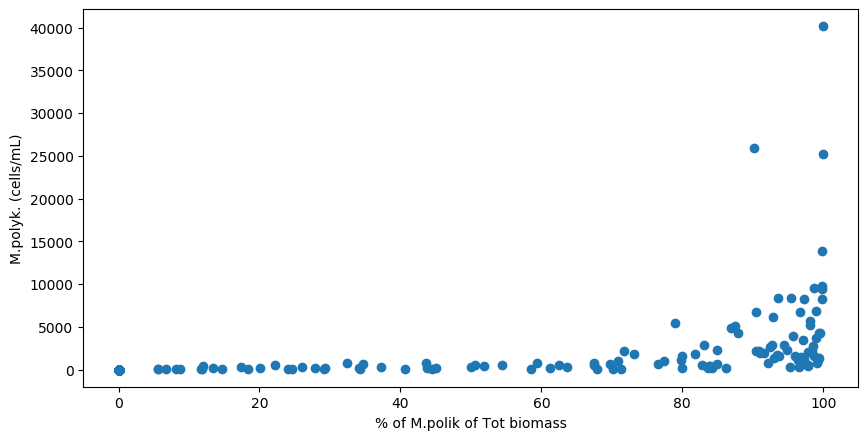

In [5]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[data_cellcount_dataflow.Segment=='LAFMH'],data_cellcount_dataflow.Cochlodinium_cells_ml[data_cellcount_dataflow.Segment=='LAFMH'])
ax3.set_ylabel('M.polyk. (cells/mL)')
ax3.set_xlabel('% of M.polik of Tot biomass')

Text(0.5, 0, 'CORRECTED YSI-CHLA (ug/L)')

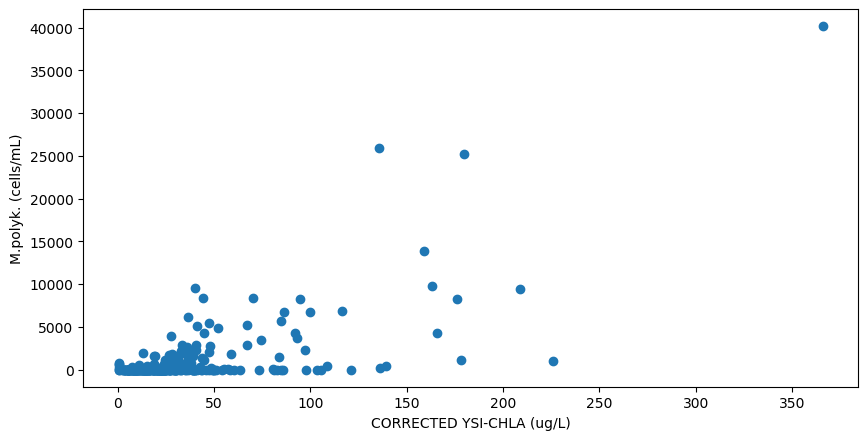

In [6]:
fig, (ax3)=plt.subplots(1,1,figsize=(10,5),dpi=100,sharex='all')
ax3.scatter(data_cellcount_dataflow.CORRECTED_CHLA_ug_L[data_cellcount_dataflow.Segment=='LAFMH'],data_cellcount_dataflow.Cochlodinium_cells_ml[data_cellcount_dataflow.Segment=='LAFMH'])
ax3.set_ylabel('M.polyk. (cells/mL)')
ax3.set_xlabel('CORRECTED YSI-CHLA (ug/L)')

Text(0.5, 0, 'Date (2011 to 2018)')

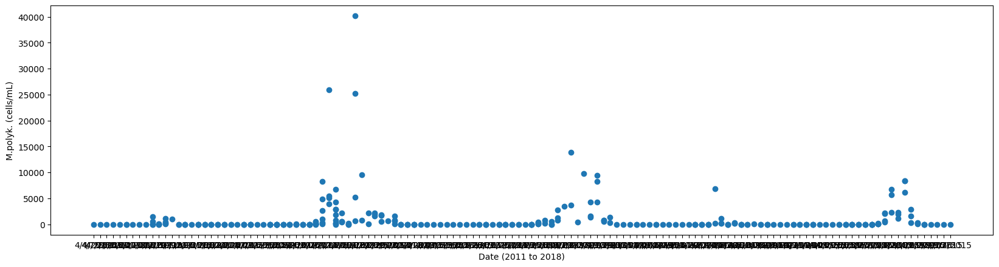

In [18]:
fig, (ax3)=plt.subplots(1,1,figsize=(20,5),dpi=100,sharex='all')
ax3.scatter(data_cellcount_dataflow.Date[data_cellcount_dataflow.Segment=='LAFMH'],data_cellcount_dataflow.Cochlodinium_cells_ml[data_cellcount_dataflow.Segment=='LAFMH'])
ax3.set_ylabel('M.polyk. (cells/mL)')
ax3.set_xlabel('Date (2011 to 2018)')

Text(0.5, 0, 'Date (2014)')

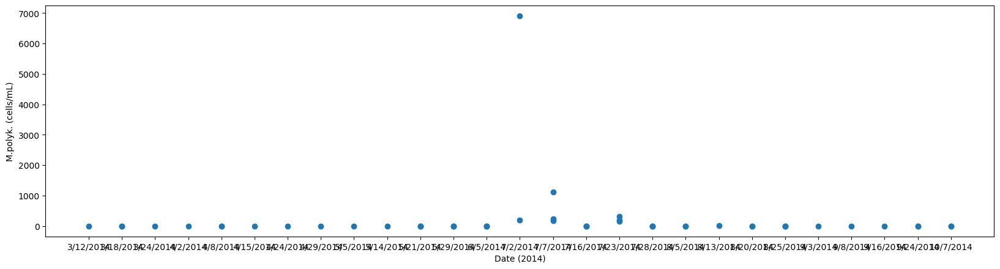

In [7]:
fig, (ax3)=plt.subplots(1,1,figsize=(20,5),dpi=100,sharex='all')
ax3.scatter(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2014)],data_cellcount_dataflow.Cochlodinium_cells_ml[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2014)])
ax3.set_ylabel('M.polyk. (cells/mL)')
ax3.set_xlabel('Date (2014)')

# Combined dataFLOW transects (JAMES + Lafayette)

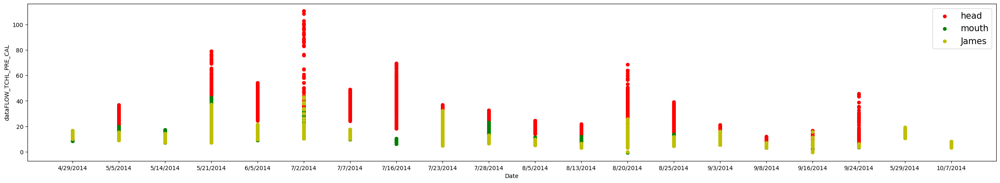

In [29]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)],color='r',s=30,label='head')
# ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.28)&(data_dataFLOW_laf.LONGITUDE>-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)],color='y',s=30, label='middle')
ax3.scatter(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)],data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)],color='g',s=30,label='mouth')
ax3.scatter(data_dataFLOW_Jam.SAMPLE_DATE[(data_dataFLOW_Jam.LATITUDE<36.91)&(data_dataFLOW_Jam.LATITUDE>36.87)&(data_dataFLOW_Jam.SAMPLE_YEAR==2014)],data_dataFLOW_Jam.TCHL_PRE_CAL[(data_dataFLOW_Jam.LATITUDE<36.91)&(data_dataFLOW_Jam.LATITUDE>36.87)&(data_dataFLOW_Jam.SAMPLE_YEAR==2014)],color='y',s=30, label='James')


ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL')
ax3.set_xlabel('Date')
ax3.legend(loc="best",fontsize=15)

# Combined dataFlow YSI and dataFLOW cellcounts data - Lafayette R

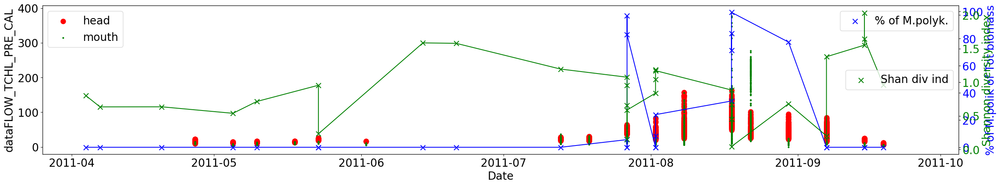

In [34]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()
ax300=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2011)]),data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2011)],label='% of M.polyk.',marker='x',s=80,color='b')
ax30.plot(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2011)]),data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2011)],color='b')
ax30.set_ylabel('% of M.polik of Tot biomass',color='b',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='b',labelsize=tamlet)

ax300.scatter(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2011)]),data_cellcount_dataflow.H___Shannon_Diversity_index_[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2011)],label='Shan div ind',marker='x',s=80,color='g')
ax300.plot(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2011)]),data_cellcount_dataflow.H___Shannon_Diversity_index_[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2011)],color='g')
ax300.set_ylabel('Shannon diversity index',color='g',fontsize=tamlet)
ax300.legend(loc="center right",fontsize=tamlet)
ax300.tick_params(axis='y',labelcolor='g',labelsize=tamlet)

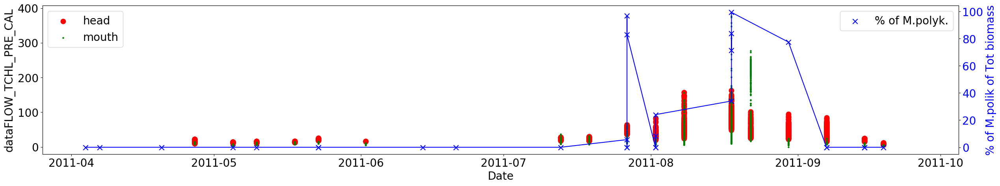

In [35]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2011)]),data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2011)],label='% of M.polyk.',marker='x',s=80,color='b')
ax30.plot(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2011)]),data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2011)],color='b')
ax30.set_ylabel('% of M.polik of Tot biomass',color='b',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='b',labelsize=tamlet)

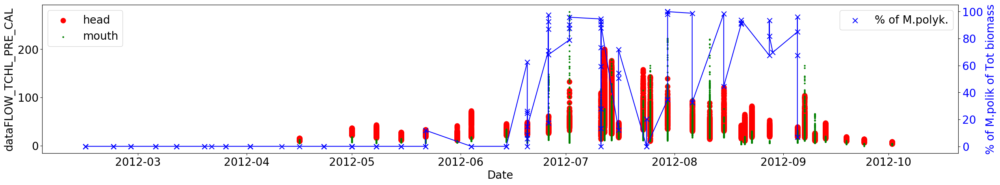

In [36]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2012)]),data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2012)],label='% of M.polyk.',marker='x',s=80,color='b')
ax30.plot(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2012)]),data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2012)],color='b')
ax30.set_ylabel('% of M.polik of Tot biomass',color='b',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='b',labelsize=tamlet)

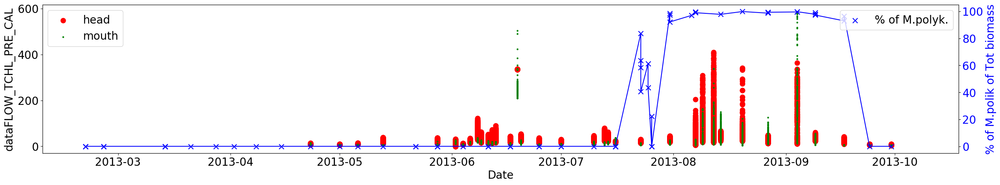

In [37]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2013)]),data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2013)],label='% of M.polyk.',marker='x',s=80,color='b')
ax30.plot(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2013)]),data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2013)],color='b')
ax30.set_ylabel('% of M.polik of Tot biomass',color='b',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='b',labelsize=tamlet)

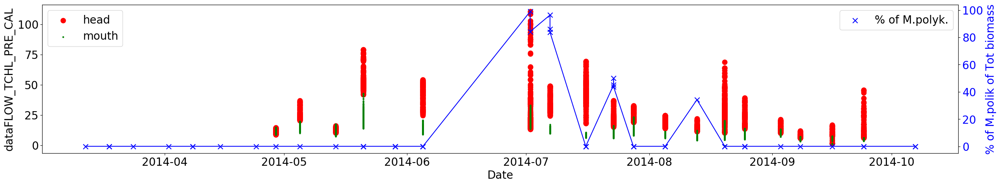

In [38]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2014)]),data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2014)],label='% of M.polyk.',marker='x',s=80,color='b')
ax30.plot(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2014)]),data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2014)],color='b')
ax30.set_ylabel('% of M.polik of Tot biomass',color='b',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='b',labelsize=tamlet)

# Combined dataFlow YSI and dailysampling cellcounts data - Lafayette R

In [50]:
data_cellcount_dataflow2.columns

Index(['Total_serial_numb', 'Year', 'Month', 'Day', 'Week', 'Season',
       'Analyst', 'ODUnumb', 'HRSD_numb', 'Segment', 'Station', 'Date', 'lat',
       'long', 'Depth', 'Time', 'Extracted_Chl', 'New_YSI', 'YSI_Chla',
       'Annual_Corrected_Chla', 'Annual_Chla_Bins', 'Species_code', 'Taxa',
       'Taxa2', 'Phyla', 'PhyNum', 'Density_cells_ml', 'biomas_pgC_cell',
       'biomas_pgC_ml', 'biomas_ugC_L', 'Total_abundance_cells_ml',
       'Total_biomas_ugC_L', 'PERCNT_biomass', 'Chlorophytes_biomass_ugC_L',
       'Cryptomonads_biomass_ugC_L', 'Cyanobacteria_biomass_ugC_L',
       'Diatoms_biomass_ugC_L', 'Dinoflagellates_biomass_ugC_L',
       'Eugelenoids_biomass_ugC_L', 'Prasinophytes_biomass_ugC_L',
       'Raphidophytes_biomass_ugC_L', 'Silicoflagellates_biomass_ugC_L',
       'PERCNT_Chlorophytes_biomass', 'PERCNT_Cryptomonads_biomass',
       'PERCNT_Cyanobacteria_biomass', 'PERCNT_Diatoms_biomass',
       'PERCNT_Dinoflagellates_biomass', 'PERCNT_Eugelenoids_biomass',
      

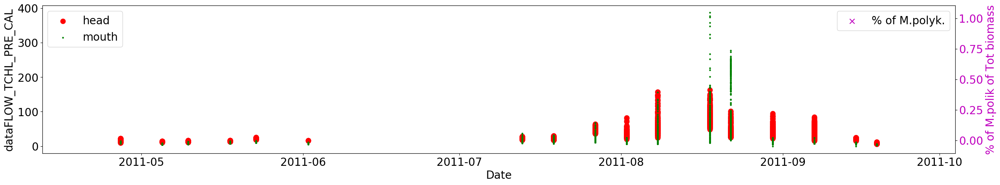

In [71]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2011)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2011]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2011],label='% of M.polyk.',marker='x',s=80,color='m')
ax30.plot(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2011]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2011],color='m')
ax30.set_ylabel('% of M.polik of Tot biomass',color='m',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='m',labelsize=tamlet)

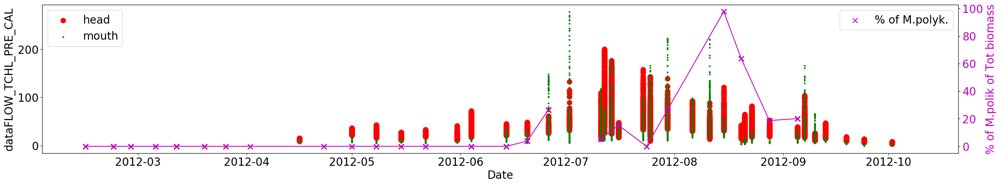

In [70]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2012)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2012]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2012],label='% of M.polyk.',marker='x',s=80,color='m')
ax30.plot(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2012]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2012],color='m')
ax30.set_ylabel('% of M.polik of Tot biomass',color='m',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='m',labelsize=tamlet)

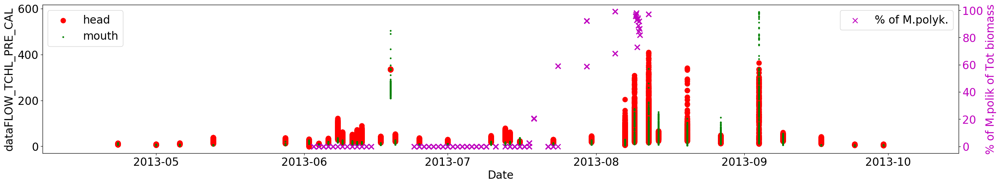

In [73]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2013)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2013],label='% of M.polyk.',marker='x',s=80,color='m')
# ax30.plot(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2013],color='m')
ax30.set_ylabel('% of M.polik of Tot biomass',color='m',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='m',labelsize=tamlet)

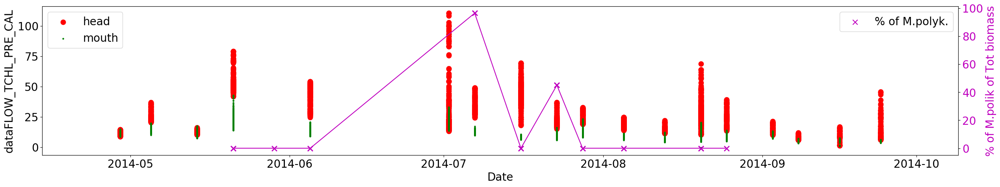

In [74]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2014)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2014]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2014],label='% of M.polyk.',marker='x',s=80,color='m')
ax30.plot(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2014]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2014],color='m')
ax30.set_ylabel('% of M.polik of Tot biomass',color='m',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='m',labelsize=tamlet)

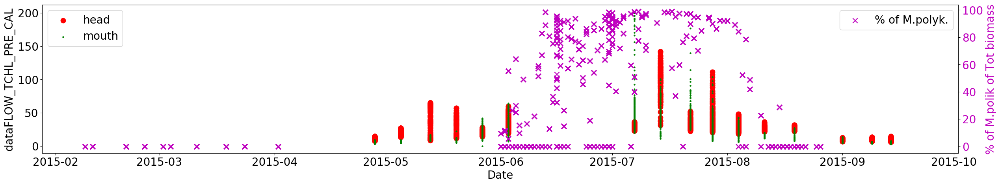

In [76]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2015)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2015)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2015)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2015)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2015]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2015],label='% of M.polyk.',marker='x',s=80,color='m')
# ax30.plot(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2015]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2015],color='m')
ax30.set_ylabel('% of M.polik of Tot biomass',color='m',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='m',labelsize=tamlet)

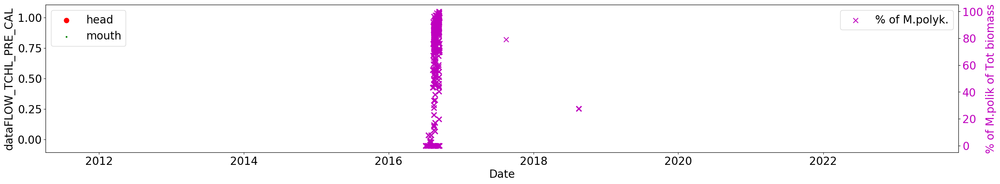

In [91]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2016)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE>-76.28)&(data_dataFLOW_laf.SAMPLE_YEAR==2016)],color='r',s=80,label='head')
ax3.scatter(pd.to_datetime(data_dataFLOW_laf.SAMPLE_DATE[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2016)]),data_dataFLOW_laf.TCHL_PRE_CAL[(data_dataFLOW_laf.LONGITUDE<-76.30)&(data_dataFLOW_laf.SAMPLE_YEAR==2016)],color='g',s=5,label='mouth')
ax3.set_ylabel('dataFLOW_TCHL_PRE_CAL',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2016]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2016],label='% of M.polyk.',marker='x',s=80,color='m')
# ax30.plot(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2016]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2016],color='m')
ax30.set_ylabel('% of M.polik of Tot biomass',color='m',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='m',labelsize=tamlet)

# Nutrient data from daily sampling campaign (2012 - 2015) 

In [129]:
data_NYCC_NUTS.columns

Index(['Date', 'Month', 'Day', 'Year', 'Depth', 'NH4_uM', 'NH4_std', 'NO2_uM',
       'NO2_std', 'Urea_uM', 'Urea_std', 'NO32_uM', 'NO32_std', 'NO3_uM',
       'NO3_std', 'DIN_uM', 'NID_std', 'PO4_uM', 'PO4_std', 'DIN_PO4_ratio',
       'TDN_uM', 'TDN_uM.1'],
      dtype='object')

(0, 50)

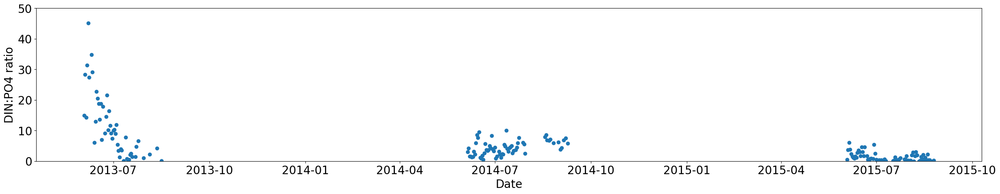

In [131]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.DIN_PO4_ratio)
ax3.set_ylabel('DIN:PO4 ratio',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
# ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.set_ylim(0,50)

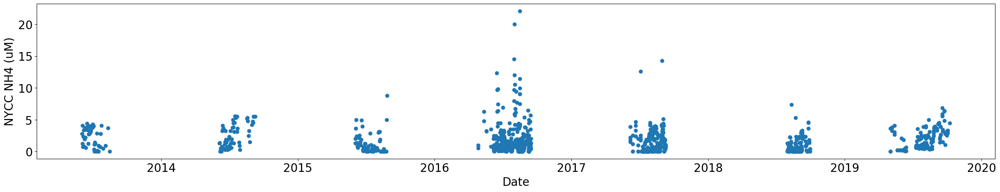

In [78]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NH4_uM)
ax3.set_ylabel('NYCC NH4 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
# ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

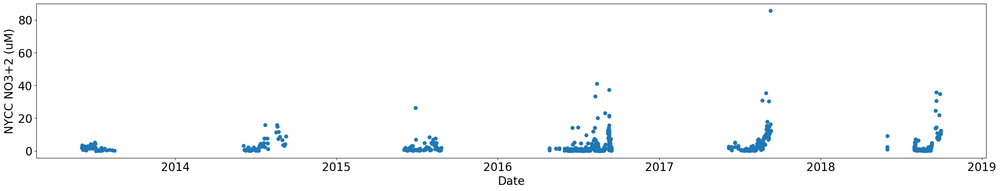

In [127]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM)
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
# ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

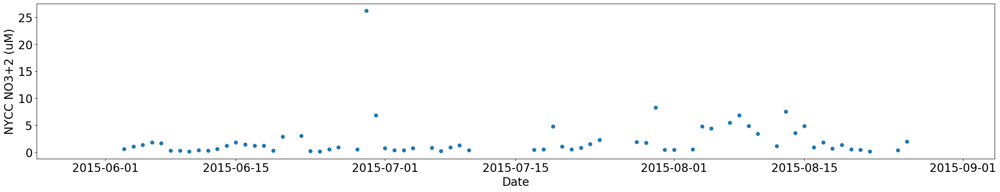

In [93]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2015]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2015])
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
# ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

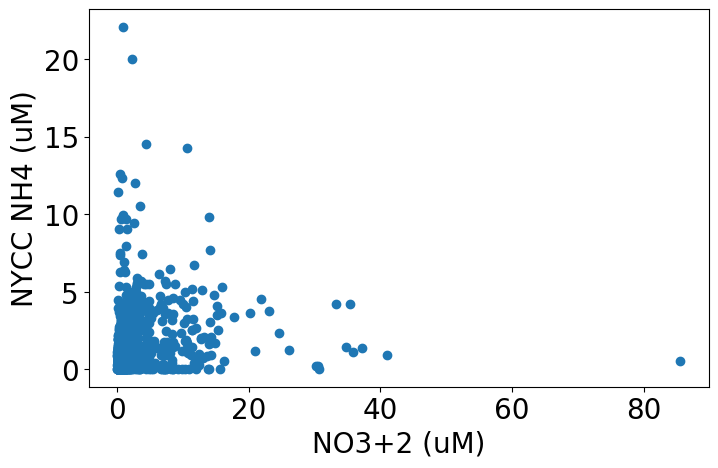

In [79]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(data_NYCC_NUTS.NO32_uM,data_NYCC_NUTS.NH4_uM)
ax3.set_ylabel('NYCC NH4 (uM)',fontsize=tamlet)
ax3.set_xlabel('NO3+2 (uM)',fontsize=tamlet)
# ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

# Combined: 
# Nutrient data from daily sampling campaign (2012 - 2015); and
# Cell counts also from daily sampling campaign

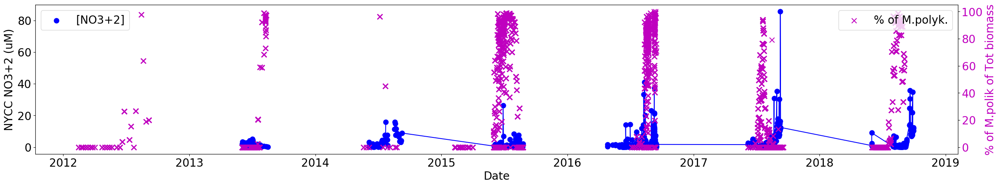

In [105]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date),data_cellcount_dataflow2.C_poly_PERCENT_biomass,label='% of M.polyk.',marker='x',s=80,color='m')
ax30.set_ylabel('% of M.polik of Tot biomass',color='m',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='m',labelsize=tamlet)

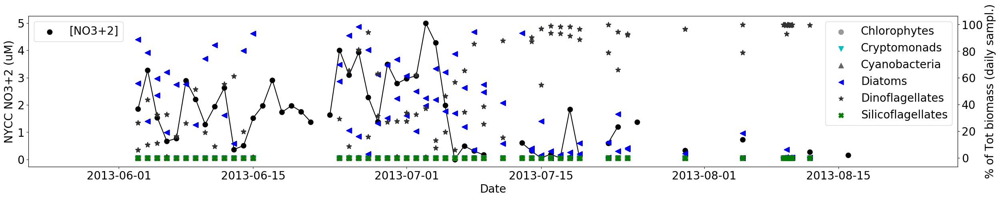

In [264]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2013]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2013],color='k',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2013]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2013],color='k')

ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Chlorophytes_biomass[data_cellcount_dataflow2.Year==2013],label='Chlorophytes',marker='o',s=80,color='0.6')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Cryptomonads_biomass[data_cellcount_dataflow2.Year==2013],label='Cryptomonads',marker='v',s=80,color='c')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Cyanobacteria_biomass[data_cellcount_dataflow2.Year==2013],label='Cyanobacteria',marker='^',s=80,color='0.4')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Diatoms_biomass[data_cellcount_dataflow2.Year==2013],label='Diatoms',marker='<',s=80,color='b')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Dinoflagellates_biomass[data_cellcount_dataflow2.Year==2013],label='Dinoflagellates',marker='*',s=80,color='0.2')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Silicoflagellates_biomass[data_cellcount_dataflow2.Year==2013],label='Silicoflagellates',marker='X',s=80,color='g')

ax30.set_ylabel('% of Tot biomass (daily sampl.)',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

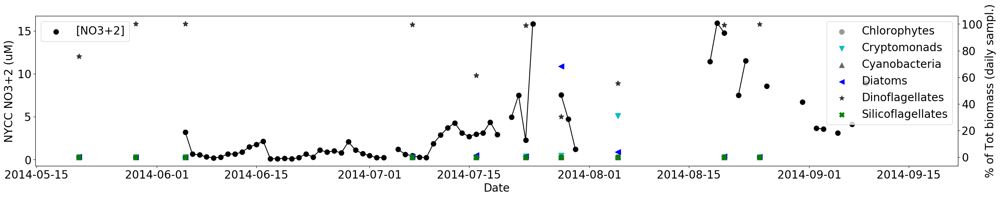

In [265]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2014]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2014],color='k',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2014]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2014],color='k')

ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2014]),data_cellcount_dataflow2.PERCNT_Chlorophytes_biomass[data_cellcount_dataflow2.Year==2014],label='Chlorophytes',marker='o',s=80,color='0.6')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2014]),data_cellcount_dataflow2.PERCNT_Cryptomonads_biomass[data_cellcount_dataflow2.Year==2014],label='Cryptomonads',marker='v',s=80,color='c')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2014]),data_cellcount_dataflow2.PERCNT_Cyanobacteria_biomass[data_cellcount_dataflow2.Year==2014],label='Cyanobacteria',marker='^',s=80,color='0.4')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2014]),data_cellcount_dataflow2.PERCNT_Diatoms_biomass[data_cellcount_dataflow2.Year==2014],label='Diatoms',marker='<',s=80,color='b')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2014]),data_cellcount_dataflow2.PERCNT_Dinoflagellates_biomass[data_cellcount_dataflow2.Year==2014],label='Dinoflagellates',marker='*',s=80,color='0.2')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2014]),data_cellcount_dataflow2.PERCNT_Silicoflagellates_biomass[data_cellcount_dataflow2.Year==2014],label='Silicoflagellates',marker='X',s=80,color='g')

ax30.set_ylabel('% of Tot biomass (daily sampl.)',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

(735738.0, 735851.0)

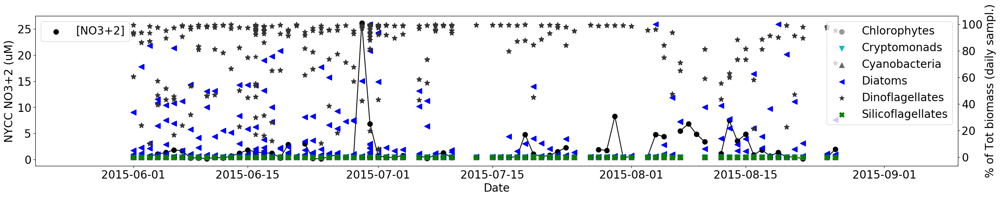

In [267]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2015]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2015],color='k',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2015]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2015],color='k')

ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2015]),data_cellcount_dataflow2.PERCNT_Chlorophytes_biomass[data_cellcount_dataflow2.Year==2015],label='Chlorophytes',marker='o',s=80,color='0.6')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2015]),data_cellcount_dataflow2.PERCNT_Cryptomonads_biomass[data_cellcount_dataflow2.Year==2015],label='Cryptomonads',marker='v',s=80,color='c')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2015]),data_cellcount_dataflow2.PERCNT_Cyanobacteria_biomass[data_cellcount_dataflow2.Year==2015],label='Cyanobacteria',marker='^',s=80,color='0.4')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2015]),data_cellcount_dataflow2.PERCNT_Diatoms_biomass[data_cellcount_dataflow2.Year==2015],label='Diatoms',marker='<',s=80,color='b')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2015]),data_cellcount_dataflow2.PERCNT_Dinoflagellates_biomass[data_cellcount_dataflow2.Year==2015],label='Dinoflagellates',marker='*',s=80,color='0.2')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2015]),data_cellcount_dataflow2.PERCNT_Silicoflagellates_biomass[data_cellcount_dataflow2.Year==2015],label='Silicoflagellates',marker='X',s=80,color='g')

ax30.set_ylabel('% of Tot biomass (daily sampl.)',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
xmin = pd.to_datetime('2015-05-20')
xmax = pd.to_datetime('2015-09-10')
ax30.set_xlim(xmin,xmax)

(736140.0, 736237.0)

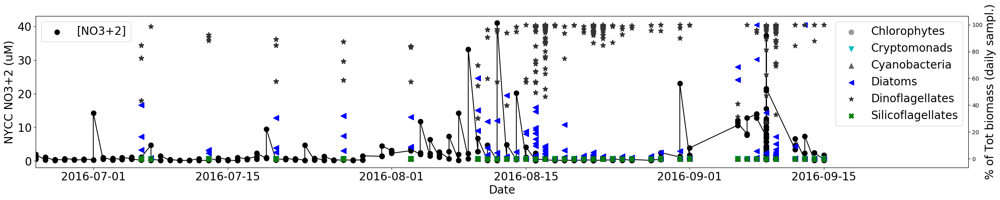

In [269]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2016]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2016],color='k',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2016]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2016],color='k')

ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2016]),data_cellcount_dataflow2.PERCNT_Chlorophytes_biomass[data_cellcount_dataflow2.Year==2016],label='Chlorophytes',marker='o',s=80,color='0.6')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2016]),data_cellcount_dataflow2.PERCNT_Cryptomonads_biomass[data_cellcount_dataflow2.Year==2016],label='Cryptomonads',marker='v',s=80,color='c')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2016]),data_cellcount_dataflow2.PERCNT_Cyanobacteria_biomass[data_cellcount_dataflow2.Year==2016],label='Cyanobacteria',marker='^',s=80,color='0.4')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2016]),data_cellcount_dataflow2.PERCNT_Diatoms_biomass[data_cellcount_dataflow2.Year==2016],label='Diatoms',marker='<',s=80,color='b')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2016]),data_cellcount_dataflow2.PERCNT_Dinoflagellates_biomass[data_cellcount_dataflow2.Year==2016],label='Dinoflagellates',marker='*',s=80,color='0.2')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2016]),data_cellcount_dataflow2.PERCNT_Silicoflagellates_biomass[data_cellcount_dataflow2.Year==2016],label='Silicoflagellates',marker='X',s=80,color='g')

ax30.set_ylabel('% of Tot biomass (daily sampl.)',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
xmin = pd.to_datetime('2016-06-25')
xmax = pd.to_datetime('2016-09-30')
ax30.set_xlim(xmin,xmax)

(736481.0, 736612.0)

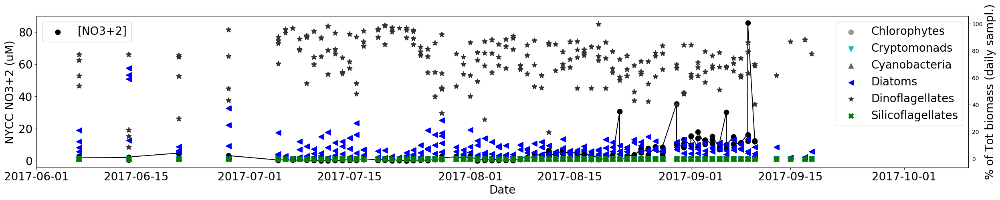

In [273]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2017]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2017],color='k',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2017]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2017],color='k')

ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2017]),data_cellcount_dataflow2.PERCNT_Chlorophytes_biomass[data_cellcount_dataflow2.Year==2017],label='Chlorophytes',marker='o',s=80,color='0.6')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2017]),data_cellcount_dataflow2.PERCNT_Cryptomonads_biomass[data_cellcount_dataflow2.Year==2017],label='Cryptomonads',marker='v',s=80,color='c')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2017]),data_cellcount_dataflow2.PERCNT_Cyanobacteria_biomass[data_cellcount_dataflow2.Year==2017],label='Cyanobacteria',marker='^',s=80,color='0.4')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2017]),data_cellcount_dataflow2.PERCNT_Diatoms_biomass[data_cellcount_dataflow2.Year==2017],label='Diatoms',marker='<',s=80,color='b')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2017]),data_cellcount_dataflow2.PERCNT_Dinoflagellates_biomass[data_cellcount_dataflow2.Year==2017],label='Dinoflagellates',marker='*',s=80,color='0.2')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2017]),data_cellcount_dataflow2.PERCNT_Silicoflagellates_biomass[data_cellcount_dataflow2.Year==2017],label='Silicoflagellates',marker='X',s=80,color='g')

ax30.set_ylabel('% of Tot biomass (daily sampl.)',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
xmin = pd.to_datetime('2017-06-01')
xmax = pd.to_datetime('2017-10-10')
ax30.set_xlim(xmin,xmax)

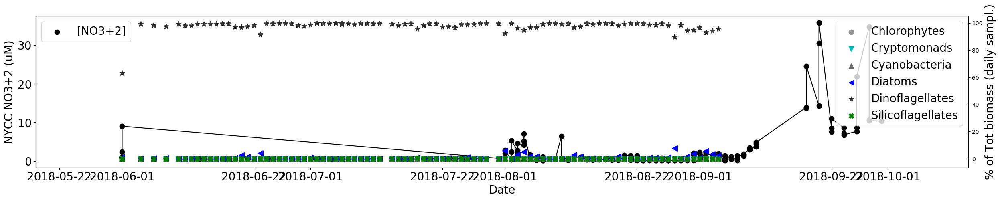

In [274]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2018]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2018],color='k',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2018]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2018],color='k')

ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2018]),data_cellcount_dataflow2.PERCNT_Chlorophytes_biomass[data_cellcount_dataflow2.Year==2018],label='Chlorophytes',marker='o',s=80,color='0.6')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2018]),data_cellcount_dataflow2.PERCNT_Cryptomonads_biomass[data_cellcount_dataflow2.Year==2018],label='Cryptomonads',marker='v',s=80,color='c')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2018]),data_cellcount_dataflow2.PERCNT_Cyanobacteria_biomass[data_cellcount_dataflow2.Year==2018],label='Cyanobacteria',marker='^',s=80,color='0.4')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2018]),data_cellcount_dataflow2.PERCNT_Diatoms_biomass[data_cellcount_dataflow2.Year==2018],label='Diatoms',marker='<',s=80,color='b')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2018]),data_cellcount_dataflow2.PERCNT_Dinoflagellates_biomass[data_cellcount_dataflow2.Year==2018],label='Dinoflagellates',marker='*',s=80,color='0.2')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2018]),data_cellcount_dataflow2.PERCNT_Silicoflagellates_biomass[data_cellcount_dataflow2.Year==2018],label='Silicoflagellates',marker='X',s=80,color='g')

ax30.set_ylabel('% of Tot biomass (daily sampl.)',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)

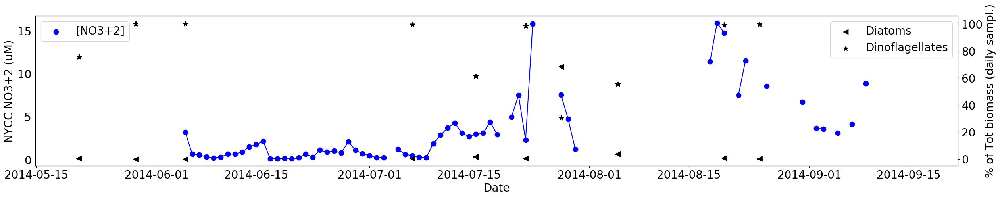

In [142]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2014]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2014],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2014]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2014],color='b')

# ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Chlorophytes_biomass[data_cellcount_dataflow2.Year==2013],label='Chlorophytes',marker='o',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Cryptomonads_biomass[data_cellcount_dataflow2.Year==2013],label='Cryptomonads',marker='v',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Cyanobacteria_biomass[data_cellcount_dataflow2.Year==2013],label='Cyanobacteria',marker='^',s=80,color='k')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2014]),data_cellcount_dataflow2.PERCNT_Diatoms_biomass[data_cellcount_dataflow2.Year==2014],label='Diatoms',marker='<',s=80,color='k')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2014]),data_cellcount_dataflow2.PERCNT_Dinoflagellates_biomass[data_cellcount_dataflow2.Year==2014],label='Dinoflagellates',marker='*',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Silicoflagellates_biomass[data_cellcount_dataflow2.Year==2013],label='Silicoflagellates',marker='X',s=80,color='k')

# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2013],label='% of M.polyk.',marker='x',s=80,color='k')

ax30.set_ylabel('% of Tot biomass (daily sampl.)',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
# xmin = pd.to_datetime('2015-05-20')
# xmax = pd.to_datetime('2015-09-10')
# ax30.set_xlim(xmin,xmax)

(735738.0, 735851.0)

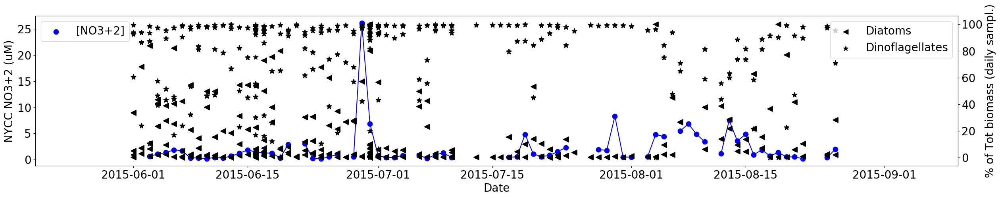

In [128]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2015]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2015],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2015]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2015],color='b')

# ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Chlorophytes_biomass[data_cellcount_dataflow2.Year==2013],label='Chlorophytes',marker='o',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Cryptomonads_biomass[data_cellcount_dataflow2.Year==2013],label='Cryptomonads',marker='v',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Cyanobacteria_biomass[data_cellcount_dataflow2.Year==2013],label='Cyanobacteria',marker='^',s=80,color='k')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2015]),data_cellcount_dataflow2.PERCNT_Diatoms_biomass[data_cellcount_dataflow2.Year==2015],label='Diatoms',marker='<',s=80,color='k')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2015]),data_cellcount_dataflow2.PERCNT_Dinoflagellates_biomass[data_cellcount_dataflow2.Year==2015],label='Dinoflagellates',marker='*',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Silicoflagellates_biomass[data_cellcount_dataflow2.Year==2013],label='Silicoflagellates',marker='X',s=80,color='k')

# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2013],label='% of M.polyk.',marker='x',s=80,color='k')

ax30.set_ylabel('% of Tot biomass (daily sampl.)',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
xmin = pd.to_datetime('2015-05-20')
xmax = pd.to_datetime('2015-09-10')
ax30.set_xlim(xmin,xmax)

(736140.0, 736237.0)

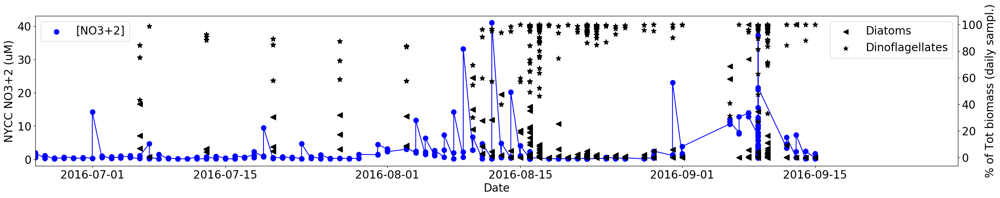

In [136]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2016]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2016],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2016]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2016],color='b')

# ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Chlorophytes_biomass[data_cellcount_dataflow2.Year==2013],label='Chlorophytes',marker='o',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Cryptomonads_biomass[data_cellcount_dataflow2.Year==2013],label='Cryptomonads',marker='v',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Cyanobacteria_biomass[data_cellcount_dataflow2.Year==2013],label='Cyanobacteria',marker='^',s=80,color='k')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2016]),data_cellcount_dataflow2.PERCNT_Diatoms_biomass[data_cellcount_dataflow2.Year==2016],label='Diatoms',marker='<',s=80,color='k')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2016]),data_cellcount_dataflow2.PERCNT_Dinoflagellates_biomass[data_cellcount_dataflow2.Year==2016],label='Dinoflagellates',marker='*',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Silicoflagellates_biomass[data_cellcount_dataflow2.Year==2013],label='Silicoflagellates',marker='X',s=80,color='k')

# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2013],label='% of M.polyk.',marker='x',s=80,color='k')

ax30.set_ylabel('% of Tot biomass (daily sampl.)',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
xmin = pd.to_datetime('2016-06-25')
xmax = pd.to_datetime('2016-09-30')
ax30.set_xlim(xmin,xmax)

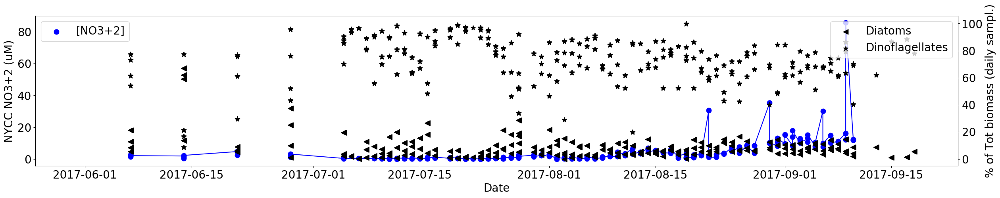

In [137]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2017]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2017],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2017]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2017],color='b')

# ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Chlorophytes_biomass[data_cellcount_dataflow2.Year==2013],label='Chlorophytes',marker='o',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Cryptomonads_biomass[data_cellcount_dataflow2.Year==2013],label='Cryptomonads',marker='v',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Cyanobacteria_biomass[data_cellcount_dataflow2.Year==2013],label='Cyanobacteria',marker='^',s=80,color='k')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2017]),data_cellcount_dataflow2.PERCNT_Diatoms_biomass[data_cellcount_dataflow2.Year==2017],label='Diatoms',marker='<',s=80,color='k')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2017]),data_cellcount_dataflow2.PERCNT_Dinoflagellates_biomass[data_cellcount_dataflow2.Year==2017],label='Dinoflagellates',marker='*',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Silicoflagellates_biomass[data_cellcount_dataflow2.Year==2013],label='Silicoflagellates',marker='X',s=80,color='k')

# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2013],label='% of M.polyk.',marker='x',s=80,color='k')

ax30.set_ylabel('% of Tot biomass (daily sampl.)',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
# xmin = pd.to_datetime('2016-06-25')
# xmax = pd.to_datetime('2016-09-30')
# ax30.set_xlim(xmin,xmax)

(736895.0, 736952.0)

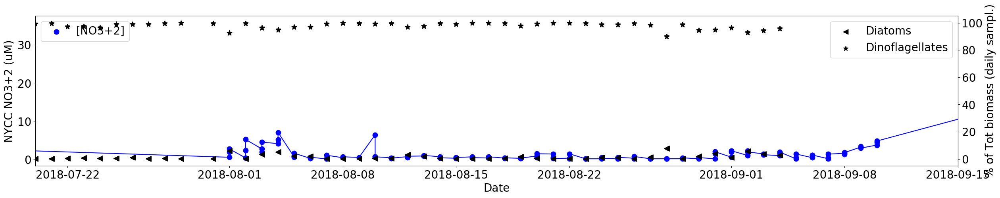

In [140]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2018]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2018],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2018]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2018],color='b')

# ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Chlorophytes_biomass[data_cellcount_dataflow2.Year==2013],label='Chlorophytes',marker='o',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Cryptomonads_biomass[data_cellcount_dataflow2.Year==2013],label='Cryptomonads',marker='v',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Cyanobacteria_biomass[data_cellcount_dataflow2.Year==2013],label='Cyanobacteria',marker='^',s=80,color='k')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2018]),data_cellcount_dataflow2.PERCNT_Diatoms_biomass[data_cellcount_dataflow2.Year==2018],label='Diatoms',marker='<',s=80,color='k')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2018]),data_cellcount_dataflow2.PERCNT_Dinoflagellates_biomass[data_cellcount_dataflow2.Year==2018],label='Dinoflagellates',marker='*',s=80,color='k')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.PERCNT_Silicoflagellates_biomass[data_cellcount_dataflow2.Year==2013],label='Silicoflagellates',marker='X',s=80,color='k')

# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2013],label='% of M.polyk.',marker='x',s=80,color='k')

ax30.set_ylabel('% of Tot biomass (daily sampl.)',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
xmin = pd.to_datetime('2018-07-20')
xmax = pd.to_datetime('2018-09-15')
ax30.set_xlim(xmin,xmax)

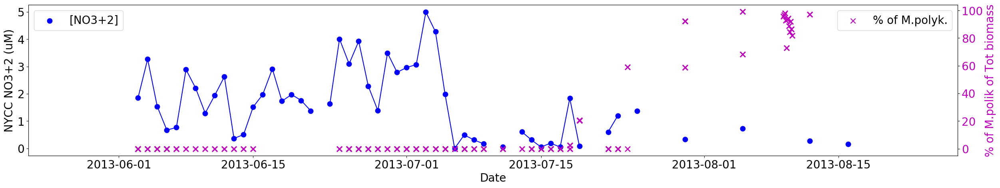

In [96]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2013]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2013],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2013]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2013],color='b')

# ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2013],label='% of M.polyk.',marker='x',s=80,color='m')
ax30.set_ylabel('% of M.polik of Tot biomass',color='m',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='m',labelsize=tamlet)

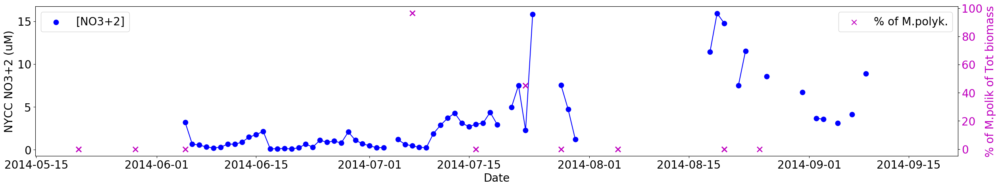

In [97]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2014]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2014],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2014]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2014],color='b')

# ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2014]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2014],label='% of M.polyk.',marker='x',s=80,color='m')
ax30.set_ylabel('% of M.polik of Tot biomass',color='m',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='m',labelsize=tamlet)

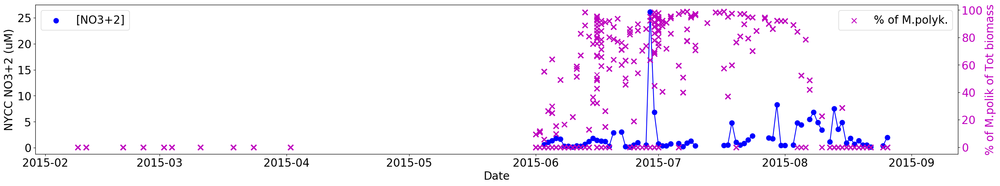

In [102]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2015]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2015],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2015]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2015],color='b')

# ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[(data_cellcount_dataflow2.Year==2015)&(data_cellcount_dataflow2.Month>5)]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[(data_cellcount_dataflow2.Year==2015)&(data_cellcount_dataflow2.Month>5)],label='% of M.polyk.',marker='x',s=80,color='m')
ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2015]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2015],label='% of M.polyk.',marker='x',s=80,color='m')

ax30.set_ylabel('% of M.polik of Tot biomass',color='m',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='m',labelsize=tamlet)

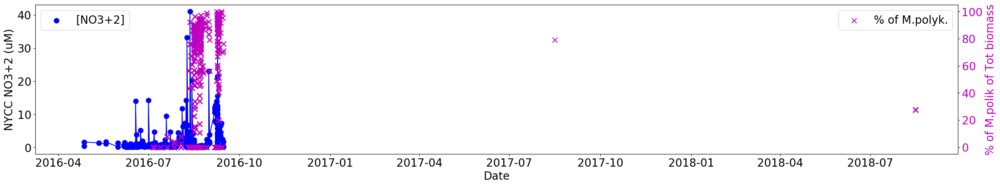

In [120]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2016]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2016],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2016]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2016],color='b')

# ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2016]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2016],label='% of M.polyk.',marker='x',s=80,color='m')
ax30.set_ylabel('% of M.polik of Tot biomass',color='m',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='m',labelsize=tamlet)
# ax30.set_xlim(1/1/2016,12/1/2016)

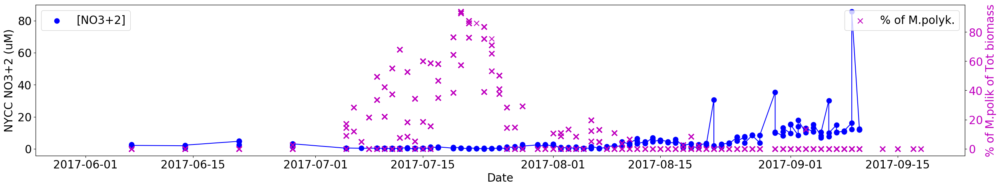

In [121]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2017]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2017],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2017]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2017],color='b')

# ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2017]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2017],label='% of M.polyk.',marker='x',s=80,color='m')
ax30.set_ylabel('% of M.polik of Tot biomass',color='m',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='m',labelsize=tamlet)

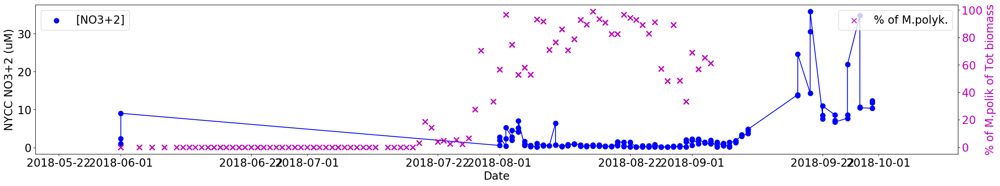

In [124]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2018]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2018],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2018]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2018],color='b')

# ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2018]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2018],label='% of M.polyk.',marker='x',s=80,color='m')
ax30.set_ylabel('% of M.polik of Tot biomass',color='m',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='m',labelsize=tamlet)

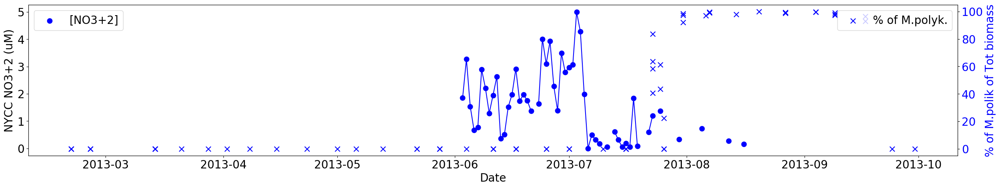

In [14]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2013]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2013],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2013]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2013],color='b')

# ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_uM,color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)


ax30.scatter(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2013)]),data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2013)],label='% of M.polyk.',marker='x',s=80,color='b')
# ax30.scatter(pd.to_datetime(data_cellcount_dataflow2.Date[data_cellcount_dataflow2.Year==2013]),data_cellcount_dataflow2.C_poly_PERCENT_biomass[data_cellcount_dataflow2.Year==2013],label='% of M.polyk.',marker='x',s=80,color='m')
ax30.set_ylabel('% of M.polik of Tot biomass',color='b',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='b',labelsize=tamlet)

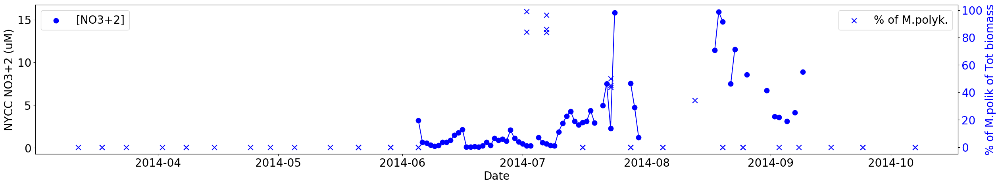

In [15]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2014]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2014],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2014]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2014],color='b')

ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)


ax30.scatter(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2014)]),data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2014)],label='% of M.polyk.',marker='x',s=80,color='b')
ax30.set_ylabel('% of M.polik of Tot biomass',color='b',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='b',labelsize=tamlet)

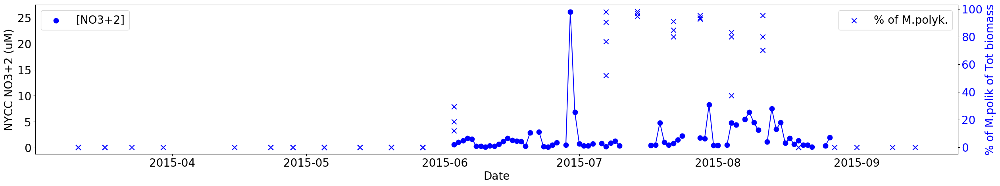

In [16]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2015]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2015],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2015]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2015],color='b')

ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)


ax30.scatter(pd.to_datetime(data_cellcount_dataflow.Date[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2015)]),data_cellcount_dataflow.Cochlodinium_PERCNT_of_total_biomass[(data_cellcount_dataflow.Segment=='LAFMH')&(data_cellcount_dataflow.Year==2015)],label='% of M.polyk.',marker='x',s=80,color='b')
ax30.set_ylabel('% of M.polik of Tot biomass',color='b',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='b',labelsize=tamlet)

# Matching days between Summer Sampling cell counts and dissolved nutrients data
# matchdays_SumSampCellCounts

In [42]:
matchdays_SumSampCellCounts.columns

Index(['Date', 'C_poly_PERCENT_biomass', 'NO2_uM', 'Urea_uM', 'NO3_uM',
       'PO4_uM'],
      dtype='object')

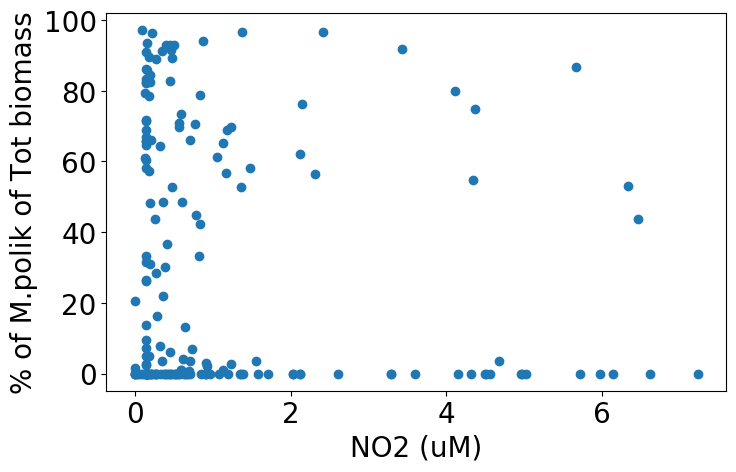

In [44]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.NO2_uM,matchdays_SumSampCellCounts.C_poly_PERCENT_biomass)
# ax3.scatter(data_NYCC_NUTS.NO32_uM,data_NYCC_NUTS.NH4_uM)
ax3.set_ylabel('% of M.polik of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('NO2 (uM)',fontsize=tamlet)
# ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

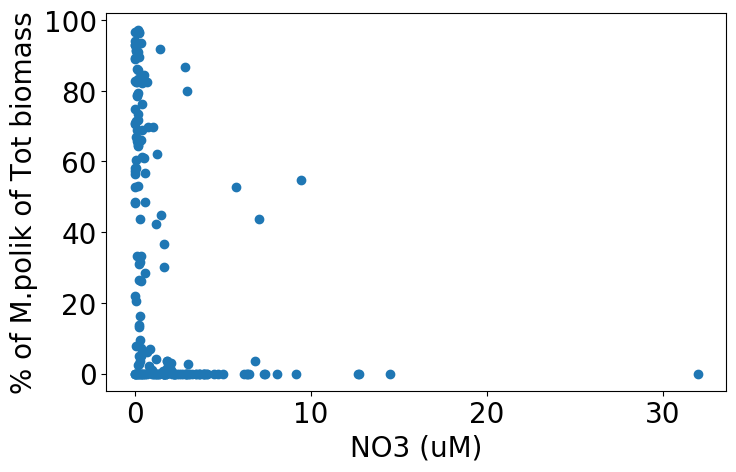

In [45]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.NO3_uM,matchdays_SumSampCellCounts.C_poly_PERCENT_biomass)
# ax3.scatter(data_NYCC_NUTS.NO32_uM,data_NYCC_NUTS.NH4_uM)
ax3.set_ylabel('% of M.polik of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('NO3 (uM)',fontsize=tamlet)
# ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

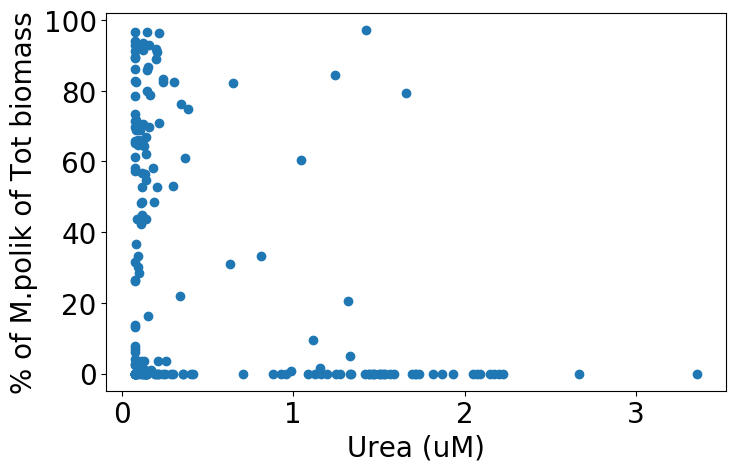

In [46]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.Urea_uM,matchdays_SumSampCellCounts.C_poly_PERCENT_biomass)
# ax3.scatter(data_NYCC_NUTS.NO32_uM,data_NYCC_NUTS.NH4_uM)
ax3.set_ylabel('% of M.polik of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('Urea (uM)',fontsize=tamlet)
# ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

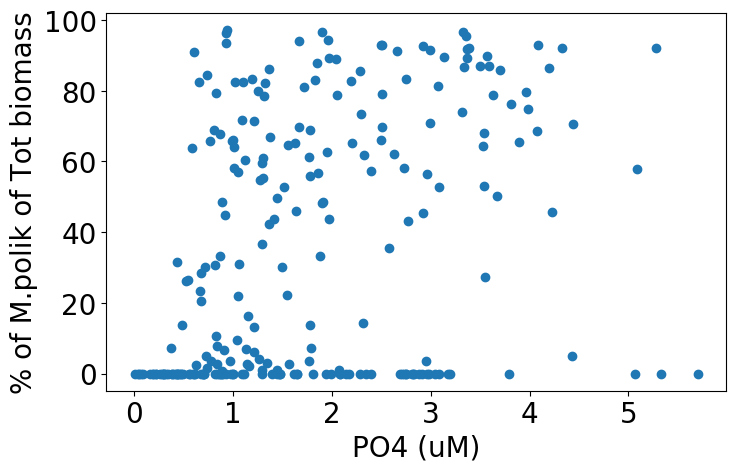

In [47]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.PO4_uM,matchdays_SumSampCellCounts.C_poly_PERCENT_biomass)
# ax3.scatter(data_NYCC_NUTS.NO32_uM,data_NYCC_NUTS.NH4_uM)
ax3.set_ylabel('% of M.polik of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('PO4 (uM)',fontsize=tamlet)
# ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

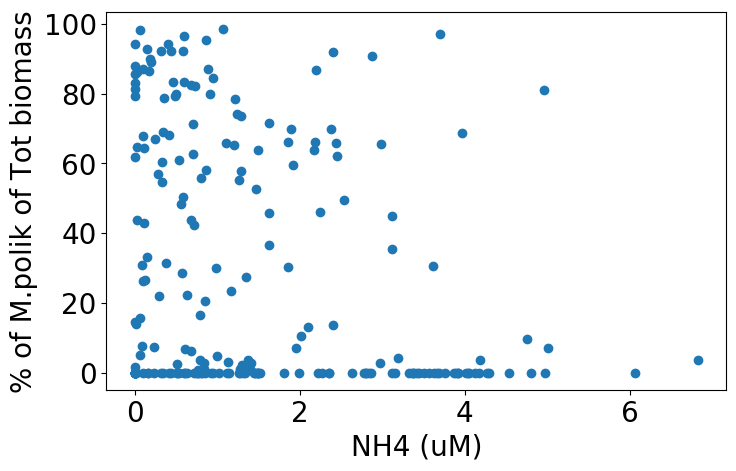

In [80]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.NH4_uM,matchdays_SumSampCellCounts.C_poly_PERCENT_biomass)
# ax3.scatter(data_NYCC_NUTS.NO32_uM,data_NYCC_NUTS.NH4_uM)
ax3.set_ylabel('% of M.polik of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('NH4 (uM)',fontsize=tamlet)
# ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

In [57]:
matchdays_SumSampCellCounts.Year.unique()

array([2012, 2013, 2014, 2015, 2016, 2017, 2018], dtype=int64)

(-5, 120)

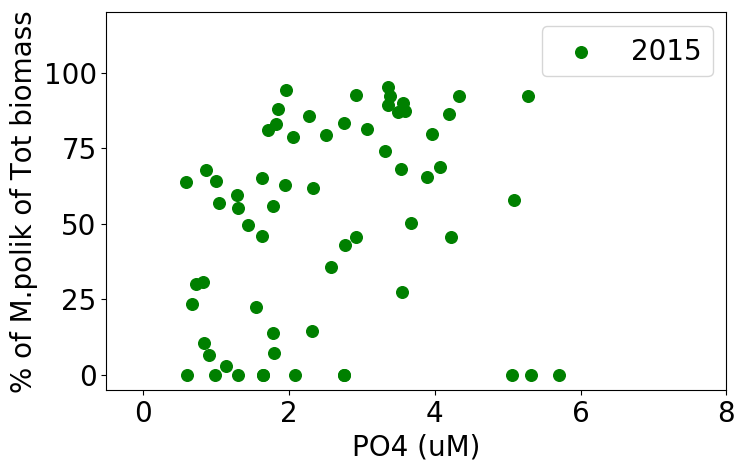

In [74]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
# ax3.scatter(matchdays_SumSampCellCounts.PO4_uM[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.C_poly_PERCENT_biomass[matchdays_SumSampCellCounts.Year==2013],color='c',s=90,label='2013')
# ax3.scatter(matchdays_SumSampCellCounts.PO4_uM[matchdays_SumSampCellCounts.Year==2014],matchdays_SumSampCellCounts.C_poly_PERCENT_biomass[matchdays_SumSampCellCounts.Year==2014],color='b',s=80,label='2014')
ax3.scatter(matchdays_SumSampCellCounts.PO4_uM[matchdays_SumSampCellCounts.Year==2015],matchdays_SumSampCellCounts.C_poly_PERCENT_biomass[matchdays_SumSampCellCounts.Year==2015],color='g',s=70,label='2015')
# ax3.scatter(matchdays_SumSampCellCounts.PO4_uM[matchdays_SumSampCellCounts.Year==2016],matchdays_SumSampCellCounts.C_poly_PERCENT_biomass[matchdays_SumSampCellCounts.Year==2016],color='y',s=60,label='2016')
# ax3.scatter(matchdays_SumSampCellCounts.PO4_uM[matchdays_SumSampCellCounts.Year==2017],matchdays_SumSampCellCounts.C_poly_PERCENT_biomass[matchdays_SumSampCellCounts.Year==2017],color='r',s=50,label='2017')
# ax3.scatter(matchdays_SumSampCellCounts.PO4_uM[matchdays_SumSampCellCounts.Year==2018],matchdays_SumSampCellCounts.C_poly_PERCENT_biomass[matchdays_SumSampCellCounts.Year==2018],color='k',s=40,label='2018')



ax3.set_ylabel('% of M.polik of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('PO4 (uM)',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="upper right",fontsize=tamlet)
ax3.set_xlim(-0.5,8)
ax3.set_ylim(-5,120)

(-5, 120)

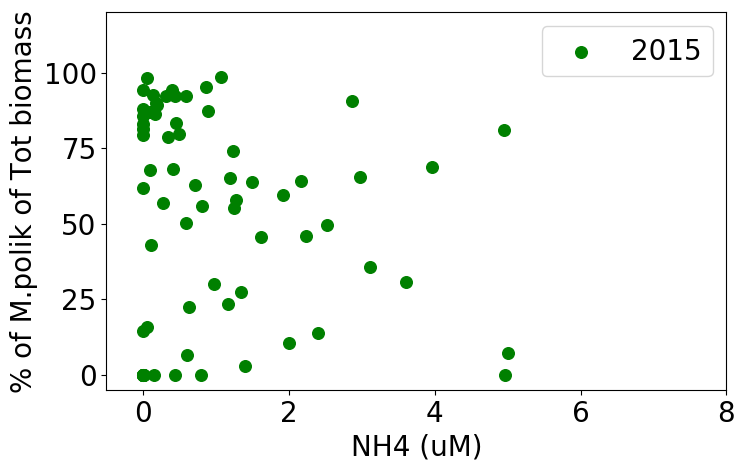

In [84]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
# ax3.scatter(matchdays_SumSampCellCounts.NH4_uM[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.C_poly_PERCENT_biomass[matchdays_SumSampCellCounts.Year==2013],color='c',s=90,label='2013')
# ax3.scatter(matchdays_SumSampCellCounts.NH4_uM[matchdays_SumSampCellCounts.Year==2014],matchdays_SumSampCellCounts.C_poly_PERCENT_biomass[matchdays_SumSampCellCounts.Year==2014],color='b',s=80,label='2014')
ax3.scatter(matchdays_SumSampCellCounts.NH4_uM[matchdays_SumSampCellCounts.Year==2015],matchdays_SumSampCellCounts.C_poly_PERCENT_biomass[matchdays_SumSampCellCounts.Year==2015],color='g',s=70,label='2015')
# ax3.scatter(matchdays_SumSampCellCounts.NH4_uM[matchdays_SumSampCellCounts.Year==2016],matchdays_SumSampCellCounts.C_poly_PERCENT_biomass[matchdays_SumSampCellCounts.Year==2016],color='y',s=60,label='2016')
# ax3.scatter(matchdays_SumSampCellCounts.NH4_uM[matchdays_SumSampCellCounts.Year==2017],matchdays_SumSampCellCounts.C_poly_PERCENT_biomass[matchdays_SumSampCellCounts.Year==2017],color='r',s=50,label='2017')
# ax3.scatter(matchdays_SumSampCellCounts.NH4_uM[matchdays_SumSampCellCounts.Year==2018],matchdays_SumSampCellCounts.C_poly_PERCENT_biomass[matchdays_SumSampCellCounts.Year==2018],color='k',s=40,label='2018')



ax3.set_ylabel('% of M.polik of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('NH4 (uM)',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="upper right",fontsize=tamlet)
ax3.set_xlim(-0.5,8)
ax3.set_ylim(-5,120)

(1, 100)

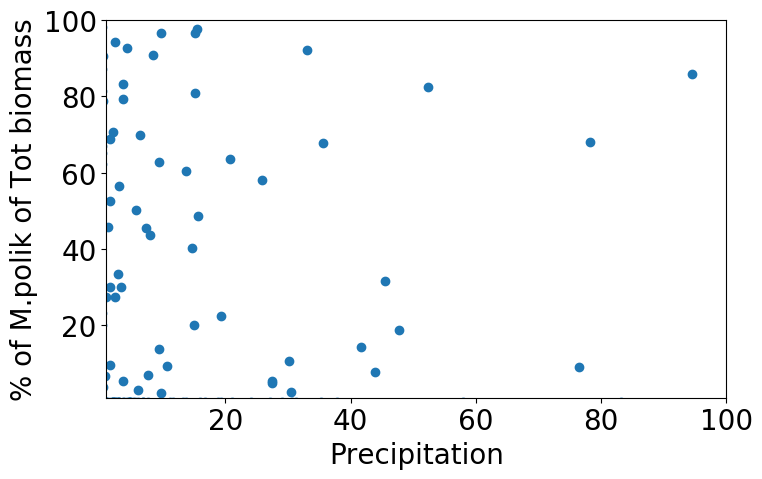

In [94]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.PRCP,matchdays_SumSampCellCounts.C_poly_PERCENT_biomass)
# ax3.scatter(data_NYCC_NUTS.NO32_uM,data_NYCC_NUTS.NH4_uM)
ax3.set_ylabel('% of M.polik of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('Precipitation',fontsize=tamlet)
# ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.set_ylim(1,100)
ax3.set_xlim(1,100)

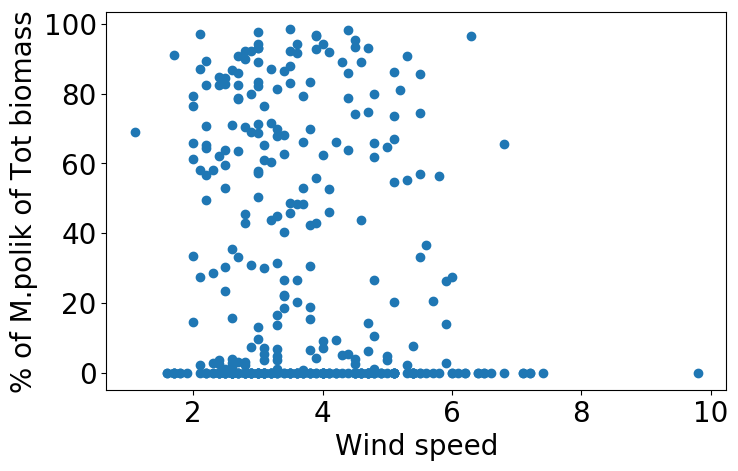

In [93]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.AWND,matchdays_SumSampCellCounts.C_poly_PERCENT_biomass)
# ax3.scatter(data_NYCC_NUTS.NO32_uM,data_NYCC_NUTS.NH4_uM)
ax3.set_ylabel('% of M.polik of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('Wind speed',fontsize=tamlet)
# ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

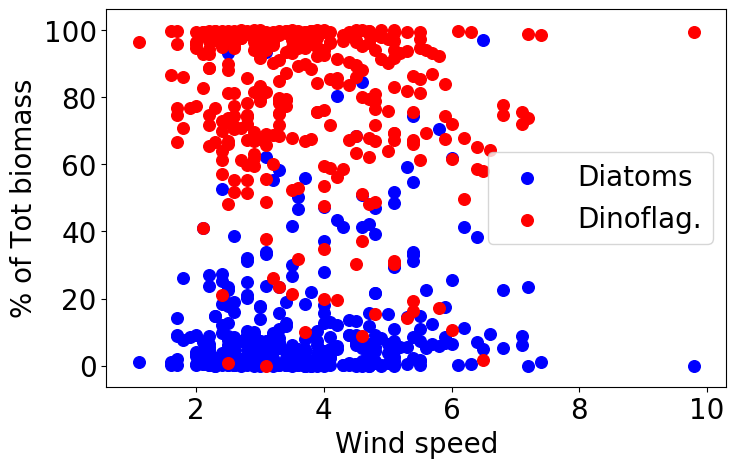

In [145]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.AWND,matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass,color='b',s=70,label='Diatoms')
ax3.scatter(matchdays_SumSampCellCounts.AWND,matchdays_SumSampCellCounts.PERCNT_Dinoflagellates_biomass,color='r',s=70,label='Dinoflag.')

ax3.set_ylabel('% of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('Wind speed',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="center right",fontsize=tamlet)

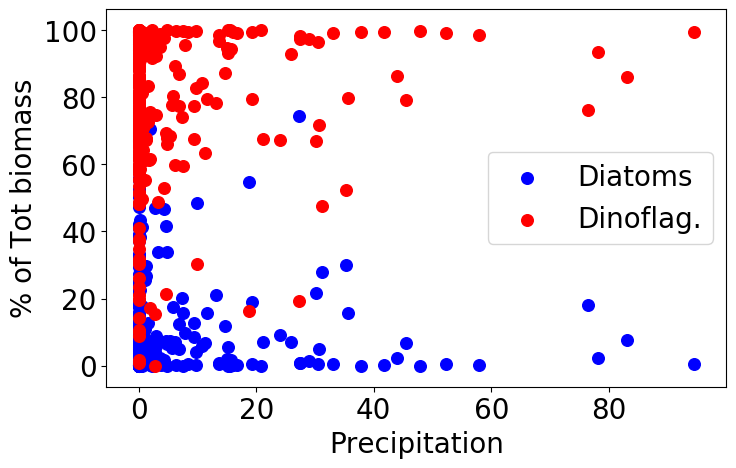

In [146]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.PRCP,matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass,color='b',s=70,label='Diatoms')
ax3.scatter(matchdays_SumSampCellCounts.PRCP,matchdays_SumSampCellCounts.PERCNT_Dinoflagellates_biomass,color='r',s=70,label='Dinoflag.')

ax3.set_ylabel('% of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('Precipitation',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="center right",fontsize=tamlet)

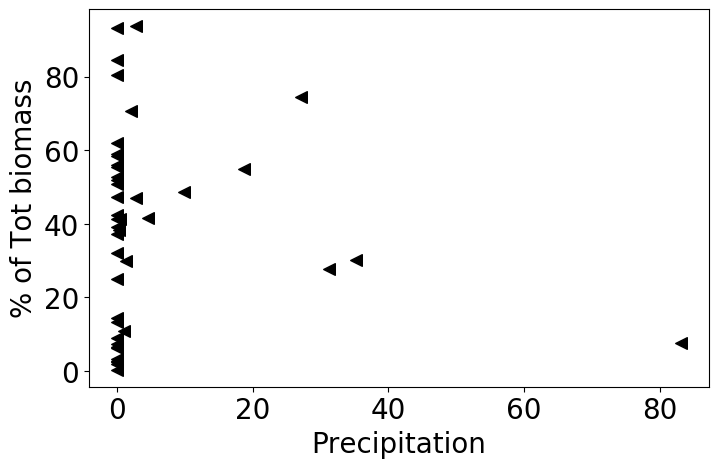

In [236]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.PRCP[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass[matchdays_SumSampCellCounts.Year==2013],color='k',s=70,label='Diatoms-2013',marker='<')
# ax3.scatter(matchdays_SumSampCellCounts.PRCP[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Dinoflagellates_biomass[matchdays_SumSampCellCounts.Year==2013],color='r',s=70,label='Dinoflag.-2013',marker='*')

ax3.set_ylabel('% of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('Precipitation',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
# ax3.legend(loc="center right",fontsize=tamlet)

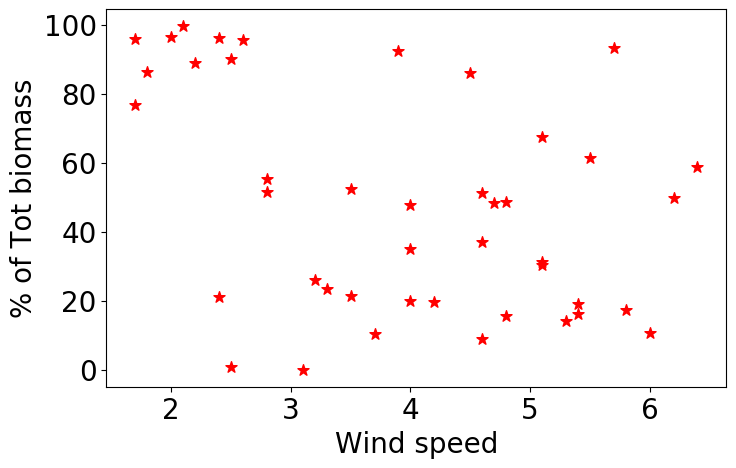

In [239]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
# ax3.scatter(matchdays_SumSampCellCounts.AWND[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass[matchdays_SumSampCellCounts.Year==2013],color='k',s=70,label='Diatoms-2013',marker='<')
ax3.scatter(matchdays_SumSampCellCounts.AWND[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Dinoflagellates_biomass[matchdays_SumSampCellCounts.Year==2013],color='r',s=70,label='Dinoflag.-2013',marker='*')

ax3.set_ylabel('% of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('Wind speed',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
# ax3.legend(loc="center right",fontsize=tamlet)

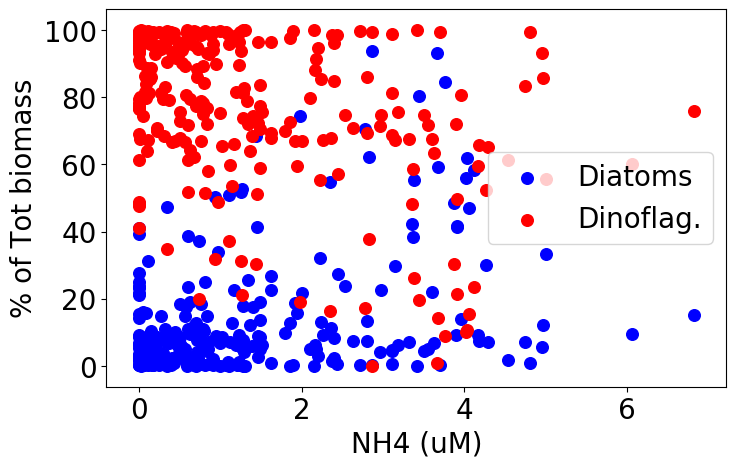

In [148]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.NH4_uM,matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass,color='b',s=70,label='Diatoms')
ax3.scatter(matchdays_SumSampCellCounts.NH4_uM,matchdays_SumSampCellCounts.PERCNT_Dinoflagellates_biomass,color='r',s=70,label='Dinoflag.')

ax3.set_ylabel('% of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('NH4 (uM)',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="center right",fontsize=tamlet)

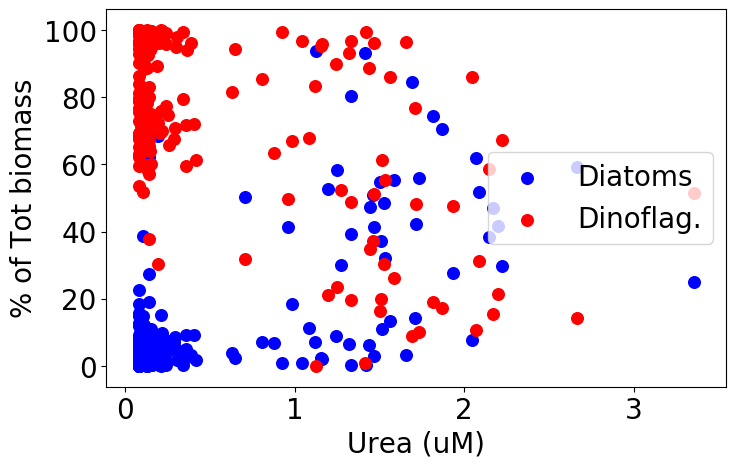

In [149]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.Urea_uM,matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass,color='b',s=70,label='Diatoms')
ax3.scatter(matchdays_SumSampCellCounts.Urea_uM,matchdays_SumSampCellCounts.PERCNT_Dinoflagellates_biomass,color='r',s=70,label='Dinoflag.')

ax3.set_ylabel('% of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('Urea (uM)',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="center right",fontsize=tamlet)

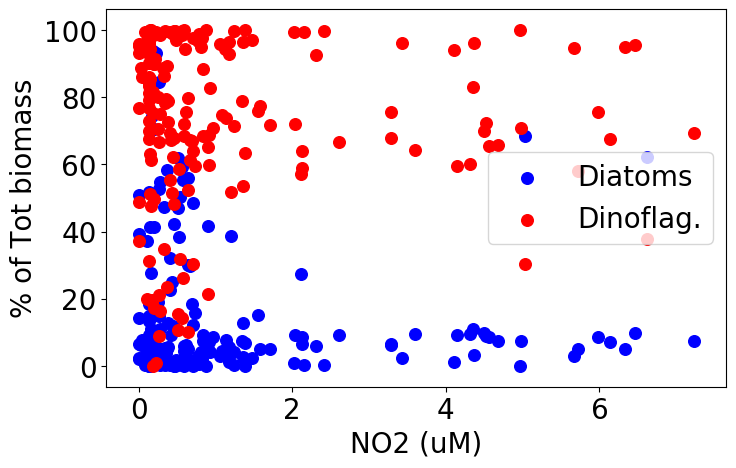

In [150]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.NO2_uM,matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass,color='b',s=70,label='Diatoms')
ax3.scatter(matchdays_SumSampCellCounts.NO2_uM,matchdays_SumSampCellCounts.PERCNT_Dinoflagellates_biomass,color='r',s=70,label='Dinoflag.')

ax3.set_ylabel('% of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('NO2 (uM)',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="center right",fontsize=tamlet)

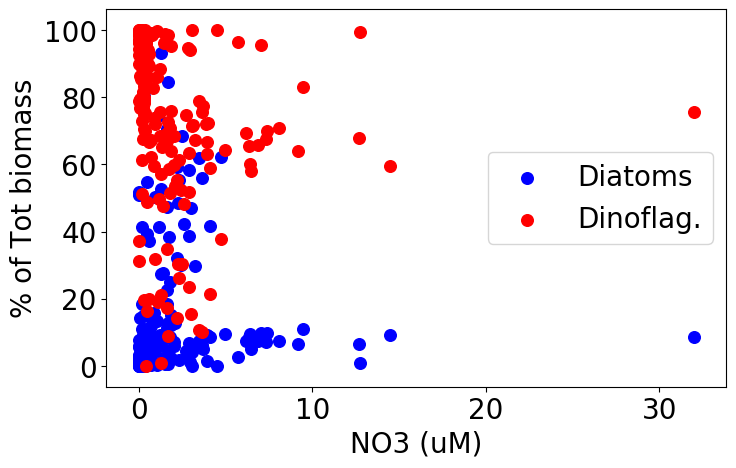

In [151]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.NO3_uM,matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass,color='b',s=70,label='Diatoms')
ax3.scatter(matchdays_SumSampCellCounts.NO3_uM,matchdays_SumSampCellCounts.PERCNT_Dinoflagellates_biomass,color='r',s=70,label='Dinoflag.')

ax3.set_ylabel('% of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('NO3 (uM)',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="center right",fontsize=tamlet)

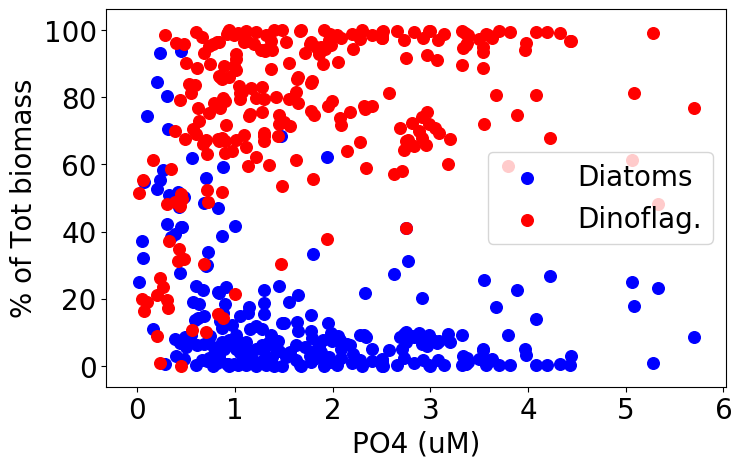

In [152]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.PO4_uM,matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass,color='b',s=70,label='Diatoms')
ax3.scatter(matchdays_SumSampCellCounts.PO4_uM,matchdays_SumSampCellCounts.PERCNT_Dinoflagellates_biomass,color='r',s=70,label='Dinoflag.')

ax3.set_ylabel('% of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('PO4 (uM)',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="center right",fontsize=tamlet)

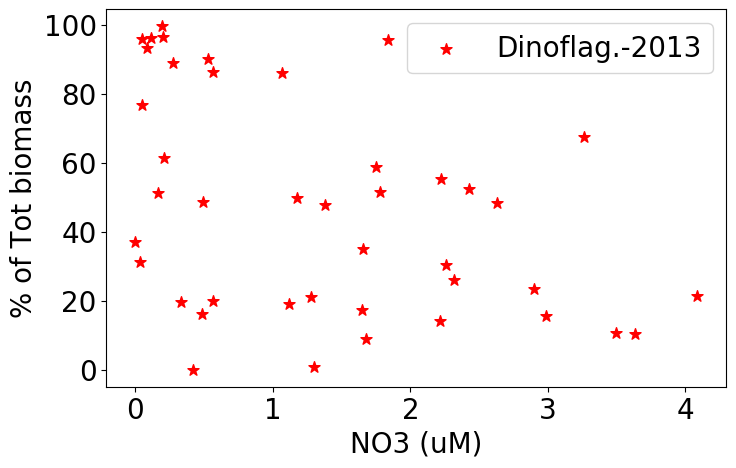

In [261]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
# ax3.scatter(matchdays_SumSampCellCounts.NO3_uM[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass[matchdays_SumSampCellCounts.Year==2013],color='k',s=70,label='Diatoms-2013',marker='<')
ax3.scatter(matchdays_SumSampCellCounts.NO3_uM[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Dinoflagellates_biomass[matchdays_SumSampCellCounts.Year==2013],color='r',s=70,label='Dinoflag.-2013',marker='*')



ax3.plot(matchdays_SumSampCellCounts.NO3_uM[matchdays_SumSampCellCounts.Year==2013],line1, c = 'g')

ax3.set_ylabel('% of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('NO3 (uM)',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="upper right",fontsize=tamlet)

# print(r_value)

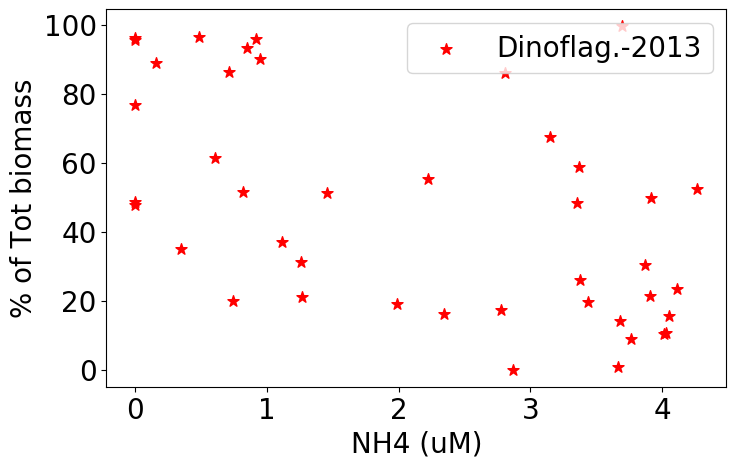

In [165]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
# ax3.scatter(matchdays_SumSampCellCounts.NH4_uM[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass[matchdays_SumSampCellCounts.Year==2013],color='k',s=70,label='Diatoms-2013',marker='<')
ax3.scatter(matchdays_SumSampCellCounts.NH4_uM[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Dinoflagellates_biomass[matchdays_SumSampCellCounts.Year==2013],color='r',s=70,label='Dinoflag.-2013',marker='*')

ax3.set_ylabel('% of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('NH4 (uM)',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="upper right",fontsize=tamlet)

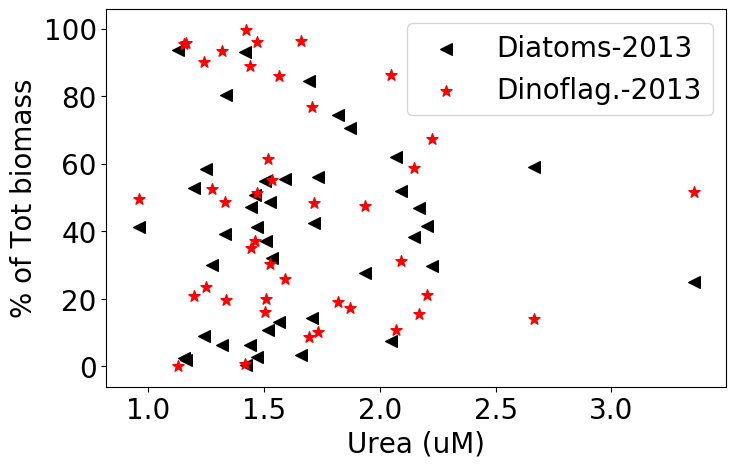

In [171]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
ax3.scatter(matchdays_SumSampCellCounts.Urea_uM[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass[matchdays_SumSampCellCounts.Year==2013],color='k',s=70,label='Diatoms-2013',marker='<')
ax3.scatter(matchdays_SumSampCellCounts.Urea_uM[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Dinoflagellates_biomass[matchdays_SumSampCellCounts.Year==2013],color='r',s=70,label='Dinoflag.-2013',marker='*')

ax3.set_ylabel('% of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('Urea (uM)',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="upper right",fontsize=tamlet)

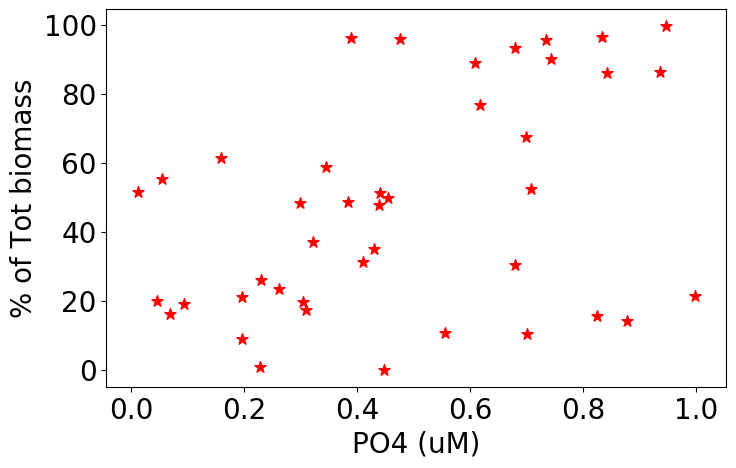

In [178]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
# ax3.scatter(matchdays_SumSampCellCounts.PO4_uM[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass[matchdays_SumSampCellCounts.Year==2013],color='k',s=70,label='Diatoms-2013',marker='<')
ax3.scatter(matchdays_SumSampCellCounts.PO4_uM[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Dinoflagellates_biomass[matchdays_SumSampCellCounts.Year==2013],color='r',s=70,label='Dinoflag.-2013',marker='*')

ax3.set_ylabel('% of Tot biomass',fontsize=tamlet)
ax3.set_xlabel('PO4 (uM)',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
# ax3.legend(loc="upper right",fontsize=tamlet)

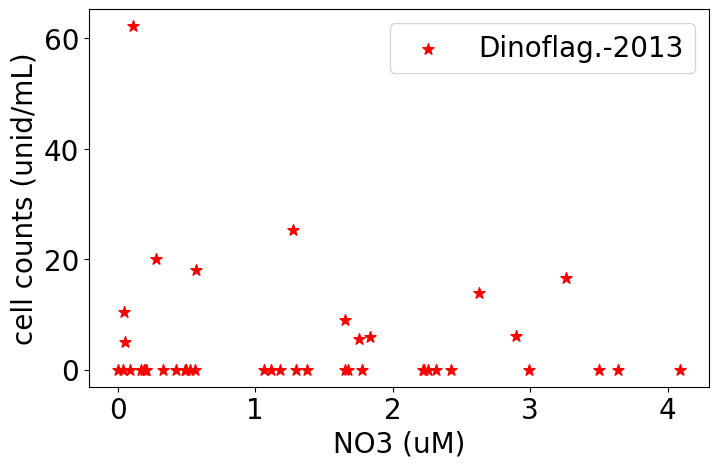

In [248]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
# ax3.scatter(matchdays_SumSampCellCounts.NO3_uM[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass[matchdays_SumSampCellCounts.Year==2013],color='k',s=70,label='Diatoms-2013',marker='<')
ax3.scatter(matchdays_SumSampCellCounts.NO3_uM[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.Dino_unid_ml[matchdays_SumSampCellCounts.Year==2013],color='r',s=70,label='Dinoflag.-2013',marker='*')

ax3.set_ylabel('cell counts (unid/mL)',fontsize=tamlet)
ax3.set_xlabel('NO3 (uM)',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="upper right",fontsize=tamlet)

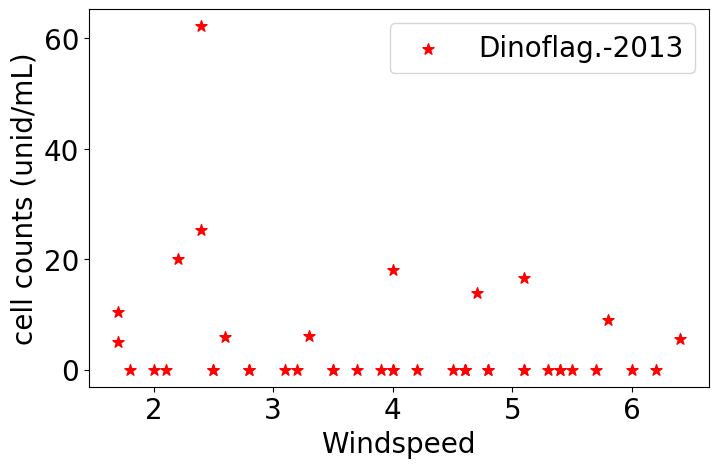

In [253]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
# ax3.scatter(matchdays_SumSampCellCounts.NO3_uM[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.PERCNT_Diatoms_biomass[matchdays_SumSampCellCounts.Year==2013],color='k',s=70,label='Diatoms-2013',marker='<')
ax3.scatter(matchdays_SumSampCellCounts.AWND[matchdays_SumSampCellCounts.Year==2013],matchdays_SumSampCellCounts.Dino_unid_ml[matchdays_SumSampCellCounts.Year==2013],color='r',s=70,label='Dinoflag.-2013',marker='*')

ax3.set_ylabel('cell counts (unid/mL)',fontsize=tamlet)
ax3.set_xlabel('Windspeed',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="upper right",fontsize=tamlet)

(734998.0, 735126.0)

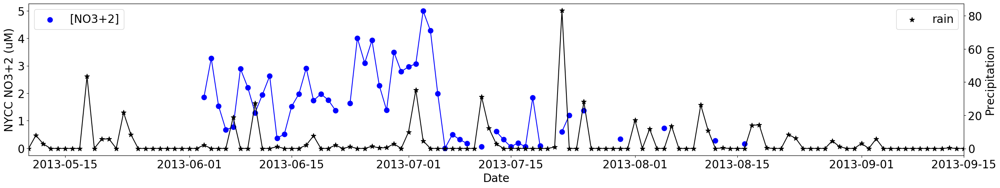

In [185]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2013]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2013],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2013]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2013],color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_NFK_airport.DATE[data_NFK_airport.year==2013]),data_NFK_airport.PRCP[data_NFK_airport.year==2013],label='rain',marker='*',s=80,color='k')
ax30.plot(pd.to_datetime(data_NFK_airport.DATE[data_NFK_airport.year==2013]),data_NFK_airport.PRCP[data_NFK_airport.year==2013],color='k')

ax30.set_ylabel('Precipitation',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
xmin = pd.to_datetime('2013-05-10')
xmax = pd.to_datetime('2013-09-15')
ax30.set_xlim(xmin,xmax)

(734998.0, 735126.0)

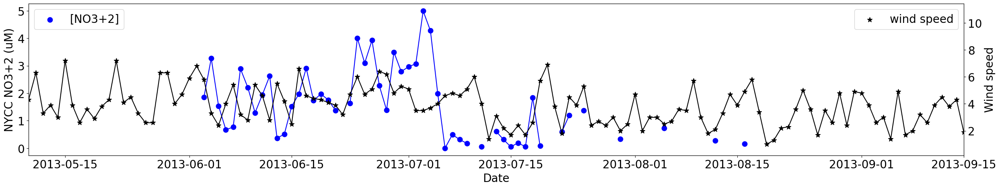

In [187]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2013]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2013],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2013]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2013],color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_NFK_airport.DATE[data_NFK_airport.year==2013]),data_NFK_airport.AWND[data_NFK_airport.year==2013],label='wind speed',marker='*',s=80,color='k')
ax30.plot(pd.to_datetime(data_NFK_airport.DATE[data_NFK_airport.year==2013]),data_NFK_airport.AWND[data_NFK_airport.year==2013],color='k')

ax30.set_ylabel('Wind speed',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
xmin = pd.to_datetime('2013-05-10')
xmax = pd.to_datetime('2013-09-15')
ax30.set_xlim(xmin,xmax)

(734998.0, 735126.0)

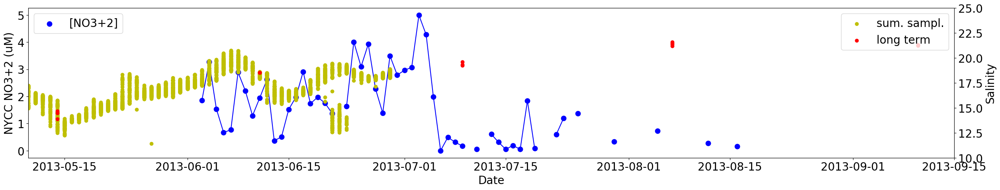

In [202]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2013]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2013],color='b',s=80,label='[NO3+2]')
ax3.plot(pd.to_datetime(data_NYCC_NUTS.Date[data_NYCC_NUTS.Year==2013]),data_NYCC_NUTS.NO32_uM[data_NYCC_NUTS.Year==2013],color='b')
ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(data_jan_jun_2013.SAMPLE_DATETIME),data_jan_jun_2013.SALINITY,color='y',label='sum. sampl.')
ax30.scatter(pd.to_datetime(data_1998_2018_laf01.SampleDate[data_1998_2018_laf01.Parameter=='SALINITY']),data_1998_2018_laf01.MeasureValue[data_1998_2018_laf01.Parameter=='SALINITY'],color='r',label='long term')

ax30.set_ylim(10,25)

ax30.set_ylabel('Salinity',color='k',fontsize=tamlet)
ax30.legend(loc="upper right",fontsize=tamlet)
ax30.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
xmin = pd.to_datetime('2013-05-10')
xmax = pd.to_datetime('2013-09-15')
ax30.set_xlim(xmin,xmax)


(0, 20)

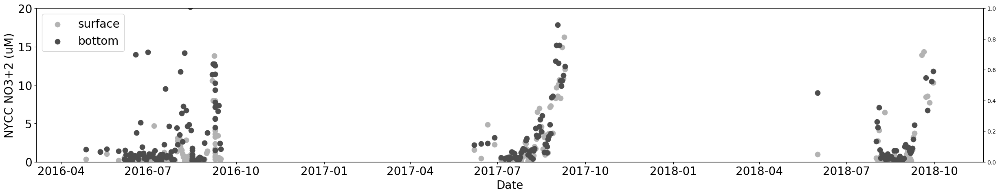

In [20]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[(data_NYCC_NUTS.Depth<2)]),data_NYCC_NUTS.NO32_uM[(data_NYCC_NUTS.Depth<2)],color='0.7',s=80,label='surface')
ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[(data_NYCC_NUTS.Depth>4)]),data_NYCC_NUTS.NO32_uM[(data_NYCC_NUTS.Depth>4)],color='0.3',s=80,label='bottom')


ax3.set_ylabel('NYCC NO3+2 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.set_ylim(0,20)

(0, 5)

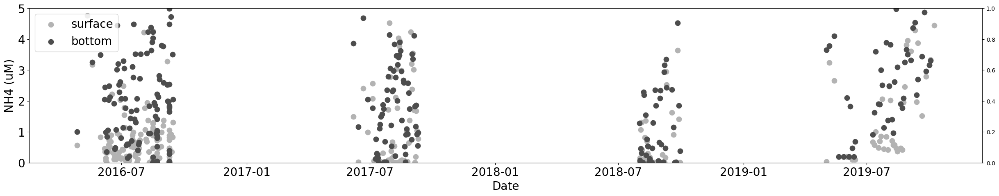

In [22]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[(data_NYCC_NUTS.Depth<2)]),data_NYCC_NUTS.NH4_uM[(data_NYCC_NUTS.Depth<2)],color='0.7',s=80,label='surface')
ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date[(data_NYCC_NUTS.Depth>4)]),data_NYCC_NUTS.NH4_uM[(data_NYCC_NUTS.Depth>4)],color='0.3',s=80,label='bottom')


ax3.set_ylabel('NH4 (uM)',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.set_ylim(0,5)

(-5, 7.5)

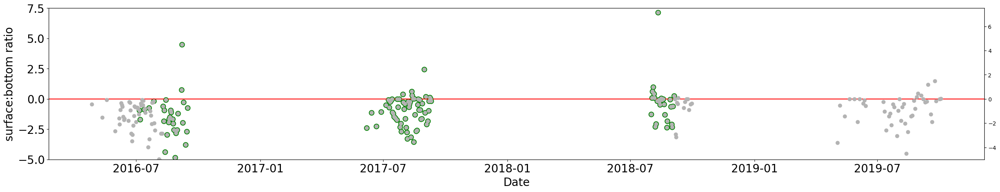

In [76]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(matchdays_SumSampCellCounts.Date),matchdays_SumSampCellCounts.NH4_surf_bottom_ratio,color='g',s=80)

ax3.axhline(y=0,color='r',linestyle='-')

ax3.set_ylabel('surface:bottom ratio',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
# ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.set_ylim(-5,7.5)

ax30.scatter(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NH4_surf_bottom_ratio,color='0.7',s=40,label='NH4')
ax30.set_ylim(-5,7.5)

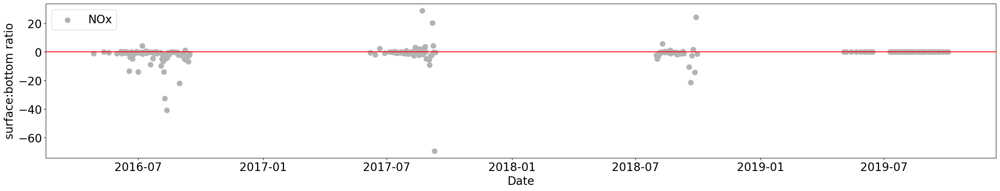

In [59]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
# ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NO32_surf_bottom_ratio,color='0.7',s=80,label='NOx')
ax3.axhline(y=0,color='r',linestyle='-')

ax3.set_ylabel('surface:bottom ratio',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

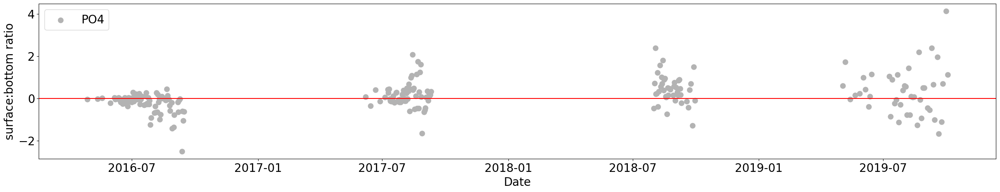

In [60]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
# ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.PO4_surf_bottom_ratio,color='0.7',s=80,label='PO4')
ax3.axhline(y=0,color='r',linestyle='-')

ax3.set_ylabel('surface:bottom ratio',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

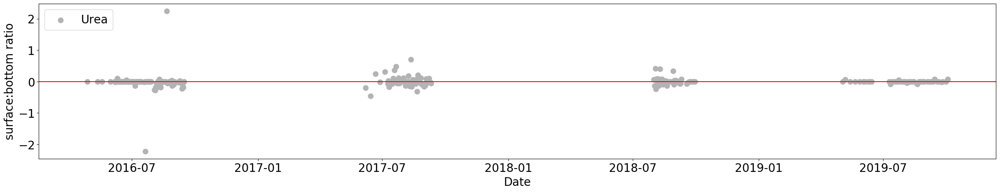

In [63]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
# ax30=ax3.twinx()

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.Urea_surf_bottom_ratio,color='0.7',s=80,label='Urea')
ax3.axhline(y=0,color='r',linestyle='-')

ax3.set_ylabel('surface:bottom ratio',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
# ax3.set_ylim(-1,1)

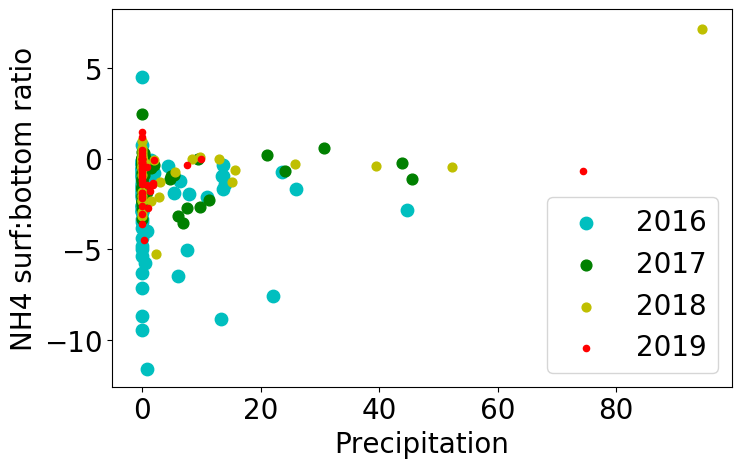

In [95]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
# ax3.scatter(matchdays_NYCC_NUTS.PRCP,matchdays_NYCC_NUTS.NH4_surf_bottom_ratio,color='y',s=70,label='year')
ax3.scatter(matchdays_NYCC_NUTS.PRCP[matchdays_NYCC_NUTS.Year==2016],matchdays_NYCC_NUTS.NH4_surf_bottom_ratio[matchdays_NYCC_NUTS.Year==2016],color='c',s=80,label='2016')
ax3.scatter(matchdays_NYCC_NUTS.PRCP[matchdays_NYCC_NUTS.Year==2017],matchdays_NYCC_NUTS.NH4_surf_bottom_ratio[matchdays_NYCC_NUTS.Year==2017],color='g',s=60,label='2017')
ax3.scatter(matchdays_NYCC_NUTS.PRCP[matchdays_NYCC_NUTS.Year==2018],matchdays_NYCC_NUTS.NH4_surf_bottom_ratio[matchdays_NYCC_NUTS.Year==2018],color='y',s=40,label='2018')
ax3.scatter(matchdays_NYCC_NUTS.PRCP[matchdays_NYCC_NUTS.Year==2019],matchdays_NYCC_NUTS.NH4_surf_bottom_ratio[matchdays_NYCC_NUTS.Year==2019],color='r',s=20,label='2019')

ax3.set_ylabel('NH4 surf:bottom ratio',fontsize=tamlet)
ax3.set_xlabel('Precipitation',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="lower right",fontsize=tamlet)

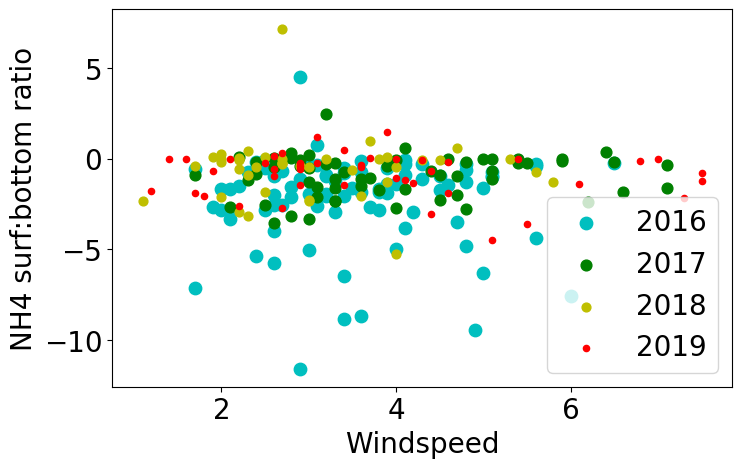

In [96]:
fig, (ax3)=plt.subplots(1,1,figsize=(8,5),dpi=100,sharex='all')
# ax3.scatter(matchdays_NYCC_NUTS.PRCP,matchdays_NYCC_NUTS.NH4_surf_bottom_ratio,color='y',s=70,label='year')
ax3.scatter(matchdays_NYCC_NUTS.AWND[matchdays_NYCC_NUTS.Year==2016],matchdays_NYCC_NUTS.NH4_surf_bottom_ratio[matchdays_NYCC_NUTS.Year==2016],color='c',s=80,label='2016')
ax3.scatter(matchdays_NYCC_NUTS.AWND[matchdays_NYCC_NUTS.Year==2017],matchdays_NYCC_NUTS.NH4_surf_bottom_ratio[matchdays_NYCC_NUTS.Year==2017],color='g',s=60,label='2017')
ax3.scatter(matchdays_NYCC_NUTS.AWND[matchdays_NYCC_NUTS.Year==2018],matchdays_NYCC_NUTS.NH4_surf_bottom_ratio[matchdays_NYCC_NUTS.Year==2018],color='y',s=40,label='2018')
ax3.scatter(matchdays_NYCC_NUTS.AWND[matchdays_NYCC_NUTS.Year==2019],matchdays_NYCC_NUTS.NH4_surf_bottom_ratio[matchdays_NYCC_NUTS.Year==2019],color='r',s=20,label='2019')

ax3.set_ylabel('NH4 surf:bottom ratio',fontsize=tamlet)
ax3.set_xlabel('Windspeed',fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)
ax3.legend(loc="lower right",fontsize=tamlet)

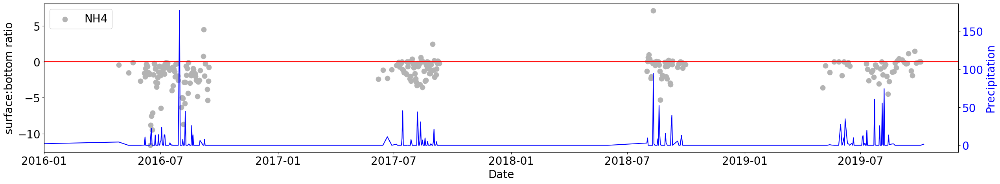

In [105]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

xmin = pd.to_datetime('2016-01-01')
xmax = pd.to_datetime('2019-12-01')

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NH4_surf_bottom_ratio,color='0.7',s=80,label='NH4')
ax3.axhline(y=0,color='r',linestyle='-')

ax3.set_xlim(xmin,xmax)
ax3.set_ylabel('surface:bottom ratio',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.plot(pd.to_datetime(matchdays_NYCC_NUTS.Date),matchdays_NYCC_NUTS.PRCP,color='b')
ax30.set_xlim(xmin,xmax)
ax30.set_ylabel('Precipitation',fontsize=tamlet,color='b')
ax30.tick_params(axis='x',labelcolor='b',labelsize=tamlet)

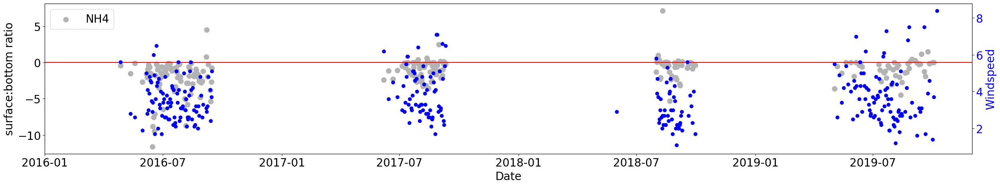

In [109]:
fig, (ax3)=plt.subplots(1,1,figsize=(30,5),dpi=100,sharex='all')
ax30=ax3.twinx()

xmin = pd.to_datetime('2016-01-01')
xmax = pd.to_datetime('2019-12-01')

ax3.scatter(pd.to_datetime(data_NYCC_NUTS.Date),data_NYCC_NUTS.NH4_surf_bottom_ratio,color='0.7',s=80,label='NH4')
ax3.axhline(y=0,color='r',linestyle='-')

ax3.set_xlim(xmin,xmax)
ax3.set_ylabel('surface:bottom ratio',fontsize=tamlet)
ax3.set_xlabel('Date',fontsize=tamlet)
ax3.legend(loc="upper left",fontsize=tamlet)
ax3.tick_params(axis='x',labelcolor='k',labelsize=tamlet)
ax3.tick_params(axis='y',labelcolor='k',labelsize=tamlet)

ax30.scatter(pd.to_datetime(matchdays_NYCC_NUTS.Date),matchdays_NYCC_NUTS.AWND,color='b')
ax30.set_xlim(xmin,xmax)
ax30.set_ylabel('Windspeed',fontsize=tamlet,color='b')
ax30.tick_params(axis='y',labelcolor='b',labelsize=tamlet)